In [90]:
import pandas as pd
from yahoo_fin.stock_info import get_data
import matplotlib.pyplot as plt
import numpy as np

# Data Preparation

In [91]:
# List of tickers for the 30 companies
# custom_tickers = [
#     "AMZN", "AXP", "AMGN", "AAPL", "BA",
#     "CAT", "CSCO", "CVX", "GS", "HD",
#     "HON", "IBM", "INTC", "JNJ", "KO",
#     "JPM", "MCD", "MMM", "MRK", "MSFT",
#     "NKE", "PG", "TRV", "UNH", "CRM",
#     "VZ", "V", "WMT", "DIS", "DJI"
# ]

#PAST DJIA
custom_tickers = [
    "PG", "JNJ", "XOM", "CVX", "MRK", "PFE", "MCD", "T",
    "VZ", "HPQ", "IBM", "MSFT", "INTC", "HD", "WMT", "TRV",
    "RTX", "BA", "AA", "DD", "CAT", "MMM", "DIS", "JPM", "AXP", "GE",
    "CCEP"
    #"CRJ", "H", "BOA"
]

study_periods = [
    ('2001-01-02', '2004-01-06'),
    ('2004-01-06', '2007-01-02'),
    ('2007-01-02', '2010-01-05'),
    ('2010-01-05', '2013-05-14')
]

def calculate_weekly_returns(df):
    weekly_df = df.resample('W').last()
    weekly_df['close'].fillna(method='ffill', inplace=True)
    weekly_df['returns'] = weekly_df['close'].pct_change().fillna(0)
    return weekly_df

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def data_prep(custom_tickers, study_periods):
    # Fetch data for each ticker
    stock_data = {}
    for ticker in custom_tickers:
        try:
            data = get_data(ticker)
            stock_data[ticker] = data
        except AssertionError as e:
            print(f"No data found for {ticker}: {e}")
    weekly_returns_dict = {}

    for ticker, data in stock_data.items():
        data.index = pd.to_datetime(data.index)

        for period_num, (start_date, end_date) in enumerate(study_periods, start=1):
            period_data = data.loc[start_date:end_date]
            period_returns = calculate_weekly_returns(period_data)
            weekly_returns_dict.setdefault(ticker, {})[f'period_{period_num}'] = period_returns
    period_dfs = {}
    # Iterate over the periods
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        # Initialize an empty dictionary to store data for the current period
        period_data = {}

        # Iterate over each ticker's data
        for ticker, data in weekly_returns_dict.items():
            # Drop NaN values from the 'close' column for the current period
            close_prices = data[period][['returns']].dropna()
            period_data[ticker] = close_prices

        # Concatenate the data for all tickers into a single DataFrame for the current period
        period_df = pd.concat(period_data, axis=1)
        period_dfs[period] = period_df.dropna(axis=1)
    correlation_matrices = {}
    for period, period_df in period_dfs.items():
        # Calculate correlation matrix for the current period and store it in the dictionary
        correlation_matrices[period] = period_df.corr()
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)
    return period_dfs, correlation_matrices, distance_matrices

In [92]:
period_dfs, correlation_matrices, distance_matrices = data_prep(custom_tickers, study_periods)

/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68808/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68808/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68808/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68808/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Us

### Random Selection

In [93]:
def calculate_metrics_for_random_selection(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 100
 
    for period, returns_data in period_dfs.items():
        returns_data = returns_data.droplevel(1, axis=1)
        results_by_stocks = {}
        stocks_length_list = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlation = []
            selected_stocks_list = {}
            
            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks
               
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                
                mean_std = (portfolio_return_stocks).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            #stocks_length_list[period] = selected_stocks_list
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]
            
            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

num_stocks_list = [2, 4, 8]
result_df_random = calculate_metrics_for_random_selection(period_dfs, num_stocks_list)
result_df_random

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.011053,0.039129,-0.014285,0.603080,"[T, HD, HPQ, CAT, JNJ, T, MCD, T, JPM, AXP, PG..."
period_1 (4 stocks),0.025993,0.034327,0.080381,0.490247,"[PG, GE, AA, MCD, VZ, RTX, XOM, PFE, AA, HD, J..."
period_1 (8 stocks),0.042859,0.030462,0.145261,0.365475,"[MRK, CVX, MCD, CCEP, T, XOM, AA, AXP, CVX, HP..."
period_2 (2 stocks),0.208246,0.021997,1.006255,0.279078,"[PG, DD, HPQ, GE, AXP, HPQ, INTC, JNJ, DIS, MM..."
period_2 (4 stocks),0.238175,0.018543,1.305761,0.340007,"[PFE, AA, IBM, T, CAT, HPQ, CVX, GE, XOM, JPM,..."
period_2 (8 stocks),0.261936,0.015951,1.664643,0.230135,"[CAT, IBM, RTX, JNJ, DD, INTC, PFE, GE, AA, WM..."
period_3 (2 stocks),-0.031573,0.043341,-0.049552,0.721445,"[DD, BA, DD, MCD, JNJ, MSFT, MRK, CCEP, T, JNJ..."
period_3 (4 stocks),0.003542,0.039924,0.026357,0.511061,"[BA, AXP, DD, JNJ, MMM, JPM, AXP, HPQ, HD, DD,..."
period_3 (8 stocks),0.012544,0.037335,0.041618,0.462170,"[DD, TRV, RTX, HD, PFE, VZ, JNJ, CVX, CVX, TRV..."
period_4 (2 stocks),0.435733,0.027017,1.751607,0.380109,"[XOM, AA, JPM, BA, IBM, CCEP, XOM, WMT, JPM, M..."


### Hierarchical Clustering

In [94]:
import numpy as np
from scipy.cluster.hierarchy import average, fcluster, linkage
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Function to perform hierarchical clustering and print stocks in each cluster
def hierarchical_clustering(distance_matrix, labels, period):
#    linkage_matrix = average(distance_matrix)
    linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
    labels = [label[0] for label in labels]

    # Set the figure size to be larger
    plt.figure(figsize=(12, 8))  # Adjust the size as needed

    # Plot the dendrogram
    dendrogram(average(distance_matrix), labels=labels, orientation='top')

    # Customize plot title and axis labels
    plt.title(f'Hierarchical Clustering Dendrogram - {period}')
    plt.xlabel('Stocks')
    plt.ylabel('Distance')

    # Create dictionary to store stocks in each cluster for 2, 4, and 8 clusters
    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}
    
    # Perform clustering to get cluster labels for 2, 4, and 8 clusters
    for num_clusters in [2, 4, 8]:
        cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
        
        # Assign stocks to clusters
        for stock, cluster_label in zip(labels, cluster_labels):
            if cluster_label not in cluster_stocks[num_clusters]:
                cluster_stocks[num_clusters][cluster_label] = [stock]
            else:
                cluster_stocks[num_clusters][cluster_label].append(stock)

    # Show the plot
    plt.show()
    
    return cluster_stocks

def HCT(distance_matrices):
    # Create a dictionary to store cluster stocks for each period
    all_cluster_stocks_HCT = {}
    # Perform hierarchical clustering and plot dendrogram for each study period
    for period, distance_matrix in distance_matrices.items():
        all_cluster_stocks_HCT[period] = hierarchical_clustering(distance_matrix.values, distance_matrix.index, period)
    return all_cluster_stocks_HCT

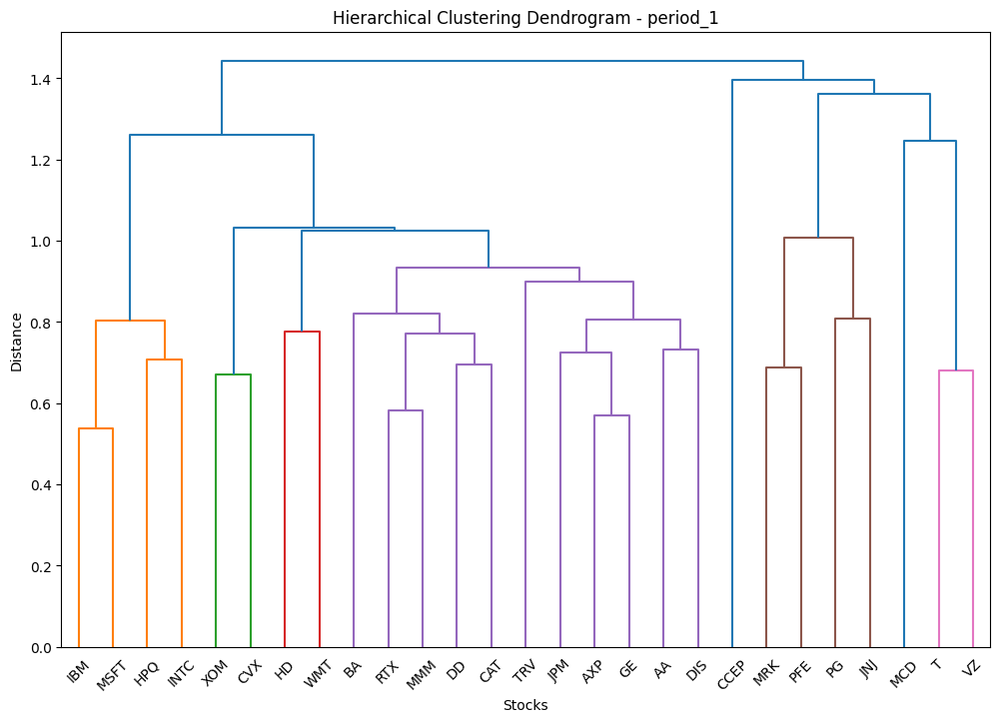

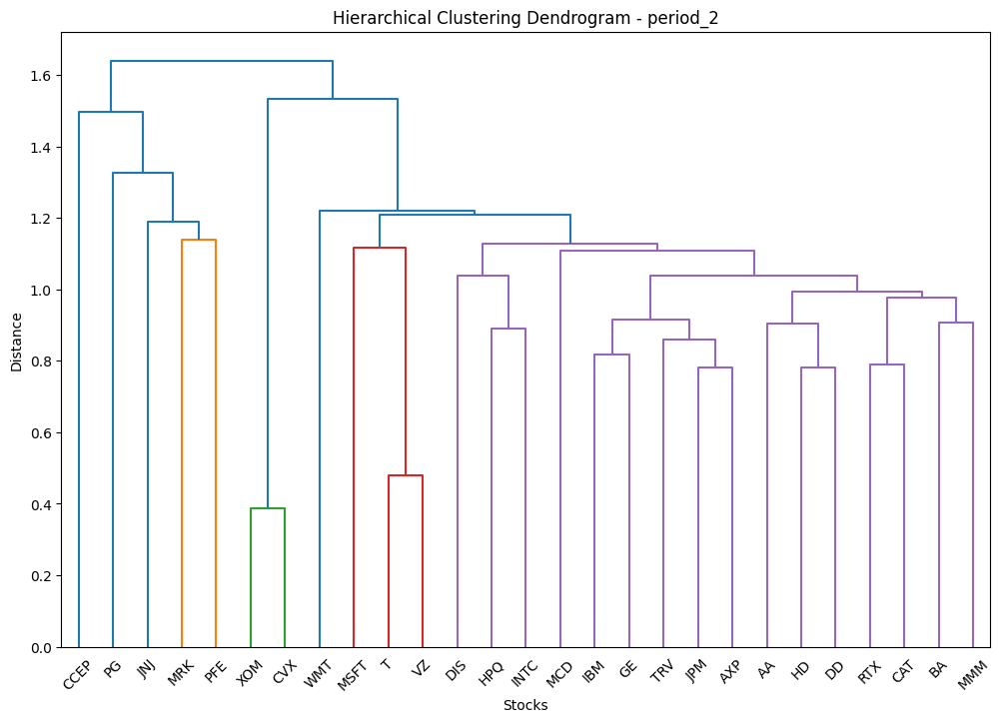

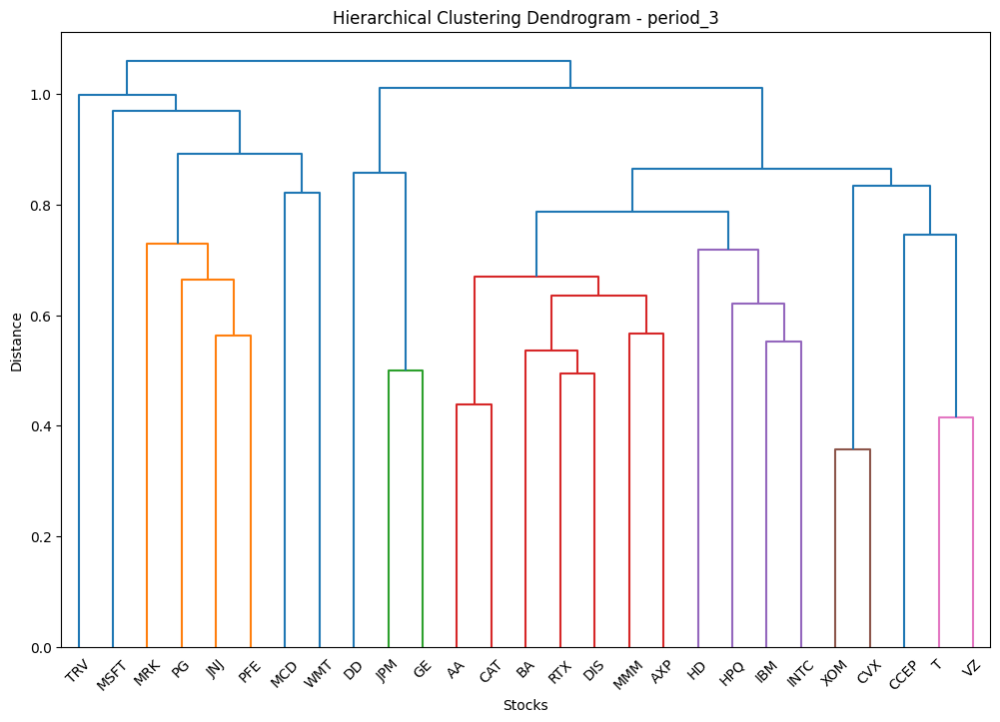

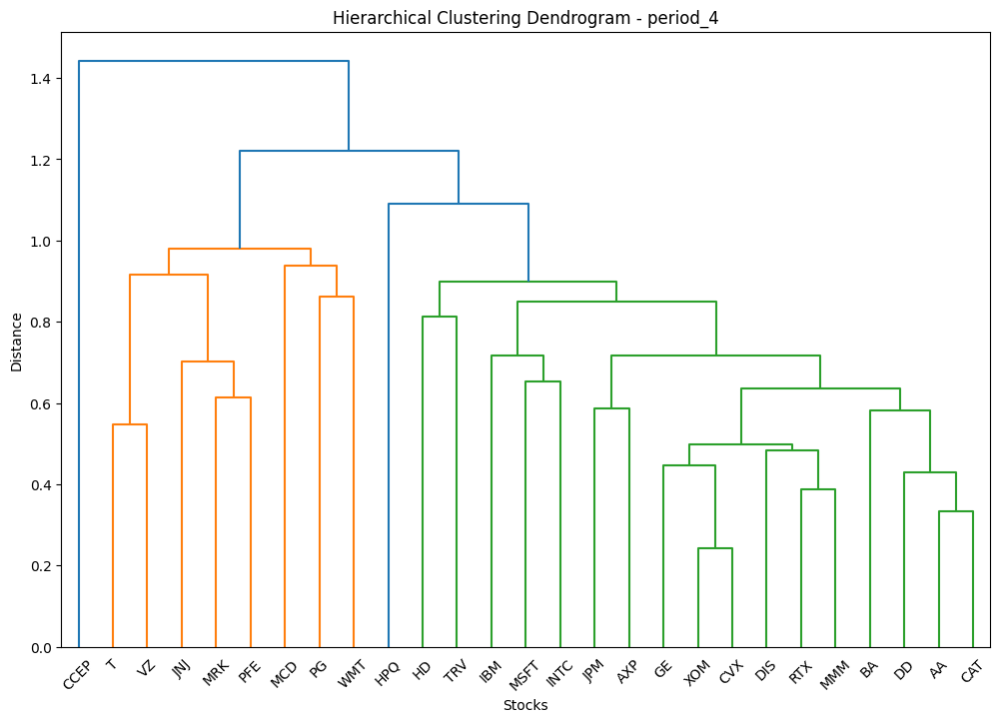

In [95]:
all_cluster_stocks_HCT = HCT(correlation_matrices)

In [96]:
import pandas as pd
import numpy as np

def calculate_metrics_for_all_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100

    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                #print(returns_data[selected_stocks].std())
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(mean_correlation)
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [97]:
result_df_HCT = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT, period_dfs)
result_df_HCT

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.018859,0.035788,0.078376,0.338680,"[PG, BA, VZ, MSFT, PG, BA, MCD, RTX, PFE, INTC..."
period_1 (4 stocks),0.026619,0.031265,0.099286,0.260722,"[MRK, DD, CCEP, IBM, PG, BA, MCD, HPQ, PFE, CV..."
period_1 (8 stocks),0.015194,0.027749,0.059770,0.275660,"[MRK, XOM, MCD, VZ, MSFT, JPM, DD, CCEP, JNJ, ..."
period_2 (2 stocks),0.261719,0.021103,1.321985,0.080877,"[PFE, GE, XOM, GE, MRK, T, MRK, DIS, JNJ, DIS,..."
period_2 (4 stocks),0.332631,0.017008,2.023095,0.204755,"[PFE, XOM, MCD, INTC, PFE, XOM, BA, INTC, PFE,..."
period_2 (8 stocks),0.266143,0.013441,1.995518,0.161916,"[PG, PFE, XOM, WMT, T, HPQ, AA, CCEP, PG, MRK,..."
period_3 (2 stocks),-0.028786,0.042294,-0.033397,0.503973,"[CVX, GE, MSFT, JPM, MSFT, AA, PG, JPM, T, AXP..."
period_3 (4 stocks),-0.031550,0.040852,-0.078606,0.452582,"[PG, XOM, MMM, JPM, PG, T, HPQ, GE, WMT, T, HP..."
period_3 (8 stocks),0.014434,0.035429,0.041423,0.469827,"[JNJ, CVX, MCD, VZ, INTC, TRV, BA, JPM, PG, CV..."
period_4 (2 stocks),0.513177,0.024328,2.218134,0.501066,"[VZ, INTC, MRK, DIS, MRK, MMM, JNJ, BA, T, CAT..."


### K-Means

In [98]:
from sklearn.cluster import KMeans
import numpy as np

In [99]:
periods = ['period_1','period_2','period_3','period_4']

In [100]:
# Function to perform K-means clustering
def kmeans_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels = kmeans.fit_predict(data)
    centroid_vectors = kmeans.cluster_centers_
    return cluster_labels, centroid_vectors

In [101]:
def generate_clusters_and_centroids(periods, distance_matrices, tickers):
    stocks = tickers
    all_cluster_stocks_kmeans = {}
    all_centroid_vectors = {}

    for period in periods:
        X = distance_matrices[period]
        
        clusters_for_period = {}
        centroid_vectors_for_period = {}
        
        for size in ['2', '4', '8']:  # Using strings instead of integers
            cluster_labels, centroid_vectors = kmeans_clustering(X, num_clusters=int(size))  # Convert size to integer
            clusters = {}
            centroid_dict = {}
            
            for cluster_num in range(int(size)):  # Convert size to integer
                clusters[str(cluster_num + 1)] = []  # Convert cluster_num to string
                centroid_dict[str(cluster_num + 1)] = [centroid_vectors[cluster_num]]  # Store centroid vector as a list
                
            for idx, label in enumerate(cluster_labels):
                clusters[str(label + 1)].append(stocks[idx])  # Convert label to string
            
            clusters_for_period[size] = clusters
            centroid_vectors_for_period[size] = centroid_dict
        
        all_cluster_stocks_kmeans[period] = clusters_for_period
        all_centroid_vectors[period] = centroid_vectors_for_period

    return all_cluster_stocks_kmeans, all_centroid_vectors

all_cluster_stocks_kmeans, centroid_vectors = generate_clusters_and_centroids(periods, distance_matrices, custom_tickers)

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: Fut

In [102]:
result_df_kmeans_rand = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.025367,0.035091,0.103514,0.282010,"[MMM, MRK, RTX, CCEP, INTC, JNJ, BA, PFE, XOM,..."
period_1 (4 stocks),0.008794,0.029651,0.029637,0.212201,"[JPM, PFE, PG, DIS, WMT, VZ, CCEP, MCD, BA, PF..."
period_1 (8 stocks),0.021330,0.026908,0.087222,0.295684,"[CAT, JNJ, MSFT, VZ, CCEP, WMT, XOM, TRV, BA, ..."
period_2 (2 stocks),0.263456,0.020224,1.377421,0.088590,"[CCEP, RTX, JNJ, MCD, MRK, MSFT, JNJ, AXP, XOM..."
period_2 (4 stocks),0.314667,0.016933,1.902317,0.169287,"[MRK, T, MCD, XOM, PG, INTC, MMM, CVX, PG, IBM..."
period_2 (8 stocks),0.261001,0.015541,1.703066,0.184917,"[MSFT, MRK, DD, MMM, CCEP, T, XOM, RTX, HPQ, J..."
period_3 (2 stocks),-0.056674,0.042239,-0.105575,0.534277,"[T, HD, JNJ, AXP, XOM, RTX, MCD, JPM, PFE, AXP..."
period_3 (4 stocks),-0.013466,0.042584,-0.035229,0.405109,"[CCEP, XOM, IBM, AXP, JNJ, AA, MSFT, AXP, MRK,..."
period_3 (8 stocks),0.024927,0.037502,0.067369,0.524340,"[AA, XOM, PFE, JPM, CCEP, WMT, IBM, VZ, CAT, C..."
period_4 (2 stocks),0.453606,0.024536,1.947818,0.300374,"[BA, WMT, IBM, T, HPQ, JNJ, XOM, TRV, AA, PG, ..."


In [103]:
def calculate_metrics_for_kmeans(all_cluster_stocks, period_dfs, centroid_vectors,distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        stocks_by_cluster = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[period][str(num_clusters)]
                distance_matrix = distance_matrices[period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : [selected_stocks]}

        results_by_period[period] = results_by_cluster
        stocks_by_period[period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [104]:
result_df_kmeans, stocks_by_period_kmeans = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)

In [105]:
result_df_kmeans

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.213123,0.030766,-0.692727,0.263464,"[WMT, MRK]"
period_1 (4 stocks),-0.151859,0.030970,-0.490348,0.278340,"[GE, MRK, CCEP, DIS]"
period_1 (8 stocks),-0.117990,0.029127,-0.405089,0.331010,"[GE, MRK, HPQ, T, CCEP, WMT, XOM, TRV]"
period_2 (2 stocks),0.007040,0.023190,0.030360,0.185491,"[PFE, TRV]"
period_2 (4 stocks),0.187270,0.017804,1.051845,0.216040,"[PFE, TRV, MMM, XOM]"
period_2 (8 stocks),0.252434,0.016425,1.536859,0.236112,"[TRV, PFE, DD, HD, CCEP, VZ, XOM, BA]"
period_3 (2 stocks),-0.088398,0.042592,-0.207543,0.564727,"[PFE, CCEP]"
period_3 (4 stocks),0.003108,0.047248,0.006578,0.567932,"[CCEP, DIS, INTC, AXP]"
period_3 (8 stocks),-0.008633,0.040830,-0.021145,0.529967,"[AA, CVX, PFE, AXP, DIS, MCD, INTC, VZ]"
period_4 (2 stocks),0.991680,0.025792,3.844910,0.547225,"[DIS, TRV]"


### Minimum Spanning Trees

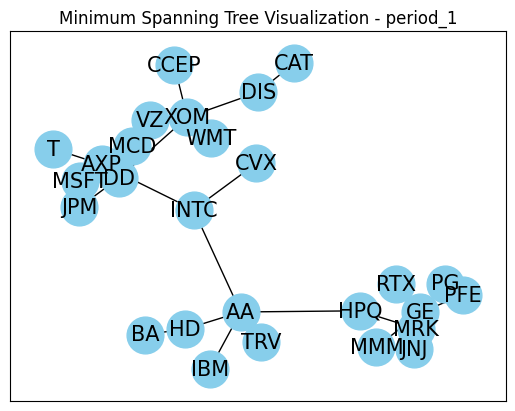

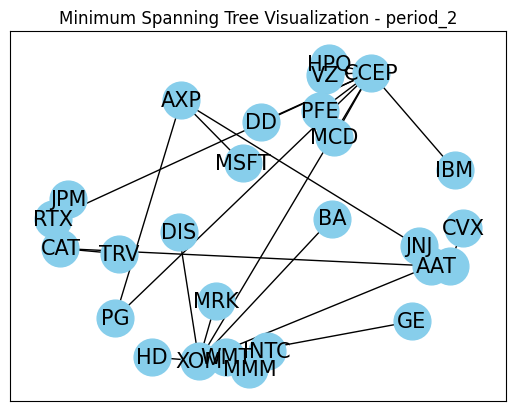

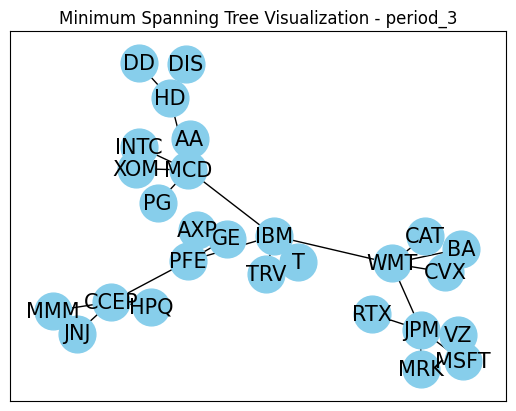

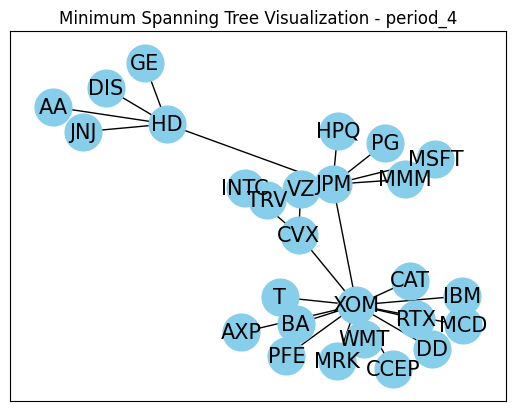

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


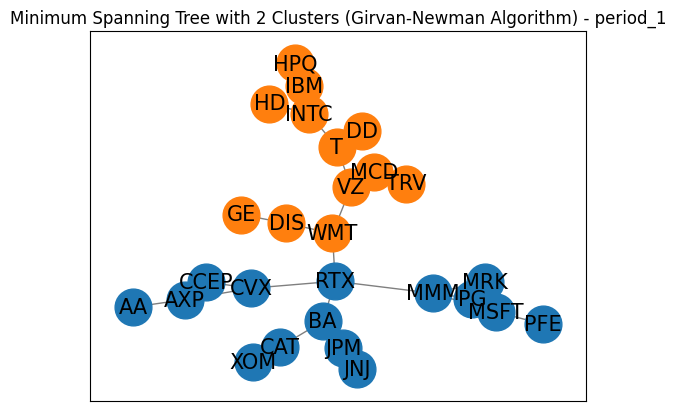

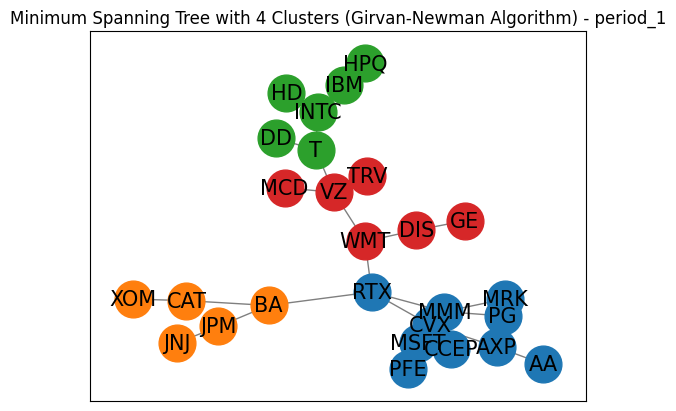

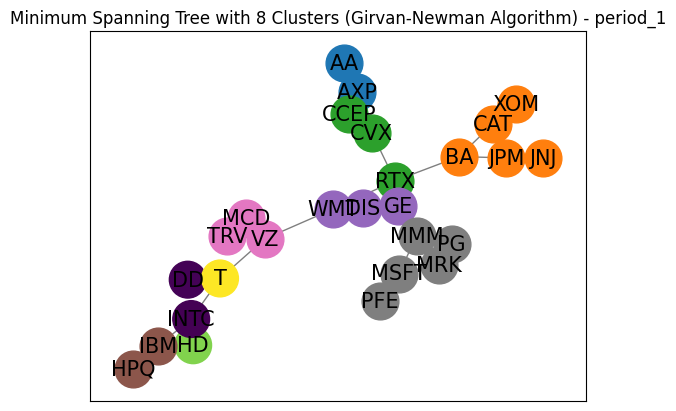

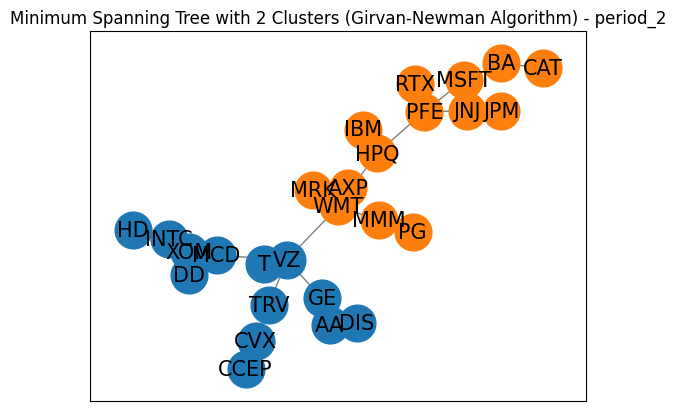

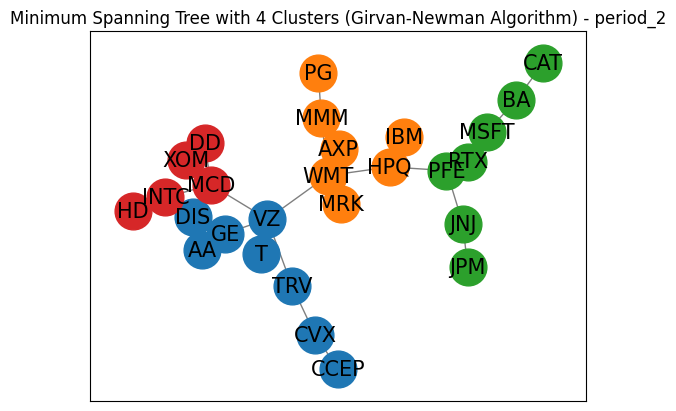

...

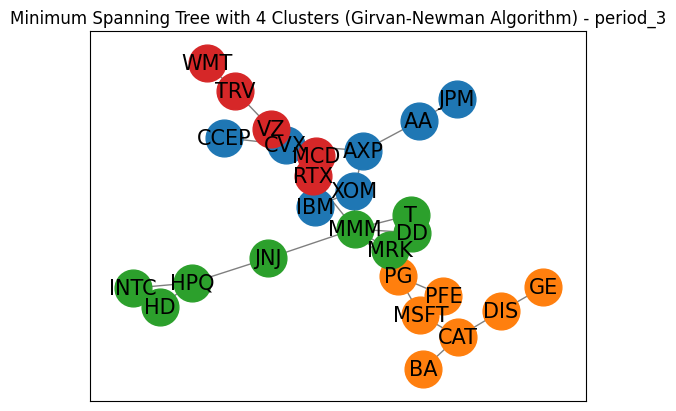

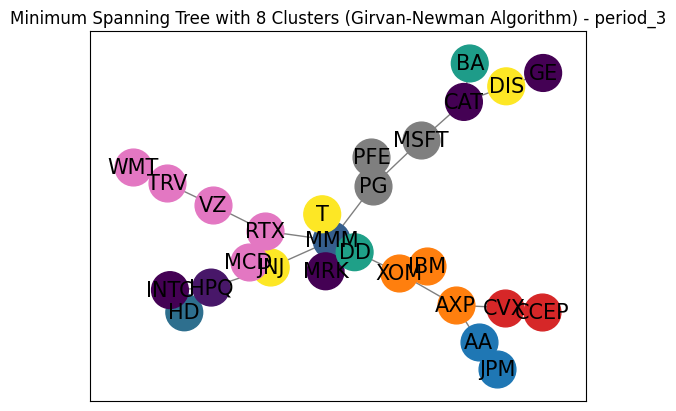

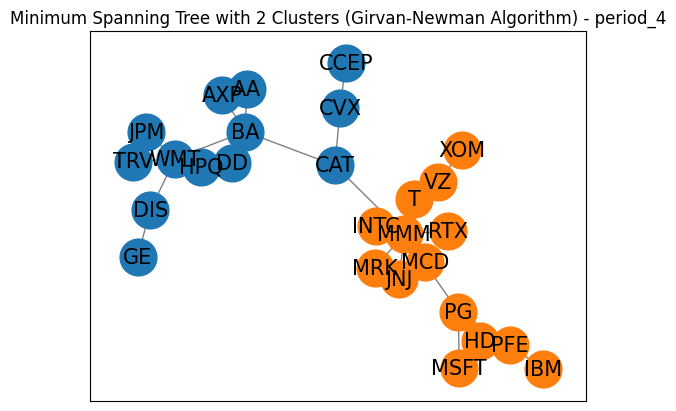

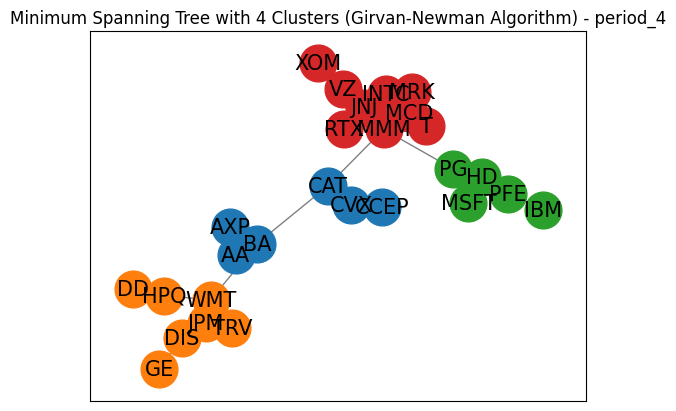

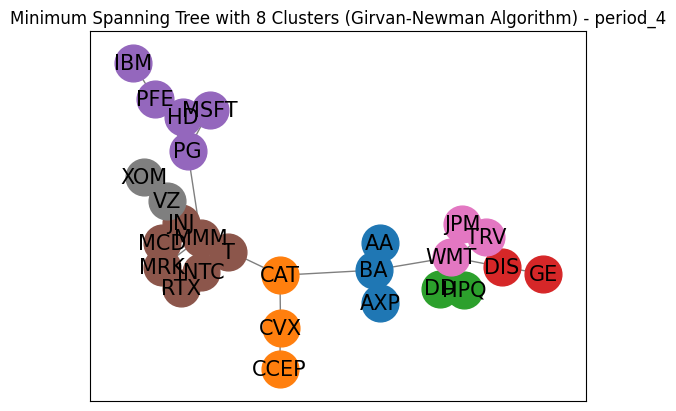

In [106]:
import numpy as np
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from networkx.algorithms.community import girvan_newman

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def generate_portfolios(communities, labels, num_portfolios=100):
    """Generate multiple portfolios by selecting one ticker at random from each cluster."""
    portfolios = []
    for _ in range(num_portfolios):
        portfolio = [random.choice(list([labels[node] for node in community])) for community in communities]
        portfolios.append(portfolio)
    return portfolios

def plot_MST_portfolios(G, num_clusters, period, communities, labels):
        # Plot the graph with clusters colored
        pos = nx.spring_layout(G)
        for i, community in enumerate(communities):
            nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=plt.cm.tab10(i), node_size=700, label=f'Cluster {i+1}')
        nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
        plt.title(f"Minimum Spanning Tree with {num_clusters} Clusters (Girvan-Newman Algorithm) - {period}")
        plt.show()


def MST_cluster(distance_matrix, labels, period, plot):
    sparse_matrix = csr_matrix(distance_matrix)

    # Compute the minimum spanning tree
    mst = minimum_spanning_tree(sparse_matrix)

    # Create a NetworkX graph from the MST
    G = nx.Graph(mst.toarray().astype(float))

    # Use the Girvan-Newman algorithm to find communities
    communities_generator = girvan_newman(G)

    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}

    for num_clusters in [2, 4, 8]:
        for communities in communities_generator:
            for comm_num, community in enumerate(communities, start=1):
                cluster_stocks[num_clusters][comm_num] = [labels[t] for t in community]    
            if len(communities) == num_clusters:
                break
        
        #plot
        if plot:
            plot_MST_portfolios(G, num_clusters, period, communities, labels)
    return cluster_stocks

def MST(correlation_matrices, plot = True):
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        distance_matrix = correlation_matrices[period]
        tickers = sorted(set([index[0] for index in distance_matrix]))
        labels = {i: ticker for i, ticker in enumerate(tickers)}

        # Convert the distance matrix to a sparse matrix
        sparse_matrix = csr_matrix(distance_matrix)

        # Compute the minimum spanning tree
        mst = minimum_spanning_tree(sparse_matrix)

        # Create a NetworkX graph from the MST
        G = nx.Graph(mst.toarray().astype(float))
        if plot:
            # Draw the graph
            pos = nx.spring_layout(G)  # positions for all nodes
            nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue')
            nx.draw_networkx_edges(G, pos, edge_color='k')
            nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
            plt.title(f"Minimum Spanning Tree Visualization - {period}")
            plt.show()       
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)

    mst_all_cluster_stocks = {}
    tickers = sorted(set(index[0] for index in distance_matrix))
    labels = {i: ticker for i, ticker in enumerate(tickers)}
    for period, distance_matrix in distance_matrices.items():
        mst_all_cluster_stocks[period] = MST_cluster(distance_matrix.values, labels, period, plot)

    return mst_all_cluster_stocks
mst_all_cluster_stocks = MST(correlation_matrices)

In [107]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period, mst_result_df_clusters = calculate_metrics_for_mst_clusters(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters


,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.014358,0.039083,-0.034047,0.370180,"[JNJ, TRV, CVX, INTC, BA, INTC, JPM, DIS, MRK,..."
period_1 (4 stocks),0.010322,0.033145,0.035954,0.356581,"[CVX, XOM, DD, DIS, AA, XOM, DD, TRV, AXP, BA,..."
period_1 (8 stocks),0.036206,0.031661,0.116340,0.376027,"[AXP, JPM, CVX, INTC, DIS, HPQ, MCD, MMM, AXP,..."
period_2 (2 stocks),0.271232,0.021548,1.331297,0.222799,"[TRV, PG, DD, JNJ, DIS, MSFT, DIS, CAT, TRV, M..."
period_2 (4 stocks),0.282010,0.018221,1.587258,0.241941,"[GE, AXP, CAT, DD, CVX, WMT, JNJ, HD, CVX, WMT..."
period_2 (8 stocks),0.281794,0.015899,1.798385,0.234308,"[AA, PG, MSFT, CCEP, INTC, HPQ, RTX, VZ, AA, W..."
period_3 (2 stocks),-0.076160,0.044191,-0.141805,0.503247,"[CVX, PFE, AXP, GE, MMM, DIS, AA, MSFT, JNJ, M..."
period_3 (4 stocks),0.012357,0.039287,0.052970,0.494338,"[CCEP, CAT, MMM, MCD, JPM, PFE, DD, MCD, AXP, ..."
period_3 (8 stocks),0.014002,0.039938,0.038814,0.507705,"[AA, XOM, CAT, CVX, MRK, HPQ, VZ, PFE, AA, AXP..."
period_4 (2 stocks),0.449276,0.026805,1.804356,0.476695,"[AA, IBM, CAT, MRK, AA, MSFT, JPM, MRK, CCEP, ..."


## Plots and Diagrams (In Sample)

In [108]:
def count_of_stocks(result_df_clusters,custom_tickers,experiment_name):
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers, columns=[period])
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers
        total_counts = counts_df.sum(axis=1)

        # Get the top 8 stocks and group the rest into "Other"
        top_8 = total_counts.nlargest(8)
        other = pd.Series(total_counts.sum() - top_8.sum(), index=["Other"])

        # Concatenate the top 8 and "Other"
        final_counts = pd.concat([top_8, other])

        # Plot the pie chart for the current period
        plt.figure(figsize=(8, 8))
        plt.pie(final_counts, labels=final_counts.index, autopct='%1.1f%%', startangle=140)
        plt.axis('equal')
        plt.title(f'{experiment_name} Top 8 Stocks - {period}')
        plt.show()
        total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Plot the pie chart for all periods combined
    plt.figure(figsize=(8, 8))
    plt.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title(f"{experiment_name} All Stocks - All Periods Combined'")
    plt.show()

    ################################################################################################
    total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Sort the total counts in descending order
    total_counts_sorted = total_counts.sort_values(ascending=False)

    # Plot the bar chart for all periods combined
    plt.figure(figsize=(10, 6))
    total_counts_sorted.plot(kind='bar')
    plt.xlabel('Stock')
    plt.ylabel('Count')
    plt.title(f'{experiment_name} Total Counts of Each Stock Across All Periods')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

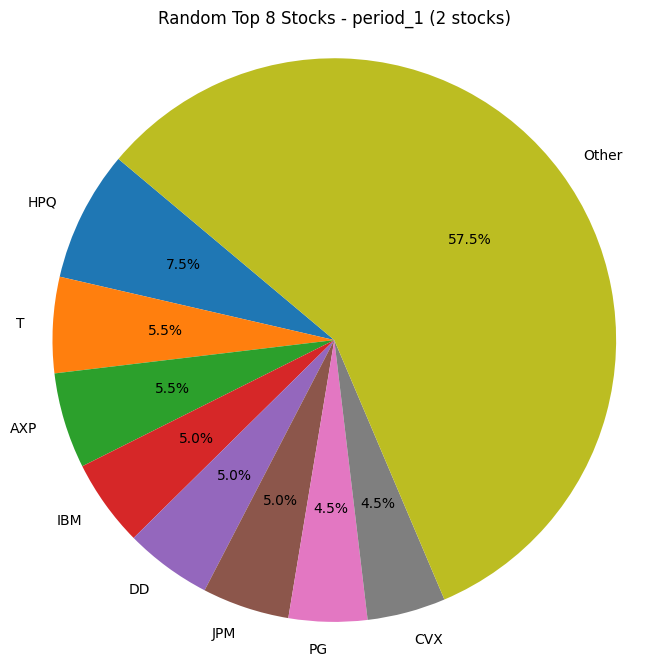

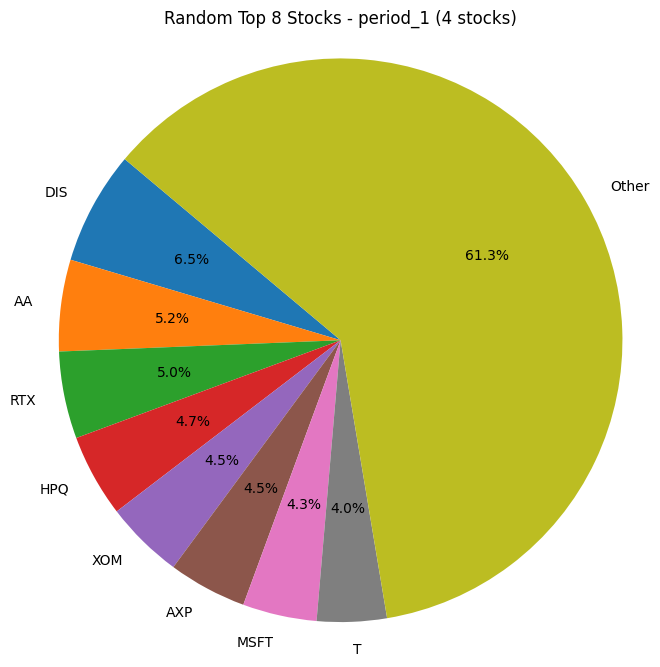

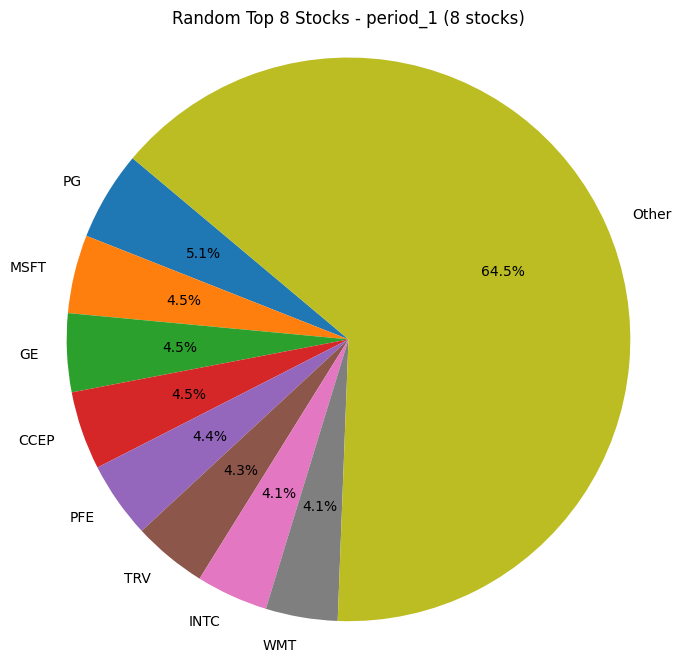

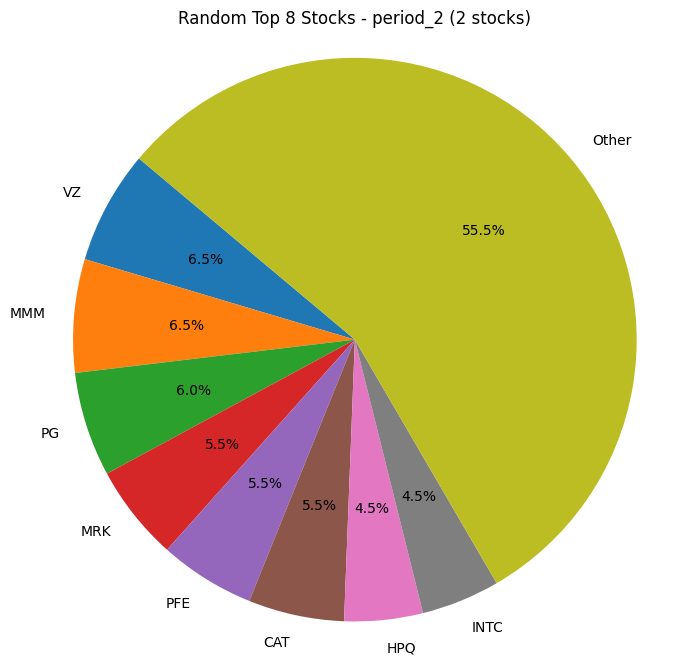

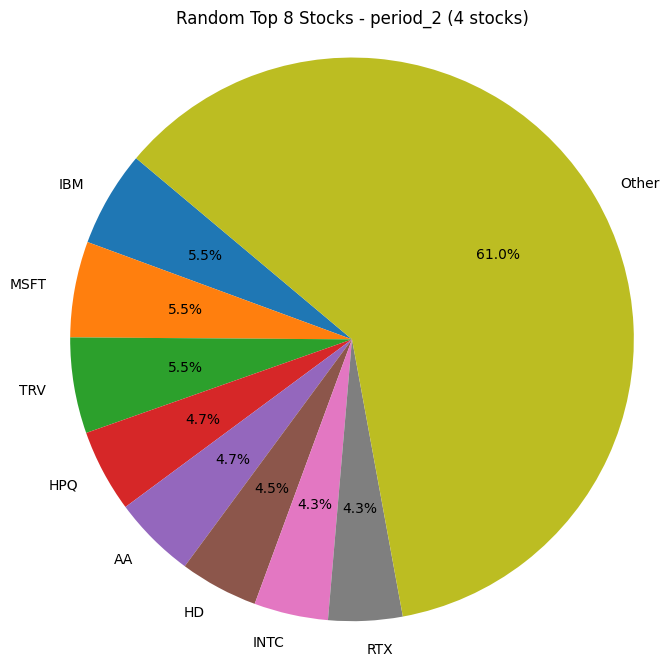

...

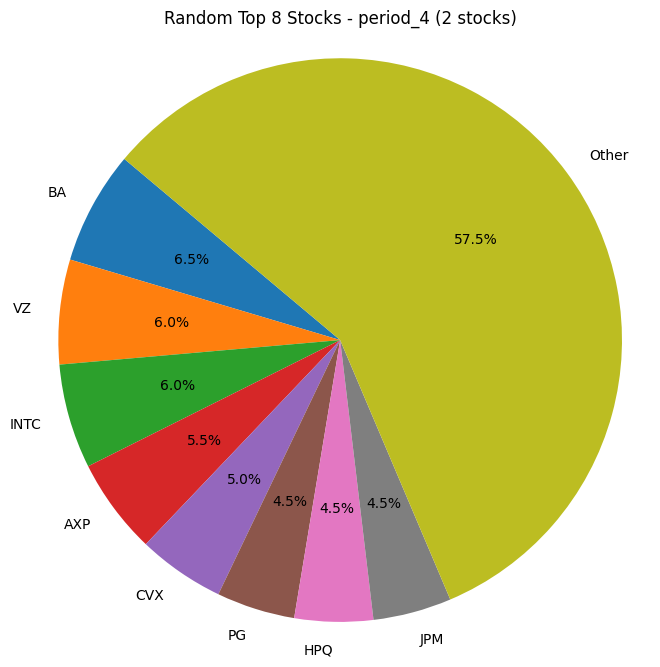

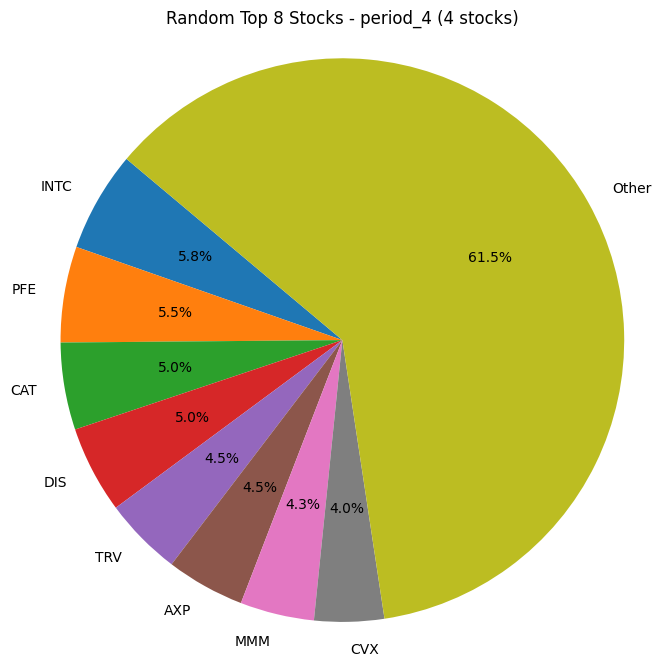

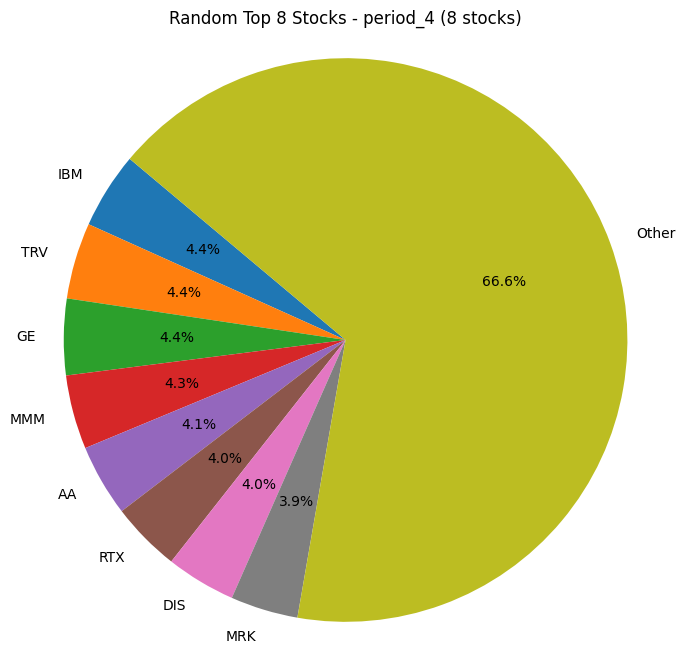

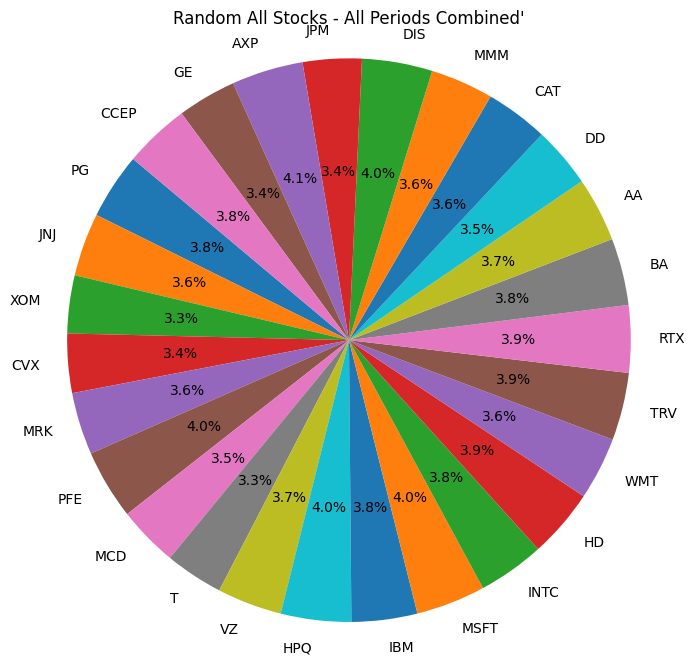

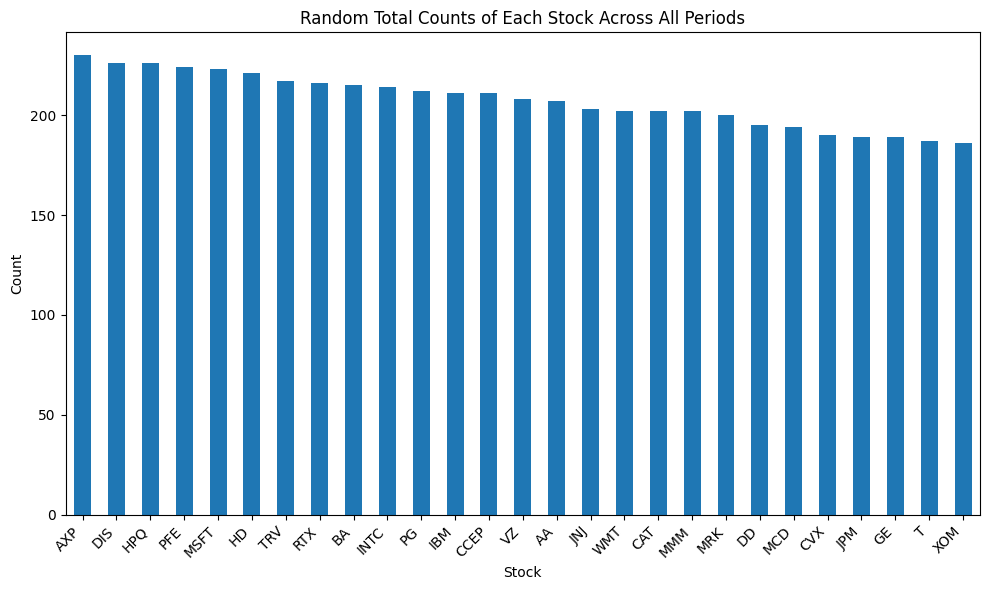

In [109]:
count_of_stocks(result_df_random,custom_tickers, "Random")

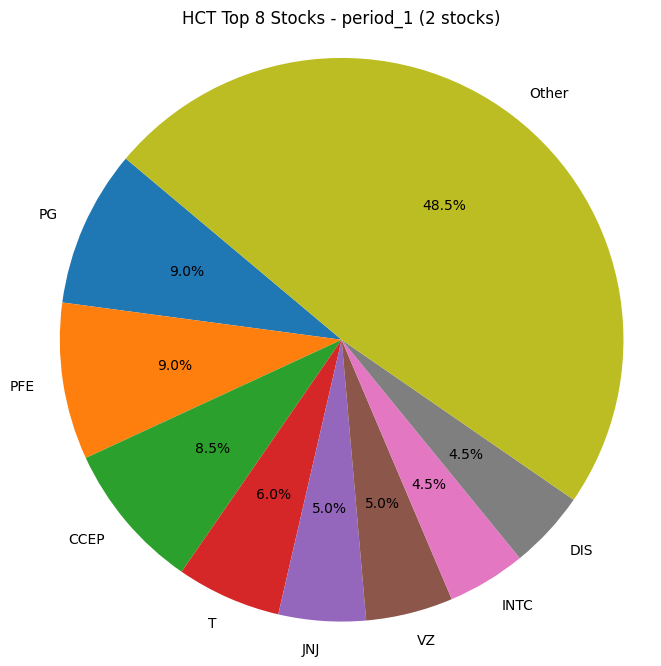

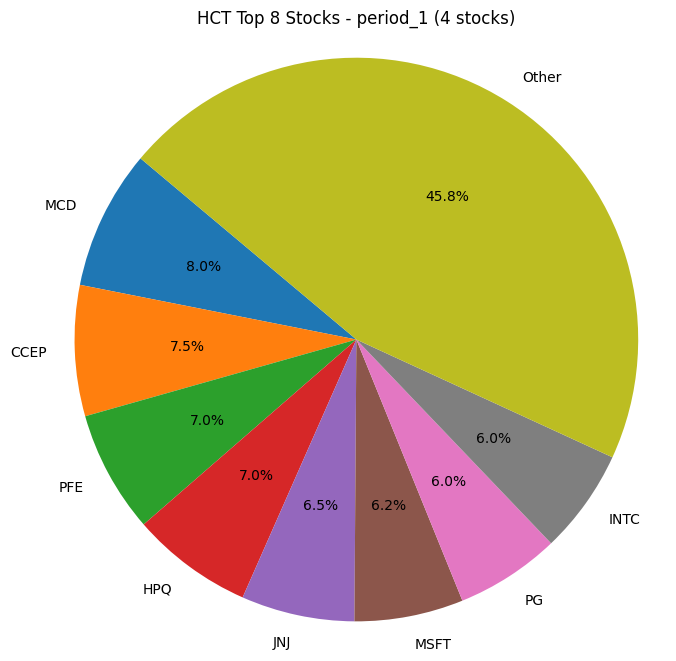

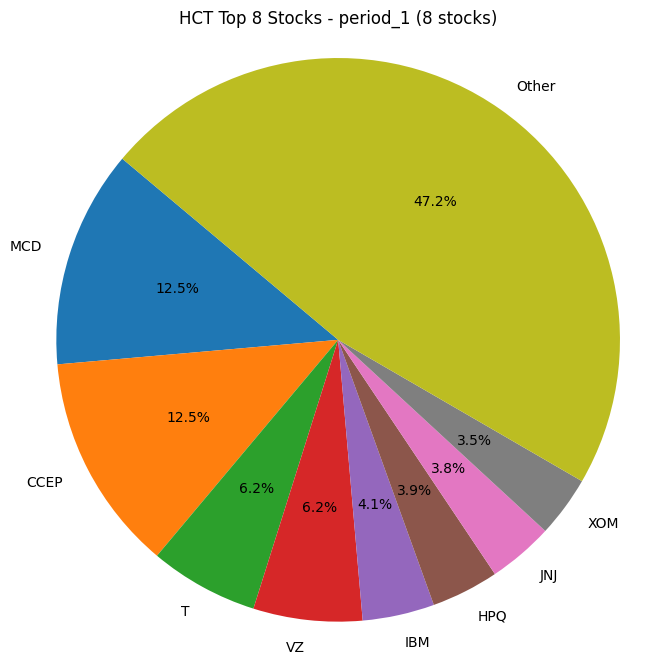

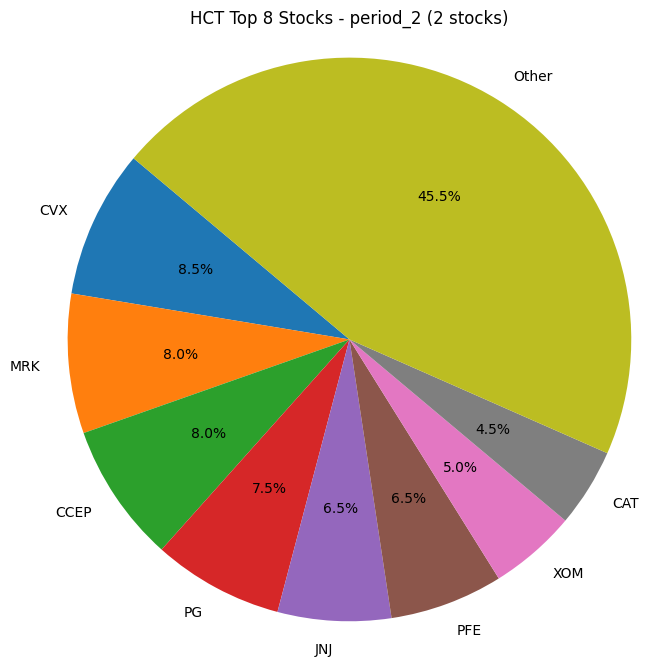

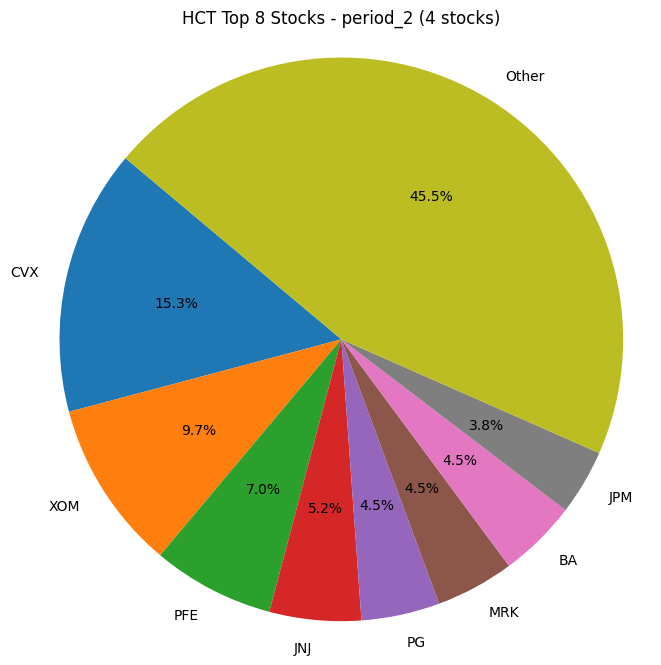

...

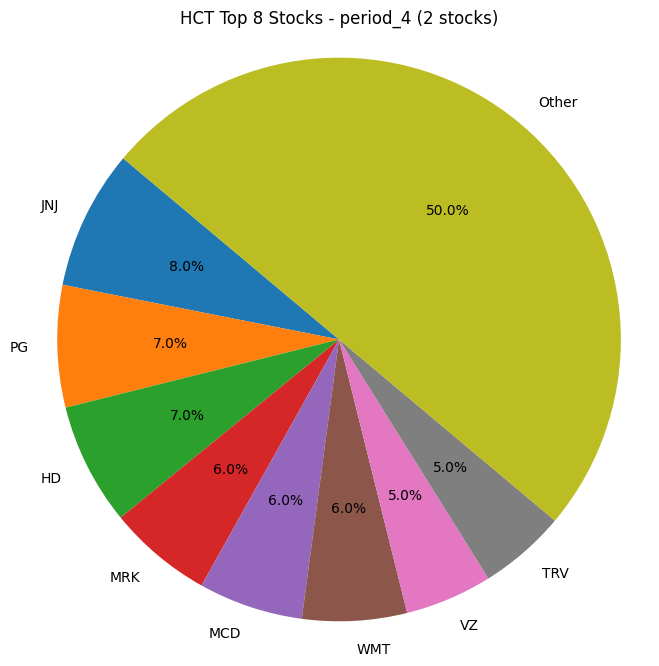

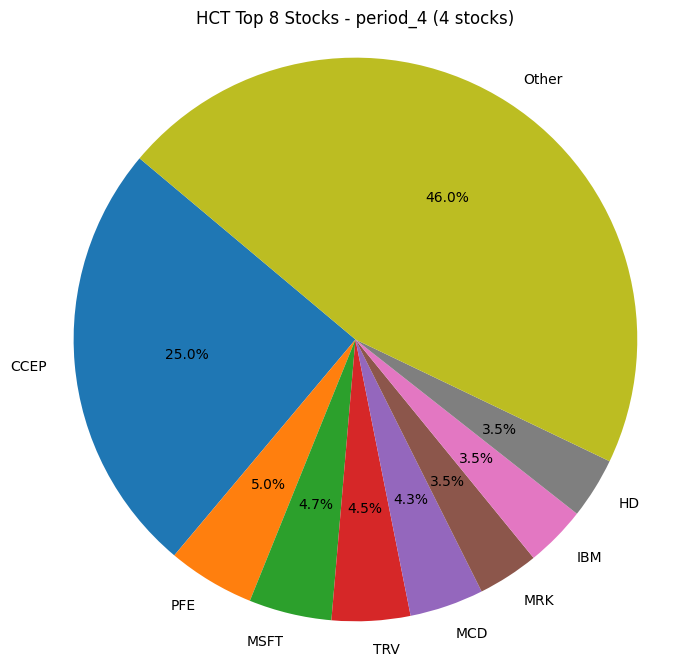

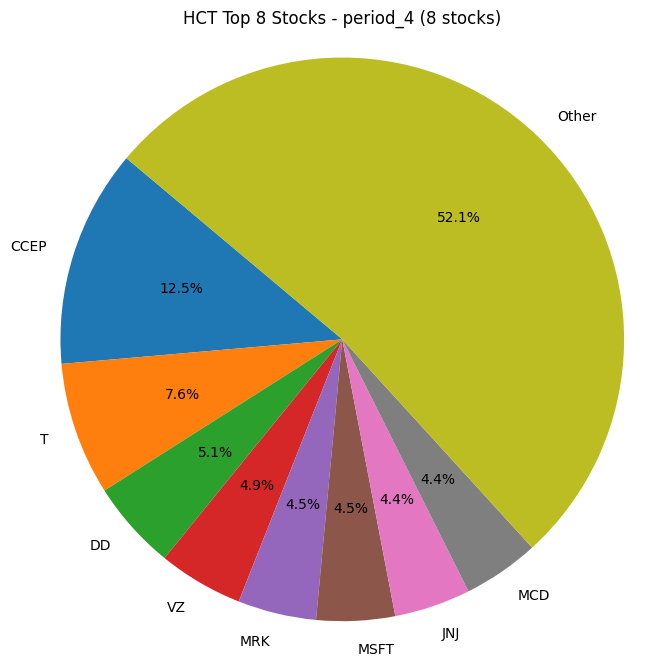

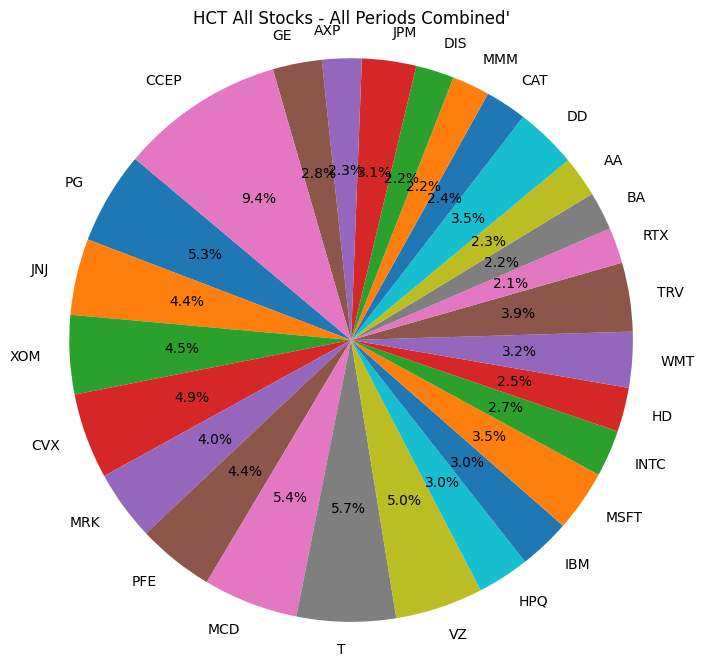

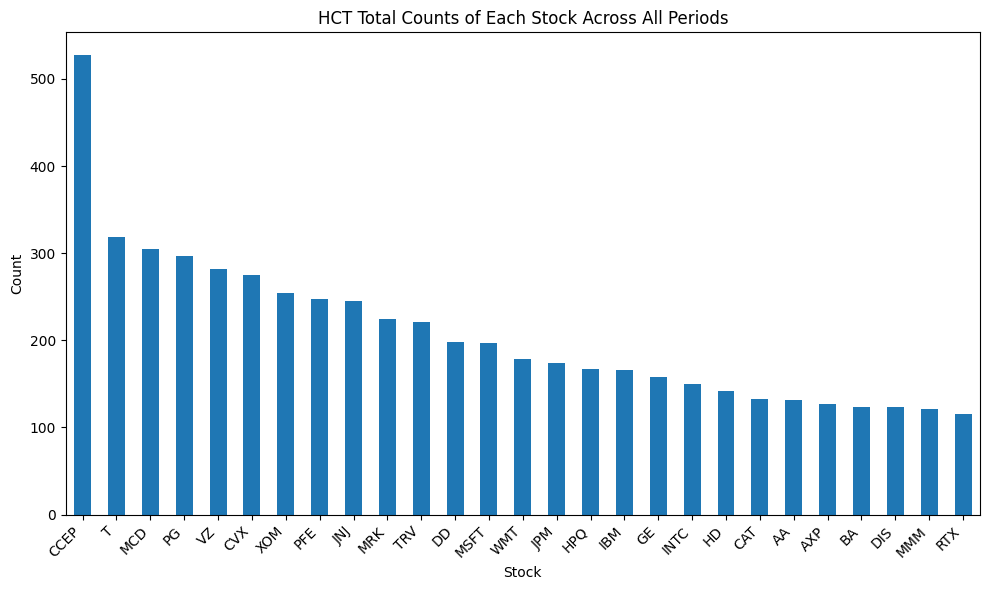

In [110]:
count_of_stocks(result_df_HCT,custom_tickers, "HCT")

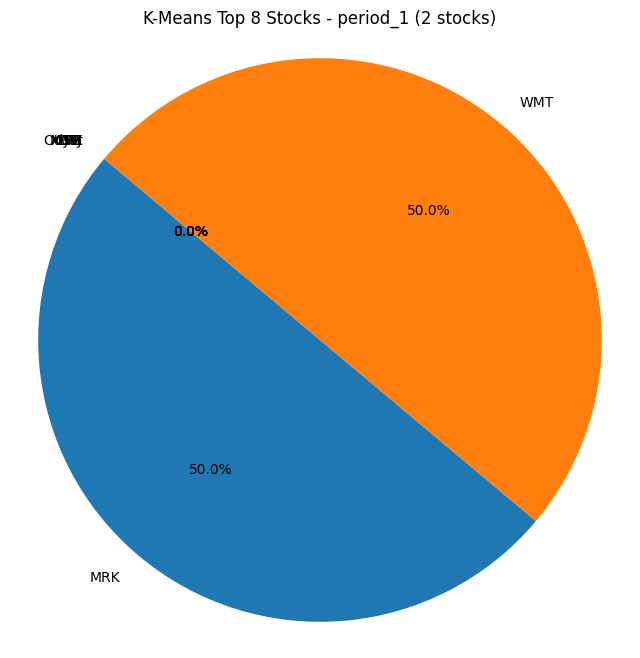

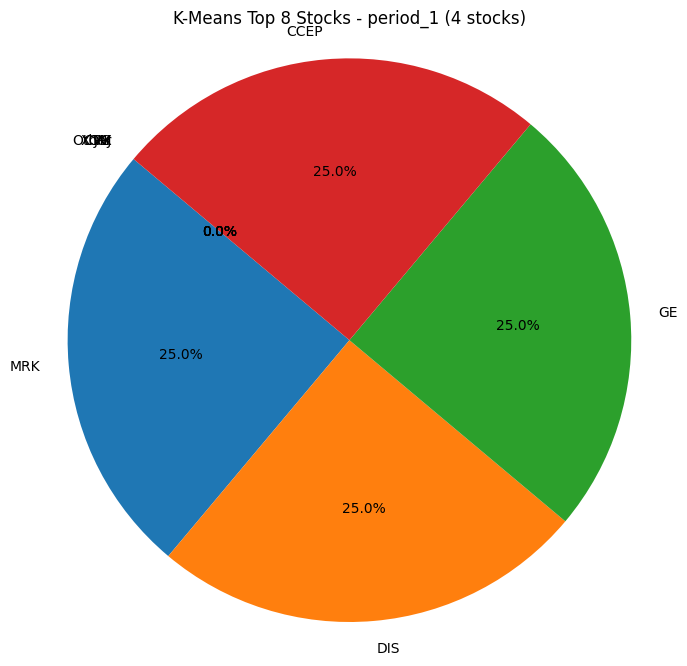

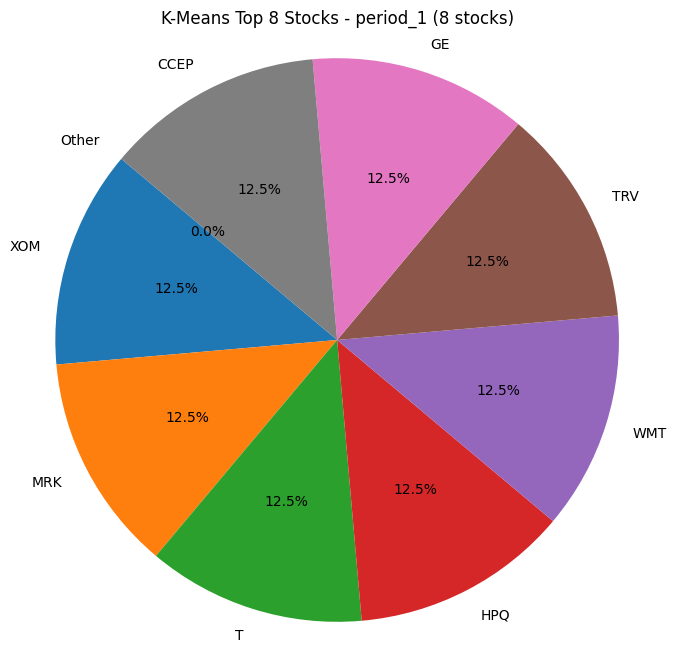

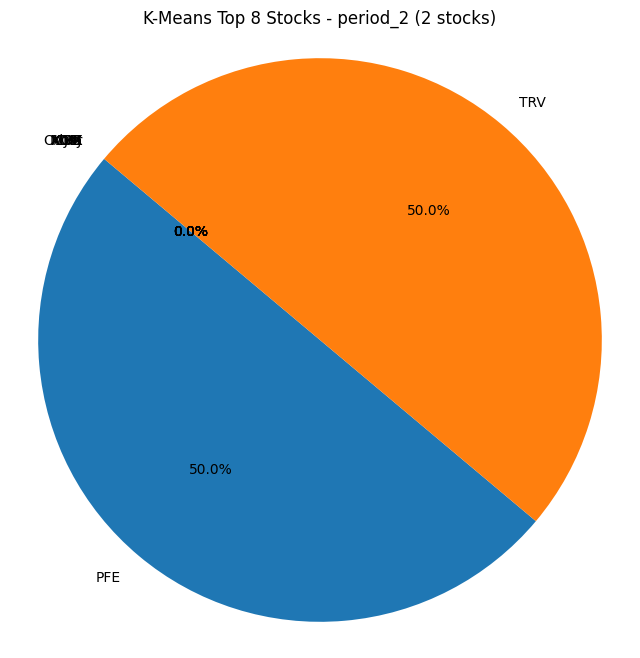

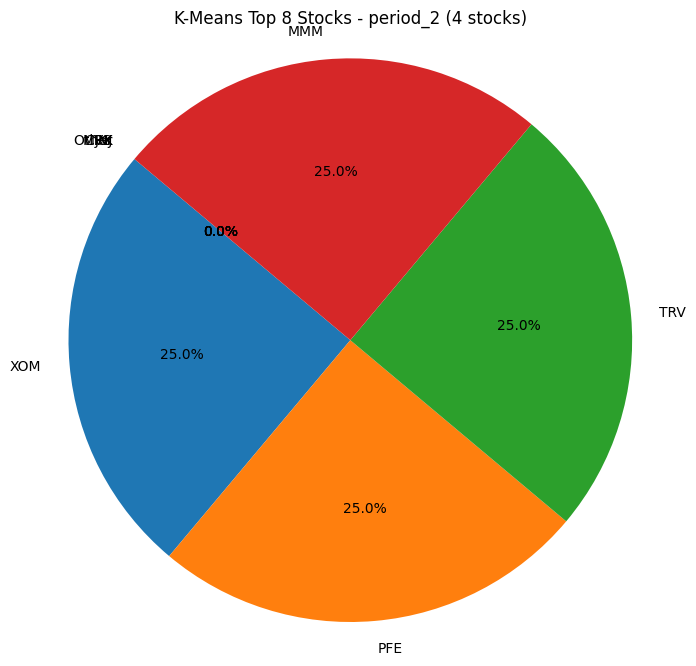

...

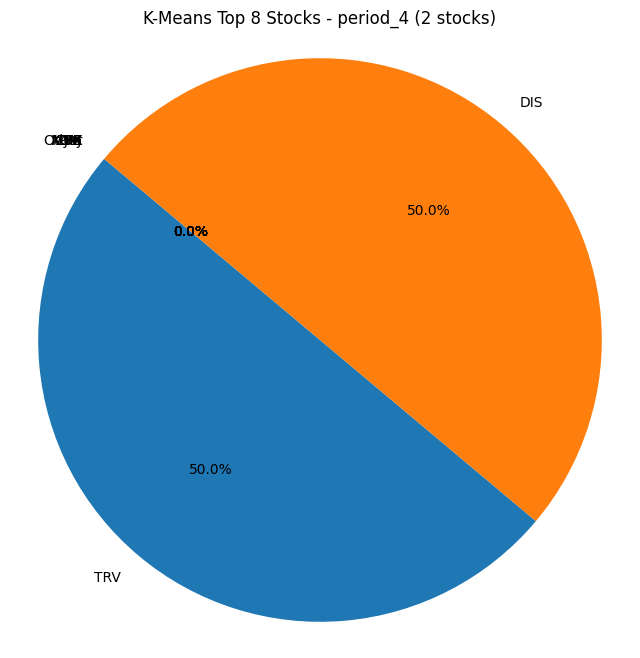

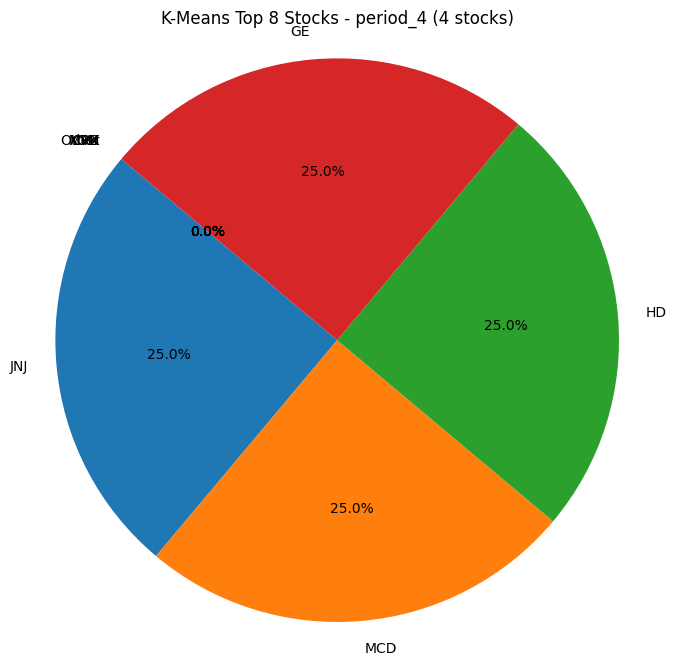

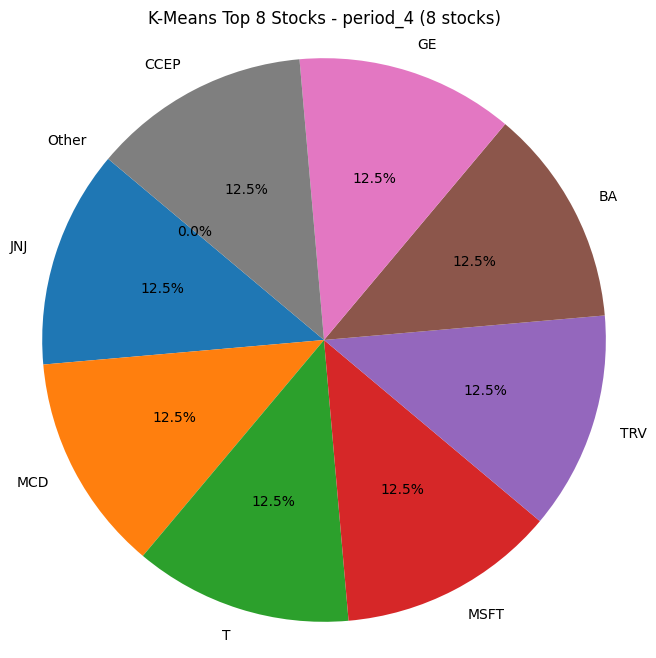

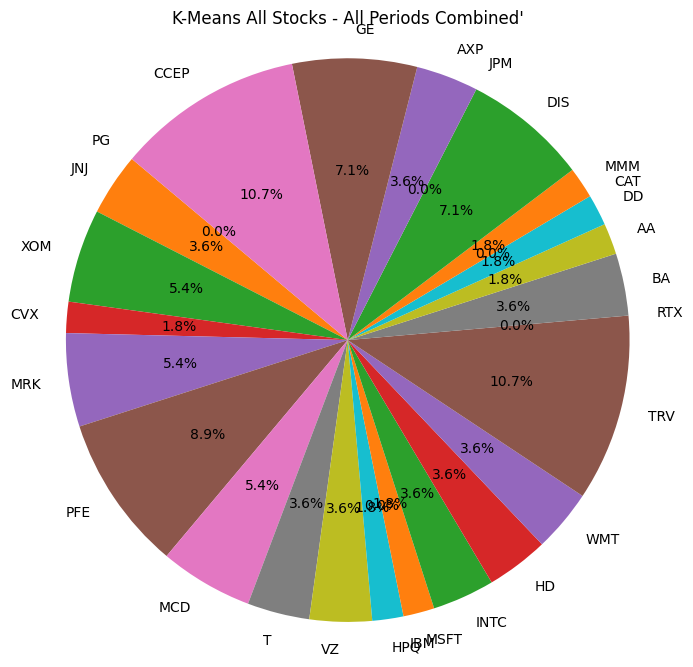

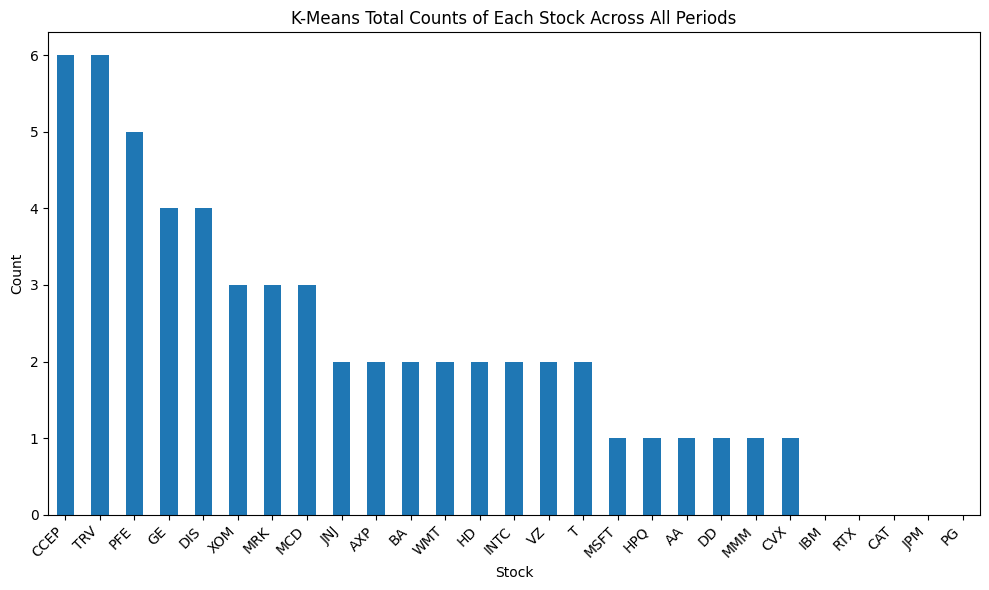

In [111]:
count_of_stocks(result_df_kmeans,custom_tickers, "K-Means")

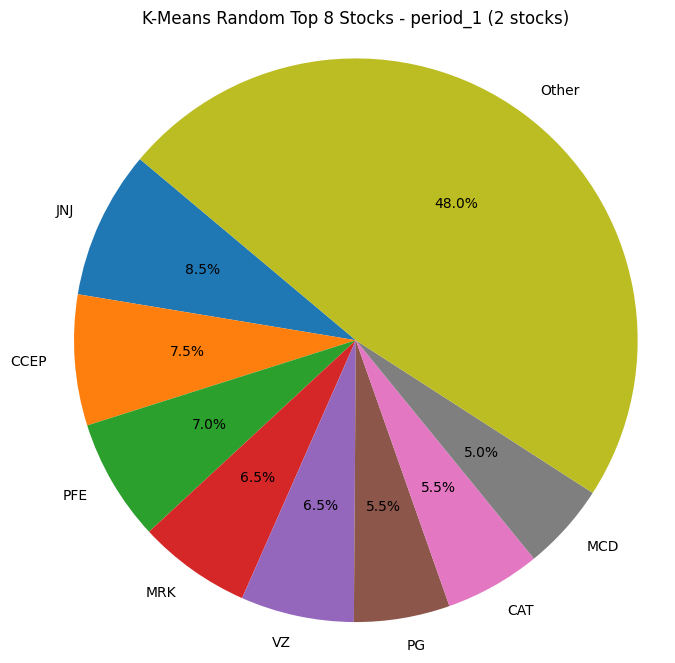

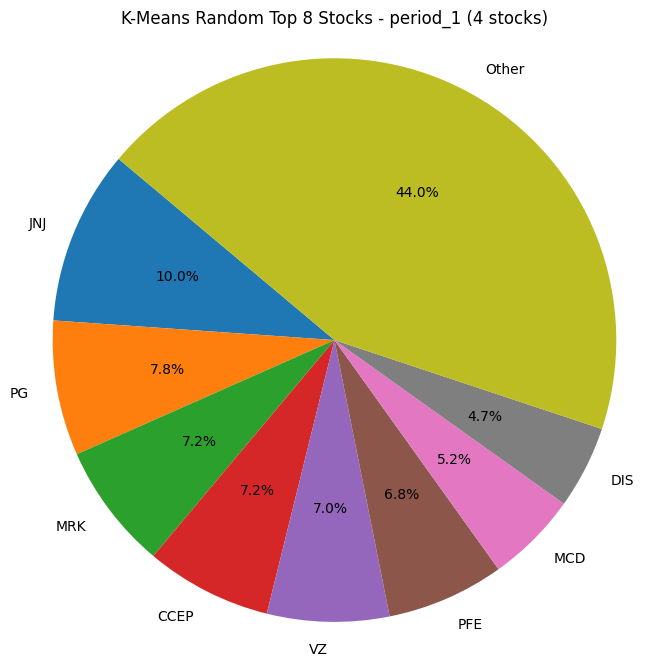

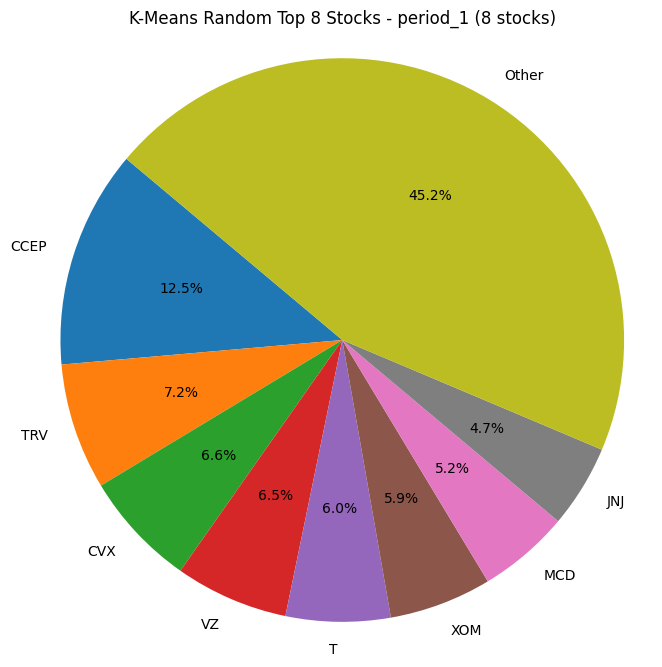

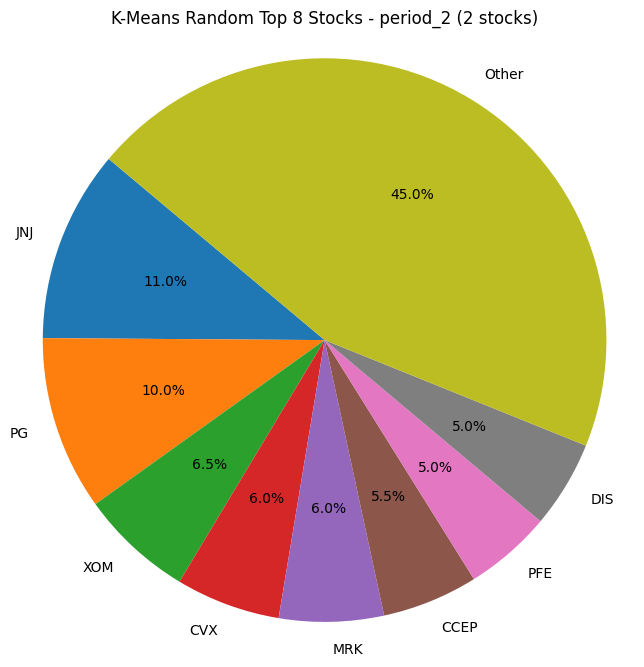

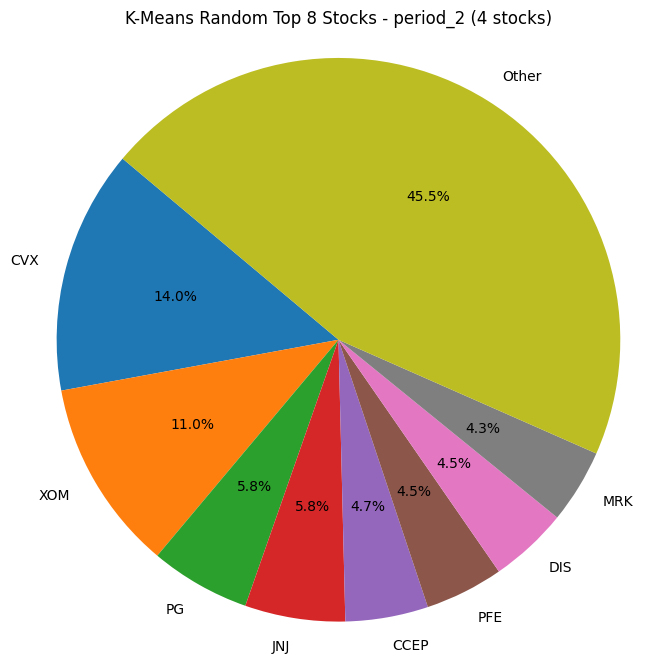

...

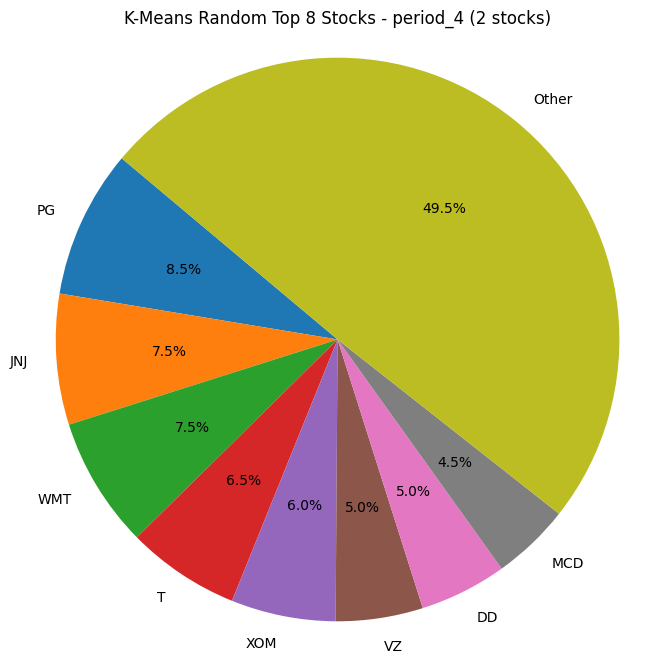

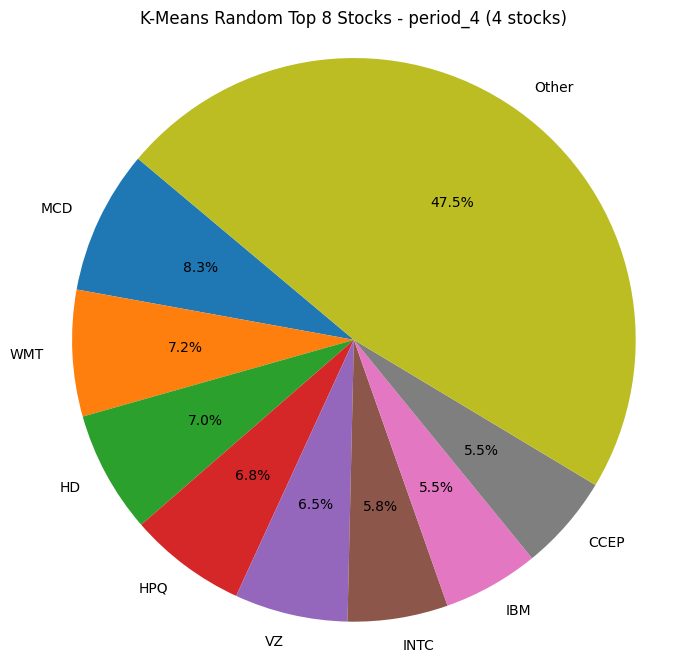

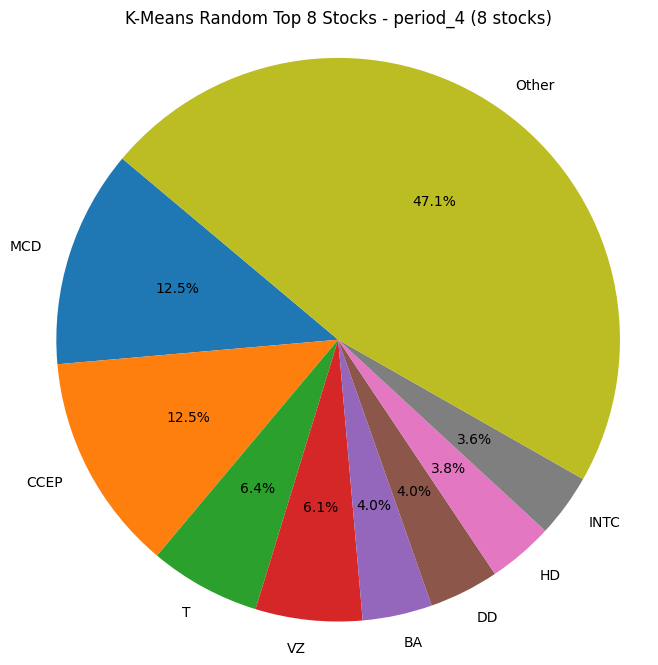

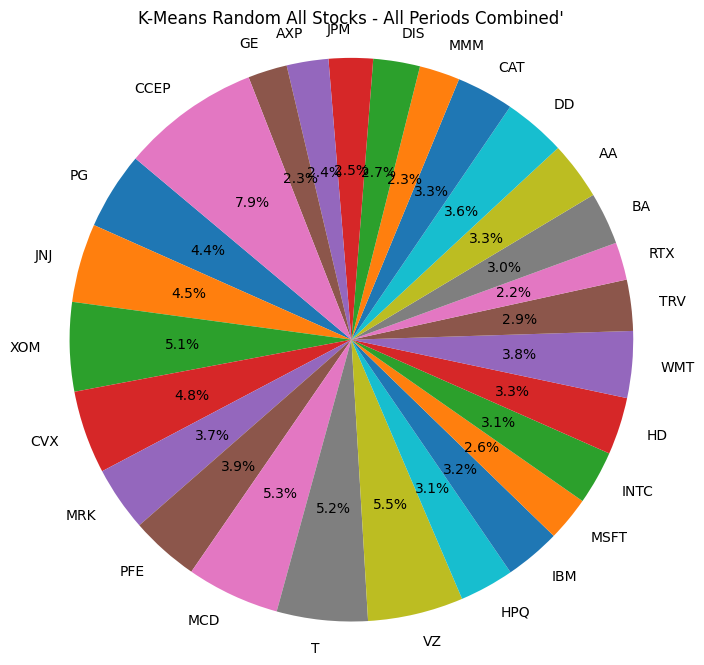

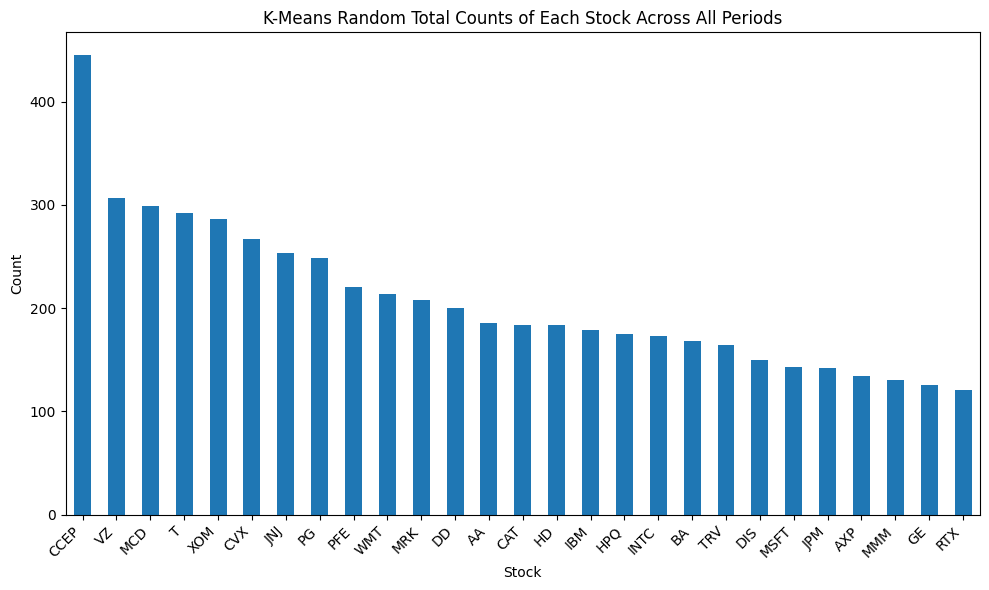

In [112]:
count_of_stocks(result_df_kmeans_rand,custom_tickers, "K-Means Random")

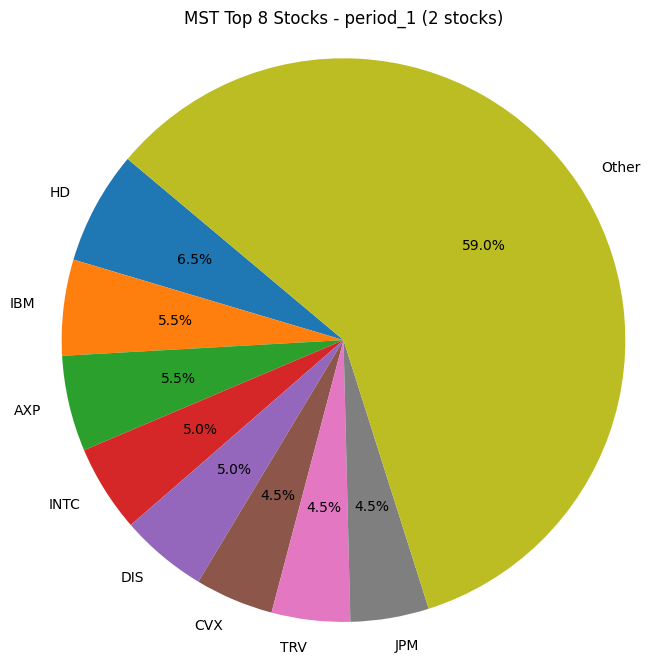

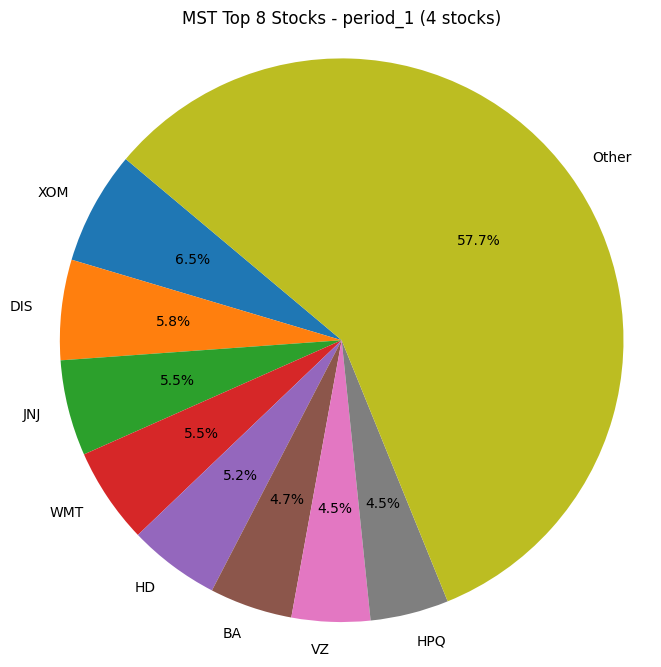

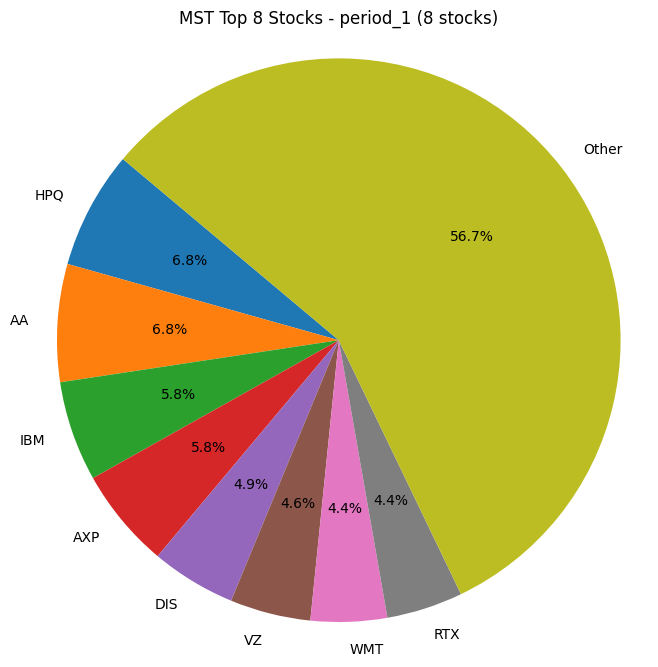

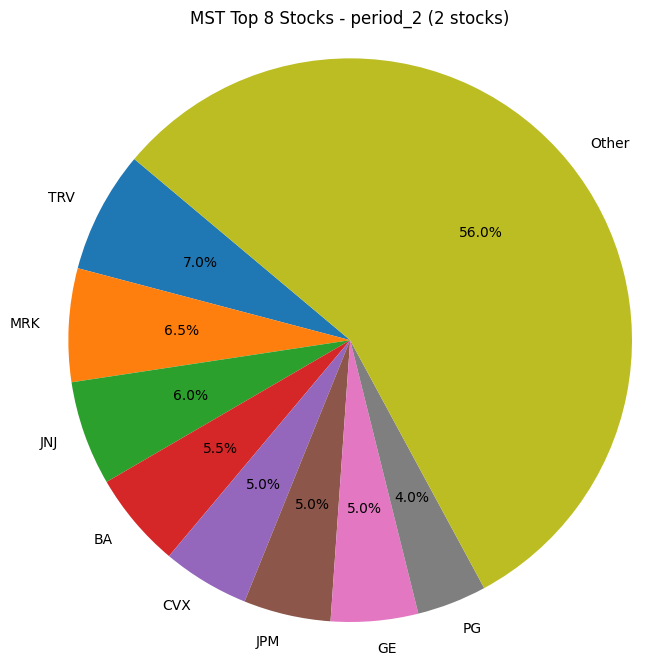

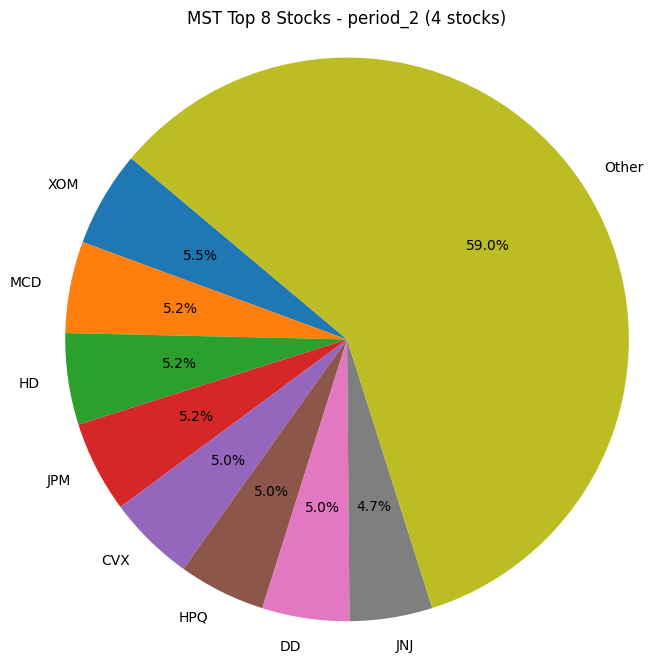

...

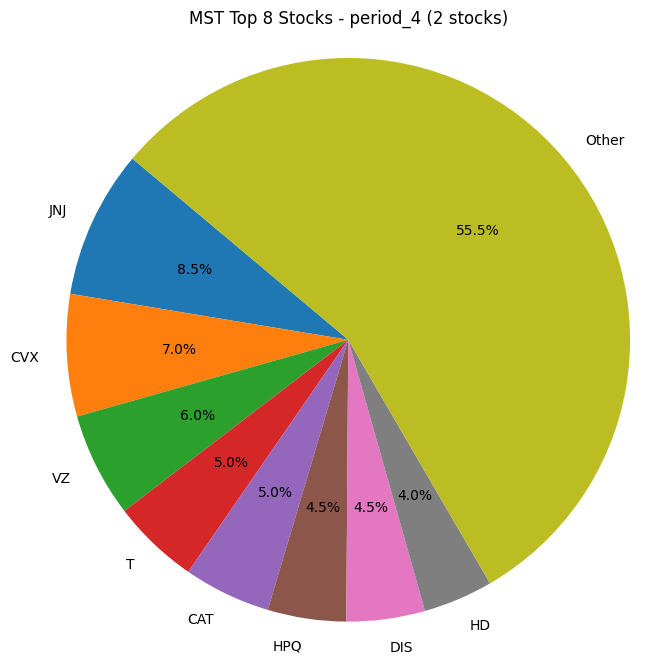

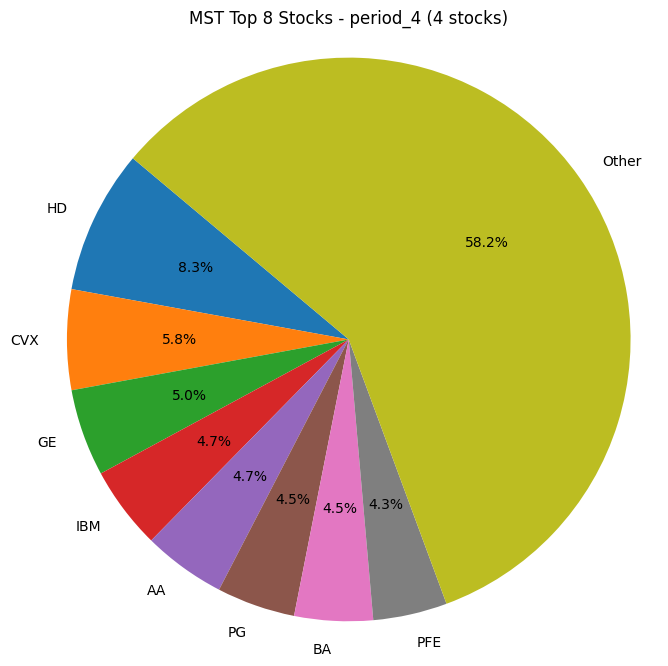

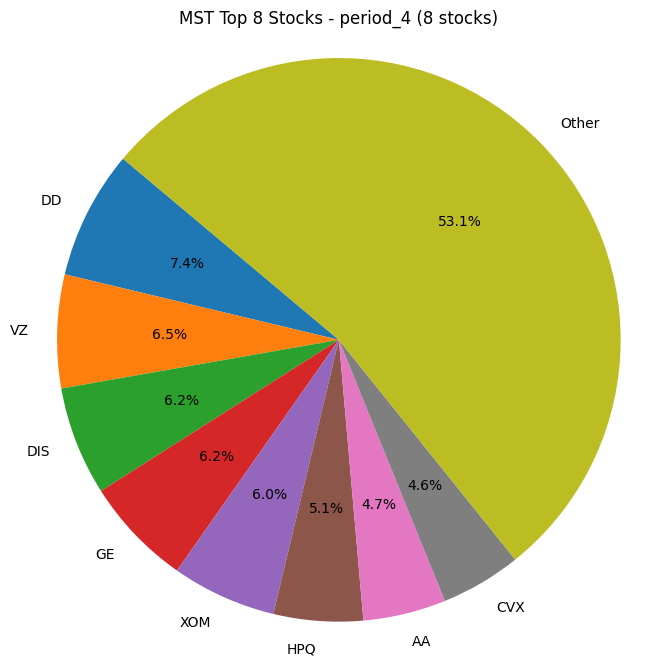

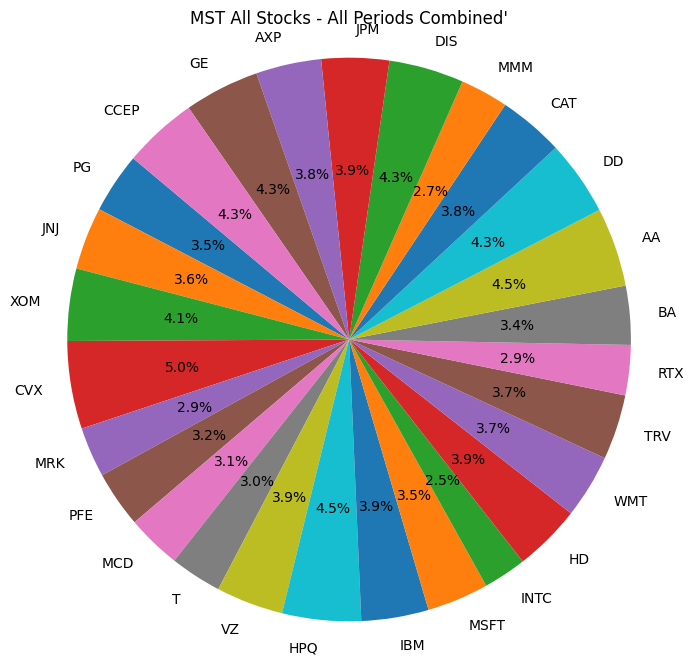

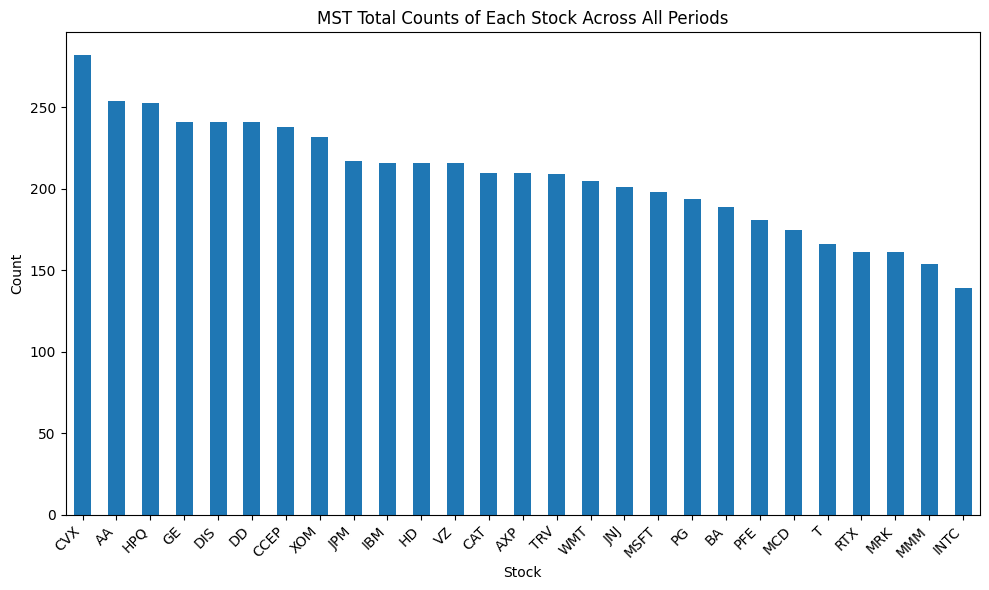

In [113]:
count_of_stocks(mst_result_df_clusters, custom_tickers, "MST")

In [114]:
def plot_metric(metric_name,result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, result_df_MST):
    labels = list(result_df_random.index)
    
    random_values = [result_df_random.loc[label][metric_name] for label in labels]
    HCT_values = [result_df_HCT.loc[label][metric_name] for label in labels]
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    print(kmeans_rand_values)
    MST_values = [result_df_MST.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.2  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width * 1.5, random_values, width, label='Random')
    rects2 = ax.bar(x - width * 0.5, HCT_values, width, label='HCT')
    rects3 = ax.bar(x + width * 0.5, kmeans_values, width, label='K-means')
    rects4 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='K-means Random')
    rects5 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='MST')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of Random Values:", np.mean(random_values))
    print("Total Average " + metric_name + " of Cluster Values:", np.mean(HCT_values))
    print("Total Average " + metric_name + " of K-means Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print("Total Average " + metric_name + " of MST Values:", np.mean(MST_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3", "Period 4"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of Random Values:", np.mean(random_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of Cluster Values:", np.mean(HCT_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of MST:", np.mean(MST_values[(period_num - 1) * 3:period_num * 3]))
        print()

[0.025366579516730665, 0.008794316794331252, 0.021329916212789023, 0.26345596639933366, 0.3146674112253111, 0.26100074911178506, -0.05667398574440433, -0.013465608007878199, 0.024926801803942123, 0.4536059675459894, 0.45270185732098445, 0.5210570513269333]


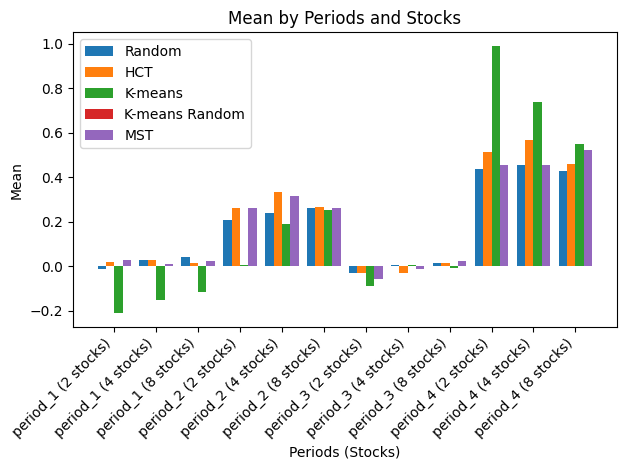

Total Average Mean of Random Values: 0.17236296919092978
Total Average Mean of Cluster Values: 0.20123864433828084
Total Average Mean of K-means Values: 0.17898901440186984
Total Average Mean of K-means Random Values: 0.18973058529215395
Total Average Mean of MST Values: 0.17839734596878143

Period 1 Average Mean of Random Values: 0.019266448173258798
Period 1 Average Mean of Cluster Values: 0.020224153884794892
Period 1 Average Mean of K-means Values: -0.1609903987542476
Period 1 Average Mean of K-means Random Values: 0.018496937507950312
Period 1 Average Mean of MST: 0.010723455436248202

Period 2 Average Mean of Random Values: 0.23611884232968716
Period 2 Average Mean of Cluster Values: 0.2868308256424536
Period 2 Average Mean of K-means Values: 0.14891468543470077
Period 2 Average Mean of K-means Random Values: 0.27970804224547663
Period 2 Average Mean of MST: 0.2783452418445647

Period 3 Average Mean of Random Values: -0.005162251659875734
Period 3 Average Mean of Cluster Values: 

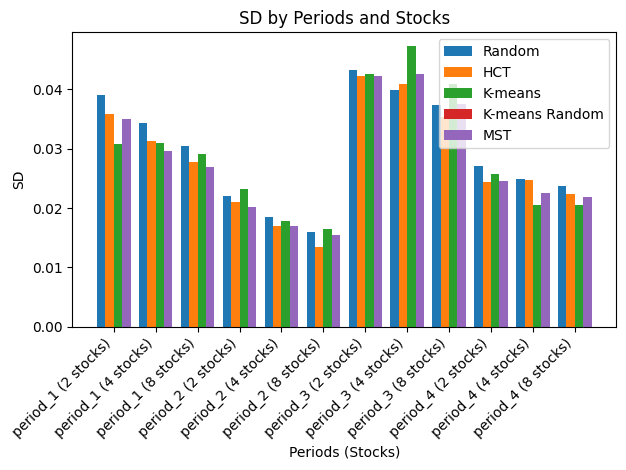

Total Average SD of Random Values: 0.029724595203979007
Total Average SD of Cluster Values: 0.028041496849901582
Total Average SD of K-means Values: 0.028804316056856096
Total Average SD of K-means Random Values: 0.027977748070583577
Total Average SD of MST Values: 0.030010814860891407

Period 1 Average SD of Random Values: 0.034639128923983846
Period 1 Average SD of Cluster Values: 0.031600614870583986
Period 1 Average SD of K-means Values: 0.030287398243547578
Period 1 Average SD of K-means Random Values: 0.030550064148135717
Period 1 Average SD of MST: 0.03462956501258953

Period 2 Average SD of Random Values: 0.018830452583537573
Period 2 Average SD of Cluster Values: 0.017184096398258273
Period 2 Average SD of K-means Values: 0.019139775350400297
Period 2 Average SD of K-means Random Values: 0.017565944341222408
Period 2 Average SD of MST: 0.018556215668653345

Period 3 Average SD of Random Values: 0.040200087438826464
Period 3 Average SD of Cluster Values: 0.03952489809990661
Per

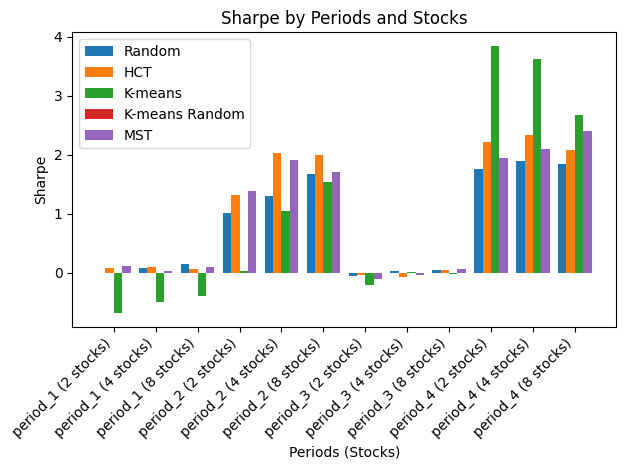

Total Average Sharpe of Random Values: 0.808551763335743
Total Average Sharpe of Cluster Values: 1.0101428198361297
Total Average Sharpe of K-means Values: 0.9119117671491019
Total Average Sharpe of K-means Random Values: 0.9647143553067546
Total Average Sharpe of MST Values: 0.8463733742218681

Period 1 Average Sharpe of Random Values: 0.07045219644824074
Period 1 Average Sharpe of Cluster Values: 0.07914373850265274
Period 1 Average Sharpe of K-means Values: -0.5293881023984398
Period 1 Average Sharpe of K-means Random Values: 0.07345768633137006
Period 1 Average Sharpe of MST: 0.03941550202784963

Period 2 Average Sharpe of Random Values: 1.3255530756770821
Period 2 Average Sharpe of Cluster Values: 1.780199591643503
Period 2 Average Sharpe of K-means Values: 0.8730214815469975
Period 2 Average Sharpe of K-means Random Values: 1.6609345170005756
Period 2 Average Sharpe of MST: 1.5723134036789812

Period 3 Average Sharpe of Random Values: 0.00614115941233493
Period 3 Average Sharpe o

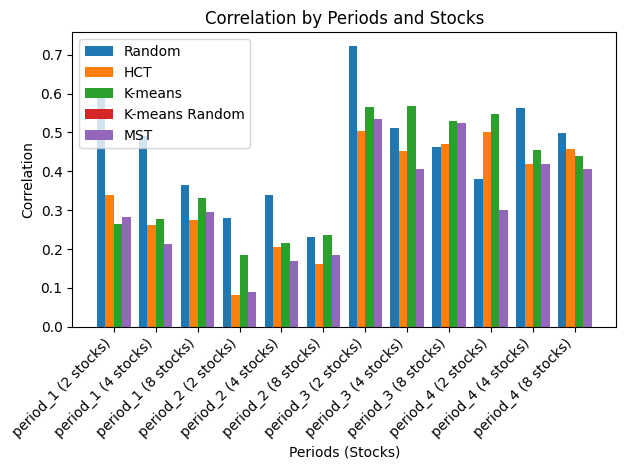

Total Average Correlation of Random Values: 0.4537993181629147
Total Average Correlation of Cluster Values: 0.3438776384681108
Total Average Correlation of K-means Values: 0.38436956893367985
Total Average Correlation of K-means Random Values: 0.3185516813631201
Total Average Correlation of MST Values: 0.3983907317434805

Period 1 Average Correlation of Random Values: 0.4862673598040894
Period 1 Average Correlation of Cluster Values: 0.2916874384120666
Period 1 Average Correlation of K-means Values: 0.29093782503989646
Period 1 Average Correlation of K-means Random Values: 0.2632981335311317
Period 1 Average Correlation of MST: 0.3675960867268296

Period 2 Average Correlation of Random Values: 0.2830733434224986
Period 2 Average Correlation of Cluster Values: 0.14918279330126072
Period 2 Average Correlation of K-means Values: 0.21254771187404112
Period 2 Average Correlation of K-means Random Values: 0.14759799652183184
Period 2 Average Correlation of MST: 0.2330159729624697

Period 3 A

In [115]:
# Plotting Mean
plot_metric('Mean',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting SD
plot_metric('SD',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Correlation
plot_metric('Correlation',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

In [116]:
def plot_metric_kmeans(metric_name,result_df_kmeans,result_df_kmeans_rand):
    labels = list(result_df_kmeans.index)
    
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.35  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects3 = ax.bar(x - width/2, kmeans_values, width, label='K-means Centroid')
    rects4 = ax.bar(x + width/2, kmeans_rand_values, width, label='K-means Random')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))

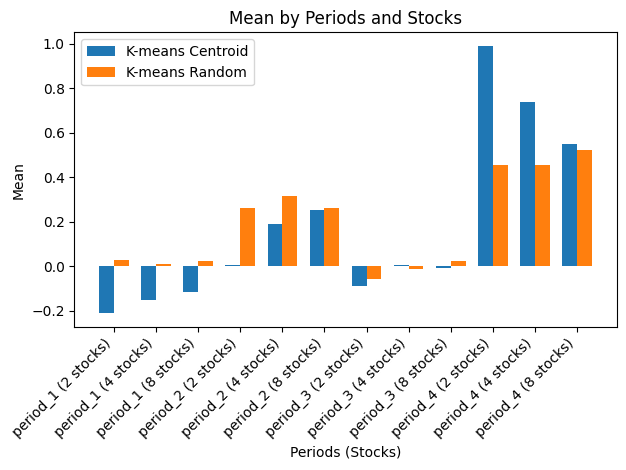

Total Average Mean of K-means Centroid Values: 0.17898901440186984
Total Average Mean of K-means Random Values: 0.18973058529215395

Period 1 Average Mean of K-means Centroid Values: -0.1609903987542476
Period 1 Average Mean of K-means Random Values: 0.018496937507950312
Period 2 Average Mean of K-means Centroid Values: 0.14891468543470077
Period 2 Average Mean of K-means Random Values: 0.27970804224547663
Period 3 Average Mean of K-means Centroid Values: -0.03130758293096355
Period 3 Average Mean of K-means Random Values: -0.015070930649446803


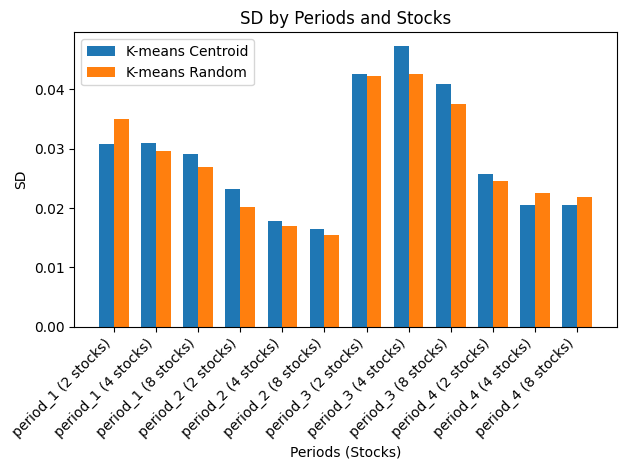

Total Average SD of K-means Centroid Values: 0.028804316056856096
Total Average SD of K-means Random Values: 0.027977748070583577

Period 1 Average SD of K-means Centroid Values: 0.030287398243547578
Period 1 Average SD of K-means Random Values: 0.030550064148135717
Period 2 Average SD of K-means Centroid Values: 0.019139775350400297
Period 2 Average SD of K-means Random Values: 0.017565944341222408
Period 3 Average SD of K-means Centroid Values: 0.04355651486414777
Period 3 Average SD of K-means Random Values: 0.040774773770658544


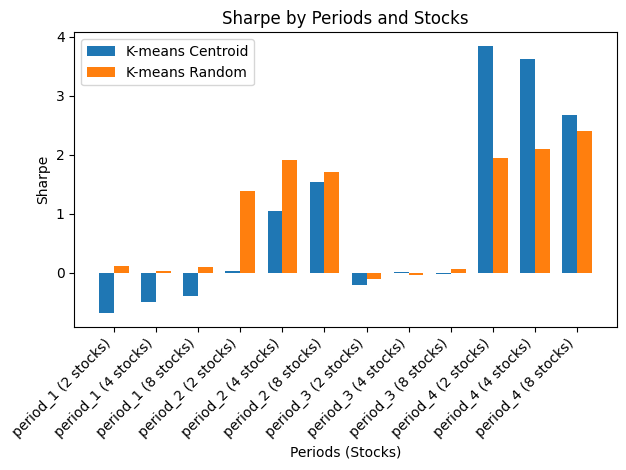

Total Average Sharpe of K-means Centroid Values: 0.9119117671491019
Total Average Sharpe of K-means Random Values: 0.9647143553067546

Period 1 Average Sharpe of K-means Centroid Values: -0.5293881023984398
Period 1 Average Sharpe of K-means Random Values: 0.07345768633137006
Period 2 Average Sharpe of K-means Centroid Values: 0.8730214815469975
Period 2 Average Sharpe of K-means Random Values: 1.6609345170005756
Period 3 Average Sharpe of K-means Centroid Values: -0.07403643699201942
Period 3 Average Sharpe of K-means Random Values: -0.02447827470069468


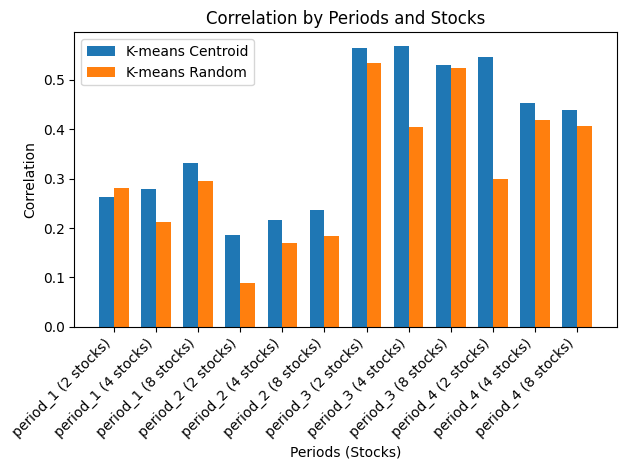

Total Average Correlation of K-means Centroid Values: 0.38436956893367985
Total Average Correlation of K-means Random Values: 0.3185516813631201

Period 1 Average Correlation of K-means Centroid Values: 0.29093782503989646
Period 1 Average Correlation of K-means Random Values: 0.2632981335311317
Period 2 Average Correlation of K-means Centroid Values: 0.21254771187404112
Period 2 Average Correlation of K-means Random Values: 0.14759799652183184
Period 3 Average Correlation of K-means Centroid Values: 0.5542085176932383
Period 3 Average Correlation of K-means Random Values: 0.48790880416006494


In [117]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans,result_df_kmeans_rand)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans,result_df_kmeans_rand)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans,result_df_kmeans_rand)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans,result_df_kmeans_rand)

# Analysis in Following Period

In [118]:
def calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_stocks = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlations = []
            selected_stocks_list = {}

            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(train_returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]

            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}
        results_by_period[test_period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

In [119]:
num_stocks_list = [2, 4, 8]
result_df_random_test1 = calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list)
result_df_random_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.249029,0.021667,1.204797,0.240186,"[TRV, HD, T, TRV, CVX, HD, RTX, T, MMM, MSFT, ..."
period_2 (4 stocks),0.256182,0.018283,1.430469,0.253770,"[WMT, RTX, XOM, CVX, CVX, CCEP, BA, MSFT, INTC..."
period_2 (8 stocks),0.248990,0.016062,1.564659,0.246327,"[VZ, TRV, GE, XOM, MRK, AA, PFE, MCD, WMT, MSF..."
period_3 (2 stocks),-0.028969,0.043629,-0.037423,0.501562,"[CAT, WMT, TRV, AXP, MCD, MSFT, CCEP, MCD, PG,..."
period_3 (4 stocks),-0.002997,0.039965,0.006487,0.505917,"[DIS, CVX, WMT, AXP, MRK, T, TRV, IBM, IBM, HD..."
period_3 (8 stocks),0.005600,0.037775,0.021249,0.503542,"[T, CAT, PFE, HD, IBM, JNJ, HPQ, RTX, AXP, IBM..."
period_4 (2 stocks),0.418288,0.027111,1.720678,0.484175,"[WMT, CVX, AXP, GE, DD, AXP, PG, IBM, CCEP, MM..."
period_4 (4 stocks),0.436426,0.024890,1.842607,0.483612,"[IBM, PFE, HPQ, PG, RTX, AA, AXP, HPQ, MMM, AX..."
period_4 (8 stocks),0.417715,0.023627,1.815326,0.489938,"[HPQ, CVX, XOM, VZ, JPM, RTX, INTC, CAT, BA, M..."


In [120]:
def calculate_metrics_for_all_clusters_test(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        selected_stocks_list = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]

                try:
                    selected_stocks_list[num_clusters] = np.concatenate([selected_stocks_list[num_clusters], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)

            final_stocks_list = [selected_stocks_list[num_clusters]]

            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}

        results_by_period[test_period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [121]:
result_df_HCT_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_HCT, period_dfs)
result_df_HCT_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.224602,0.021058,1.147105,0.175421,"[T, BA, JNJ, AXP, MCD, BA, VZ, RTX, PFE, DD, P..."
period_2 (4 stocks),0.197873,0.017475,1.170125,0.189759,"[PG, JPM, MCD, INTC, MRK, HD, T, MSFT, JNJ, CV..."
period_2 (8 stocks),0.262793,0.014830,1.792287,0.196148,"[MRK, WMT, MCD, T, MSFT, AXP, CAT, CCEP, PG, W..."
period_3 (2 stocks),-0.026422,0.040634,-0.044515,0.480100,"[PG, MMM, PG, VZ, MRK, MCD, MRK, CAT, CCEP, IN..."
period_3 (4 stocks),0.012176,0.037364,0.040276,0.495917,"[PFE, CVX, MMM, INTC, PFE, XOM, MCD, T, MRK, C..."
period_3 (8 stocks),0.029206,0.033831,0.090975,0.508767,"[PG, PFE, CVX, WMT, VZ, MSFT, HD, CCEP, PG, PF..."
period_4 (2 stocks),0.444541,0.026451,1.792580,0.448153,"[MCD, CAT, XOM, HD, VZ, AA, PG, JPM, XOM, AXP,..."
period_4 (4 stocks),0.425949,0.025132,1.739991,0.498533,"[WMT, CVX, AXP, GE, MRK, T, HD, GE, PG, VZ, AX..."
period_4 (8 stocks),0.474781,0.021891,2.192487,0.477841,"[PFE, CVX, WMT, T, HPQ, TRV, DIS, JPM, PG, CVX..."


In [122]:
result_df_kmeans_rand_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.232073,0.020735,1.191226,0.173510,"[HPQ, PFE, XOM, MCD, MSFT, PFE, WMT, PG, DD, P..."
period_2 (4 stocks),0.209554,0.016778,1.285115,0.169474,"[GE, MRK, CCEP, MCD, JPM, T, PG, MSFT, CAT, MR..."
period_2 (8 stocks),0.257050,0.014507,1.797559,0.177480,"[GE, JNJ, HPQ, VZ, CCEP, PG, XOM, MCD, BA, JNJ..."
period_3 (2 stocks),-0.020351,0.040601,-0.031540,0.482249,"[PFE, AA, CVX, WMT, CCEP, HD, XOM, WMT, PFE, M..."
period_3 (4 stocks),0.018941,0.037276,0.065039,0.501973,"[PFE, T, HD, XOM, MRK, IBM, MMM, XOM, PG, GE, ..."
period_3 (8 stocks),0.000101,0.038939,0.005079,0.516484,"[MSFT, PG, AA, GE, CCEP, T, XOM, CAT, HPQ, PG,..."
period_4 (2 stocks),0.460143,0.026098,1.874630,0.450456,"[JNJ, JPM, WMT, DD, XOM, AXP, TRV, DIS, PG, AA..."
period_4 (4 stocks),0.417277,0.025597,1.695452,0.484430,"[JNJ, MMM, IBM, GE, PG, CAT, MSFT, DD, JNJ, CA..."
period_4 (8 stocks),0.401458,0.023247,1.740971,0.486139,"[AA, CVX, MRK, JPM, BA, PG, HPQ, T, AA, XOM, T..."


In [123]:
def calculate_metrics_for_kmeans_test(all_cluster_stocks, period_dfs, centroid_vectors, distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        stocks_by_cluster = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[train_period][str(num_clusters)]
                distance_matrix = distance_matrices[train_period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks": [selected_stocks]}

        results_by_period[test_period] = results_by_cluster
        stocks_by_period[test_period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [124]:
result_df_kmeans_test1, stocks_by_period_kmeans_test1 = calculate_metrics_for_kmeans_test(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)
result_df_kmeans_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),-0.062222,0.024382,-0.255193,0.150983,"[WMT, MRK]"
period_2 (4 stocks),0.152850,0.016119,0.948271,0.080500,"[GE, MRK, CCEP, DIS]"
period_2 (8 stocks),0.299545,0.014626,2.047995,0.166232,"[GE, MRK, HPQ, T, CCEP, WMT, XOM, TRV]"
period_3 (2 stocks),-0.152147,0.038371,-0.396513,0.452278,"[PFE, TRV]"
period_3 (4 stocks),-0.051443,0.033177,-0.155057,0.529632,"[PFE, TRV, MMM, XOM]"
period_3 (8 stocks),-0.089575,0.036839,-0.243156,0.479708,"[TRV, PFE, DD, HD, CCEP, VZ, XOM, BA]"
period_4 (2 stocks),0.762271,0.027727,2.749165,0.232697,"[PFE, CCEP]"
period_4 (4 stocks),0.735915,0.027922,2.635629,0.460749,"[CCEP, DIS, INTC, AXP]"
period_4 (8 stocks),0.464749,0.022947,2.025308,0.469058,"[AA, CVX, PFE, AXP, DIS, MCD, INTC, VZ]"


In [125]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters_out_sample(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        period_number = int(period[-1])
        if period_number == 4: #last period
            break
        else:
            next_period = 'period_'+str(period_number+1)
        
        next_returns_data = period_dfs[next_period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = next_returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = next_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[next_period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period_out_sample, mst_result_df_clusters_out_sample = calculate_metrics_for_mst_clusters_out_sample(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters_out_sample


,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.263915,0.021778,1.264667,0.220005,"[JNJ, WMT, CVX, VZ, BA, GE, AA, WMT, CAT, DIS,..."
period_2 (4 stocks),0.289228,0.018218,1.613356,0.256933,"[MRK, JNJ, HPQ, VZ, AA, JPM, DD, GE, CVX, JNJ,..."
period_2 (8 stocks),0.260639,0.016332,1.617226,0.263779,"[AA, XOM, CVX, DD, DIS, HPQ, MCD, MMM, AXP, JN..."
period_3 (2 stocks),0.001902,0.044558,0.028186,0.506802,"[CVX, JNJ, INTC, MSFT, VZ, MMM, CCEP, JNJ, CVX..."
period_3 (4 stocks),-0.026015,0.040307,-0.046166,0.491574,"[VZ, MRK, JPM, XOM, DIS, WMT, RTX, INTC, AA, H..."
period_3 (8 stocks),0.026989,0.038043,0.073552,0.504422,"[GE, WMT, BA, CCEP, MCD, IBM, RTX, TRV, AA, AX..."
period_4 (2 stocks),0.458552,0.027236,1.778132,0.492847,"[T, BA, JPM, PG, JPM, GE, IBM, GE, IBM, CAT, M..."
period_4 (4 stocks),0.460941,0.024211,2.012212,0.476234,"[JPM, BA, T, WMT, AXP, PG, JNJ, WMT, XOM, BA, ..."
period_4 (8 stocks),0.368152,0.024515,1.531816,0.491905,"[AA, AXP, BA, CVX, MMM, HPQ, MCD, PG, AA, XOM,..."


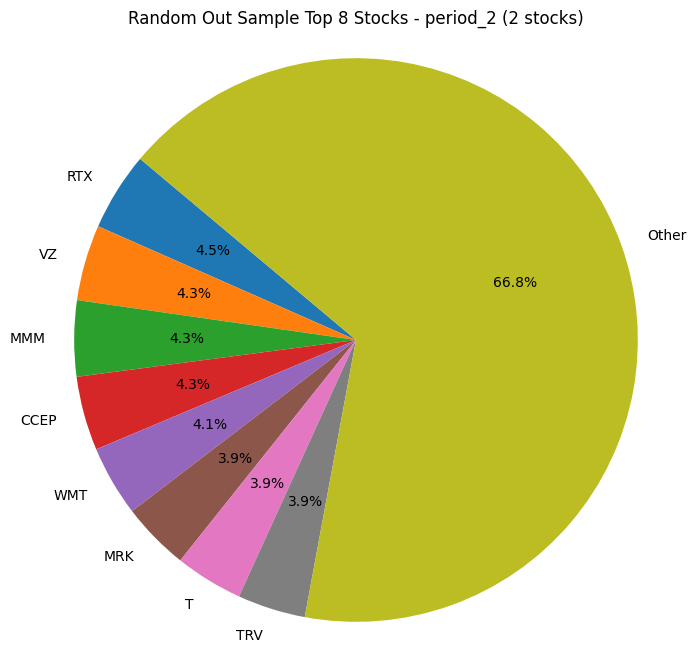

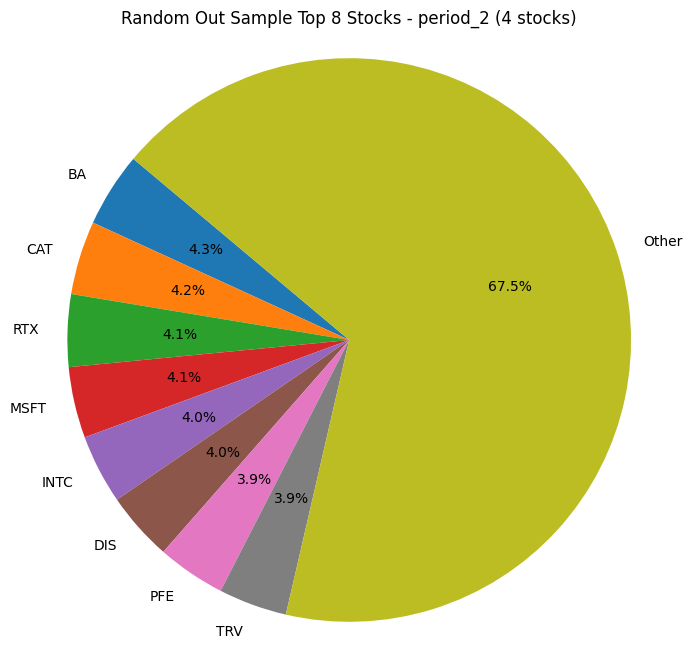

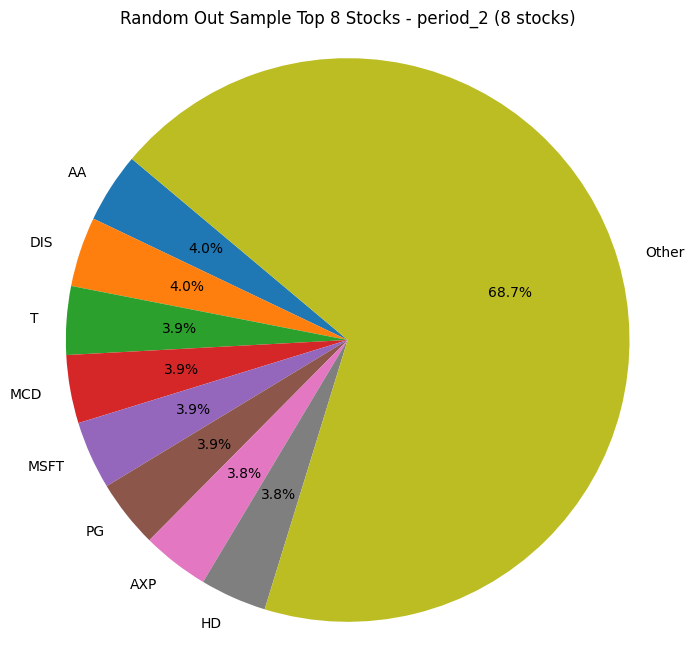

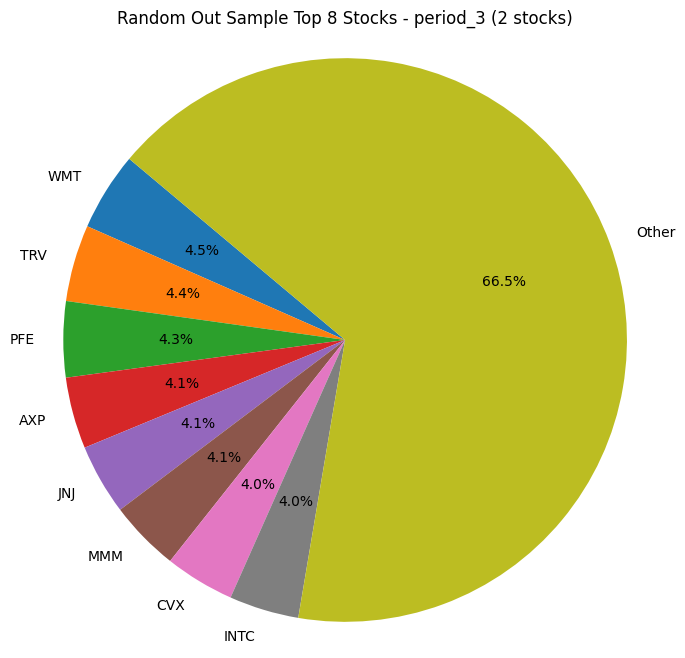

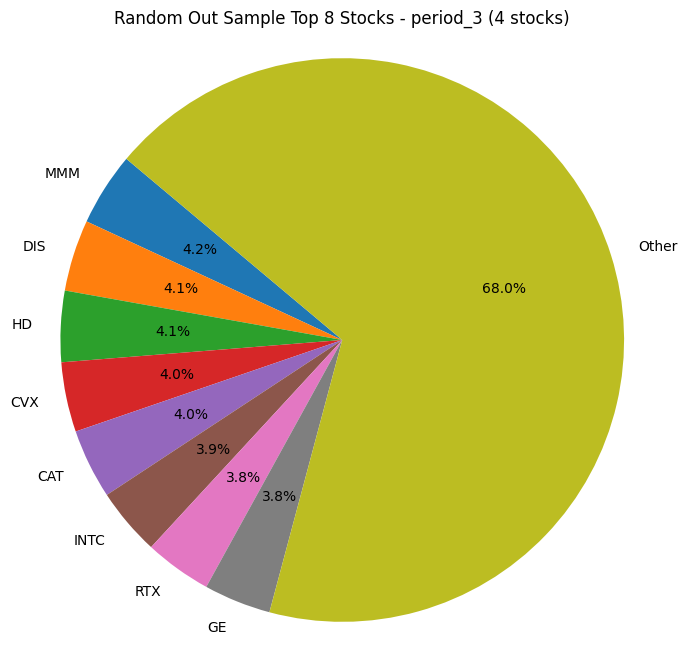

...

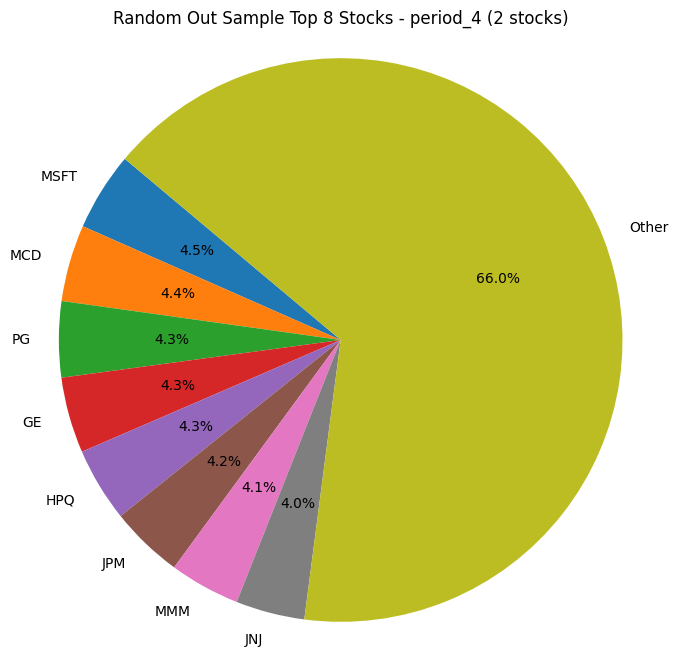

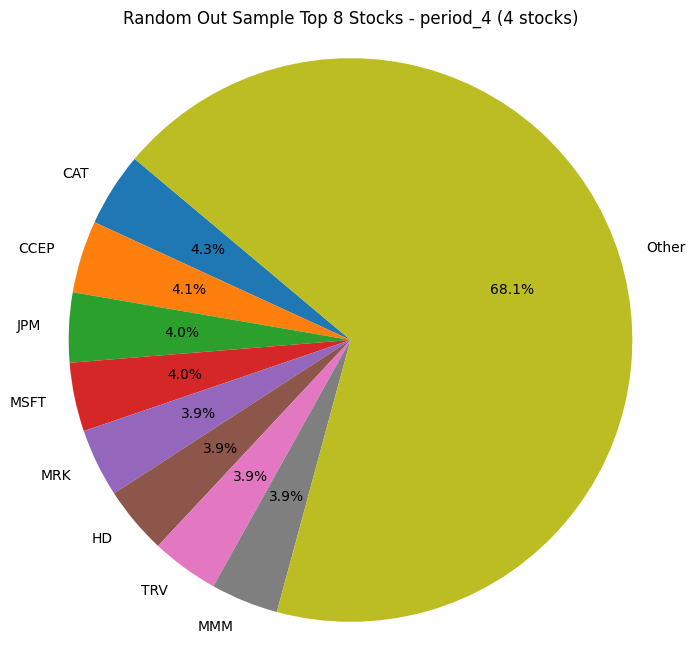

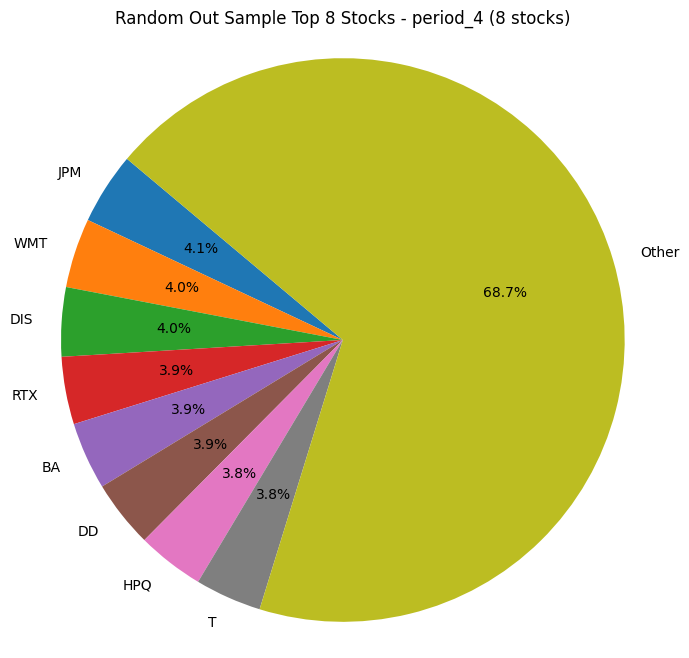

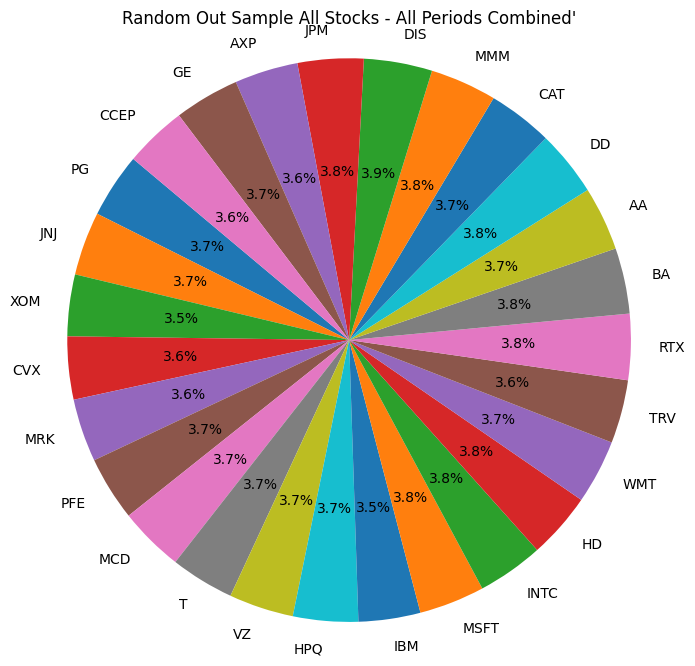

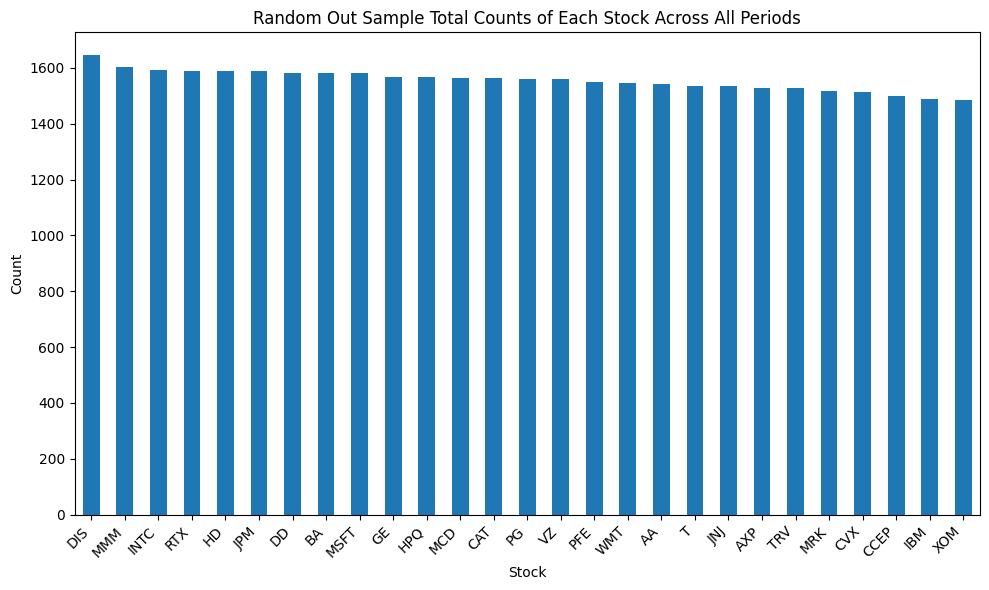

In [126]:
count_of_stocks(result_df_random_test1, custom_tickers, "Random Out Sample")

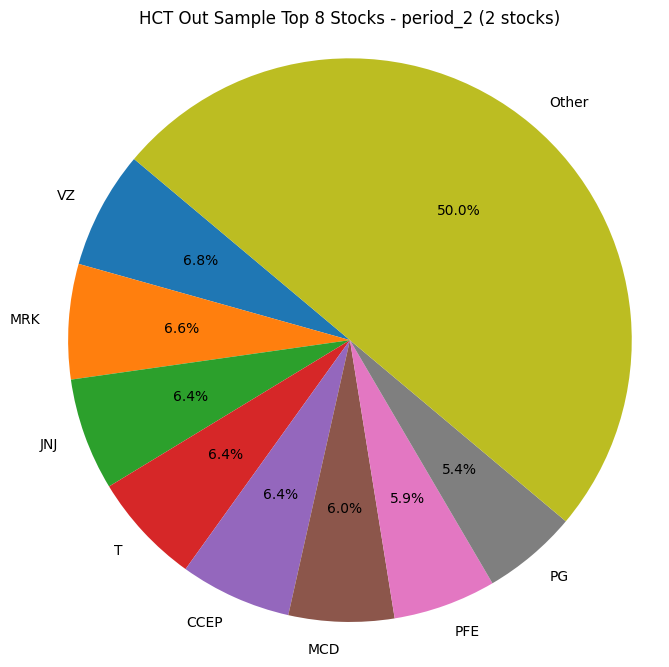

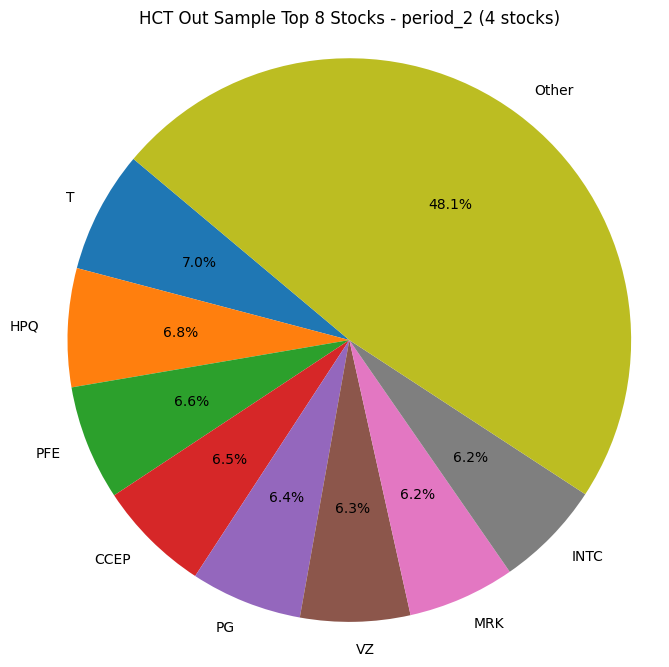

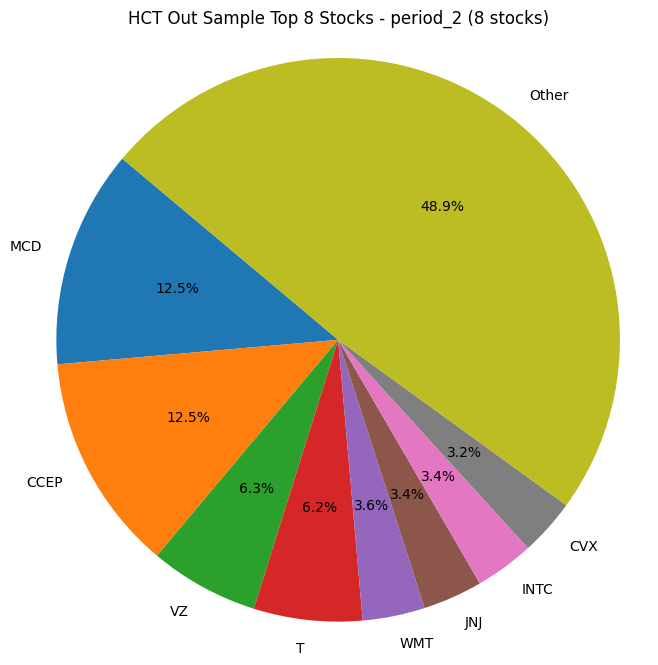

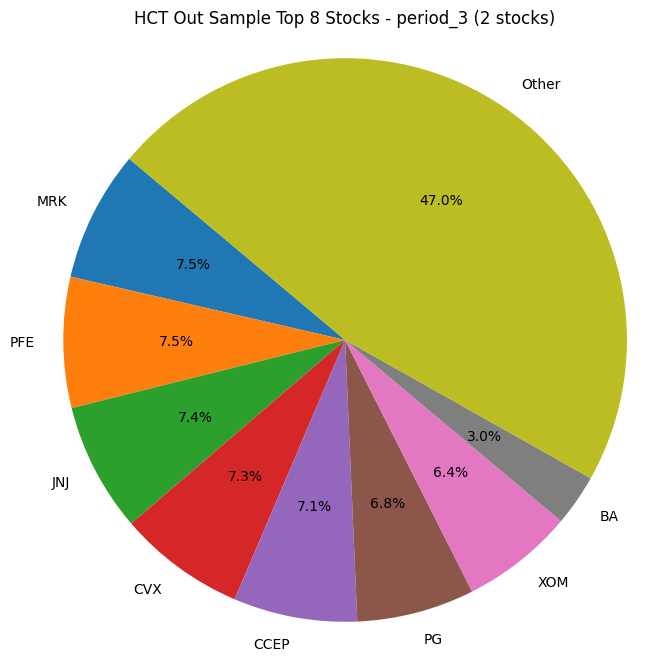

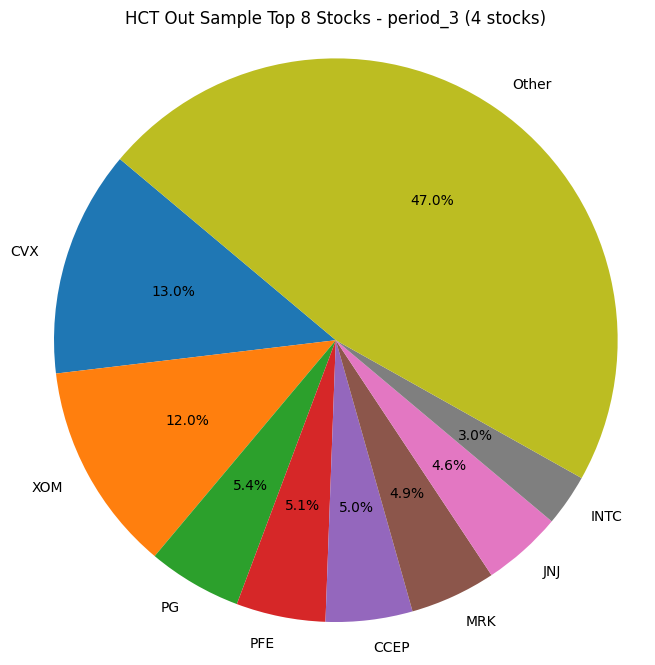

...

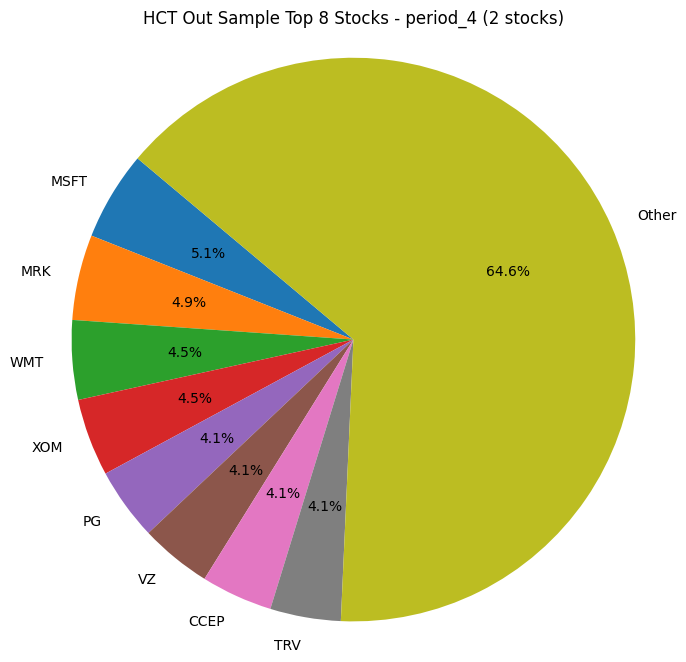

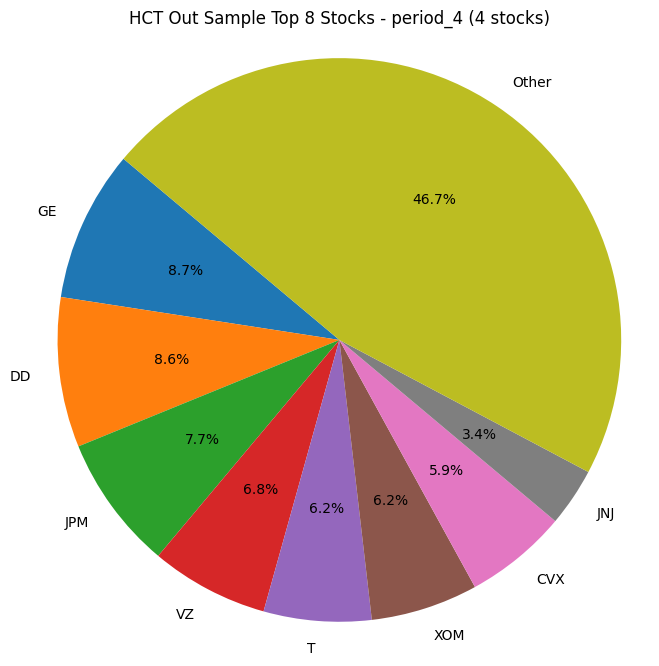

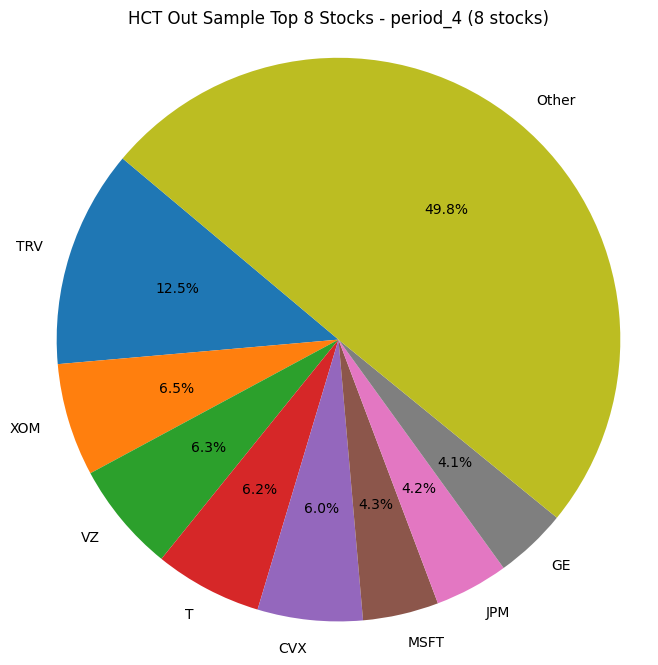

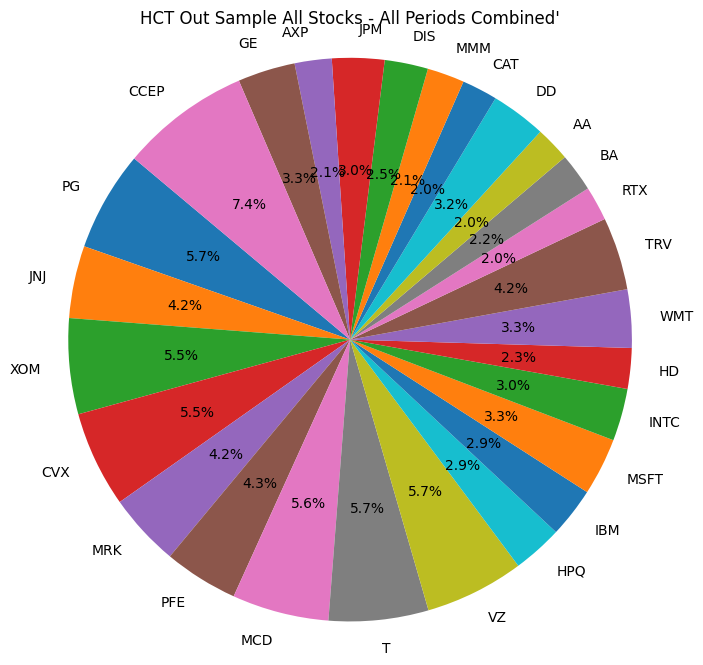

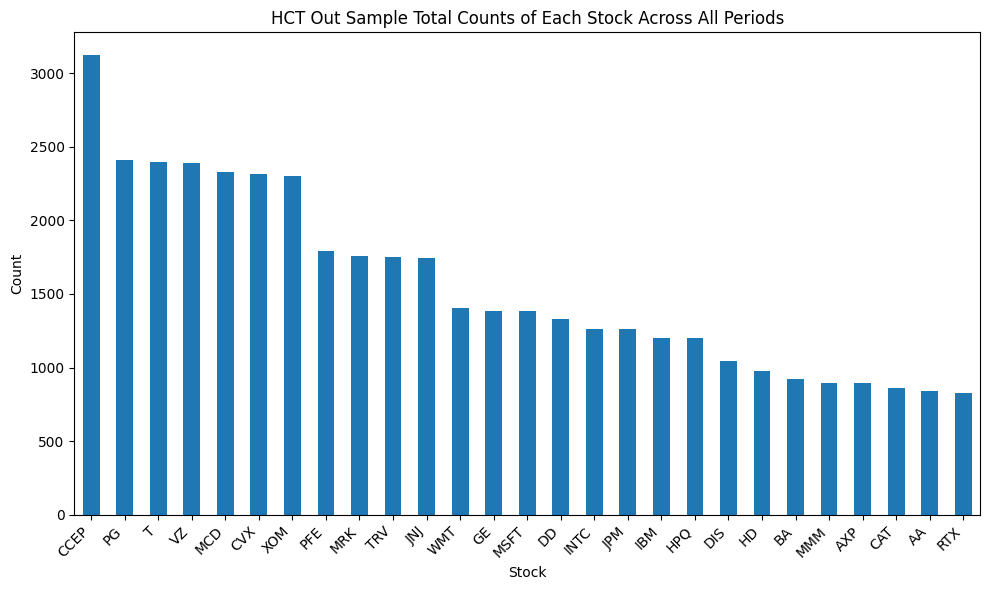

In [127]:
count_of_stocks(result_df_HCT_test1, custom_tickers, "HCT Out Sample")

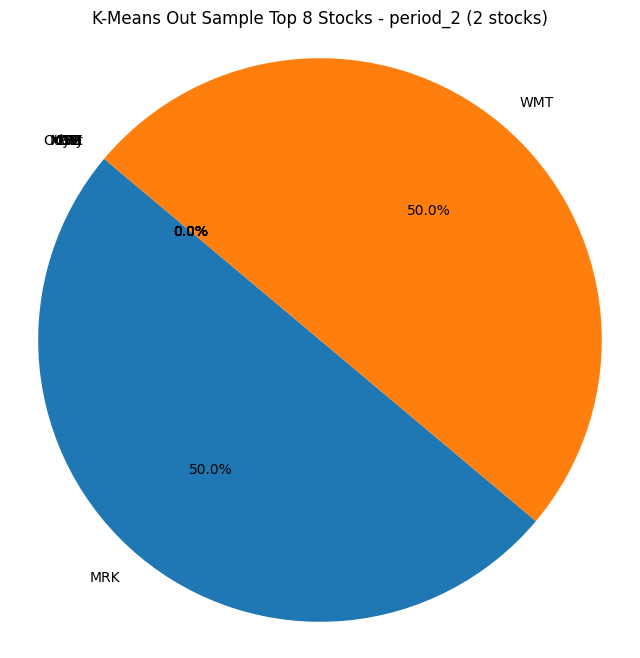

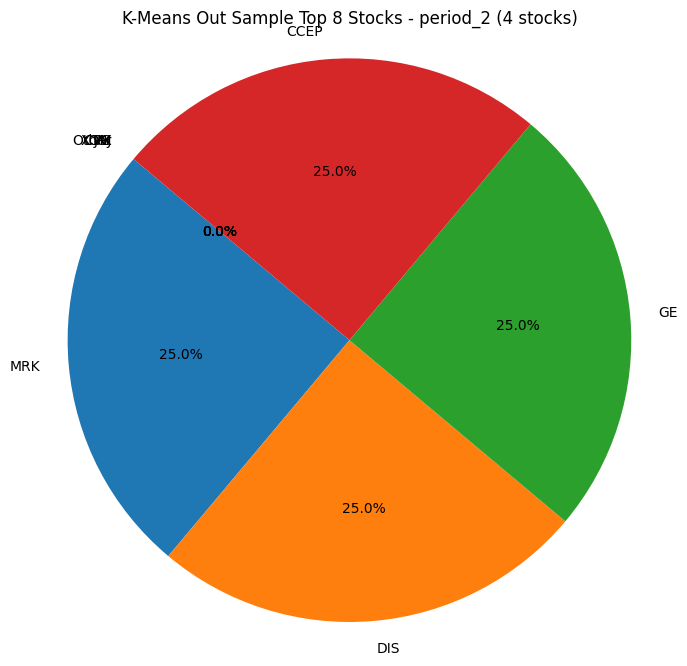

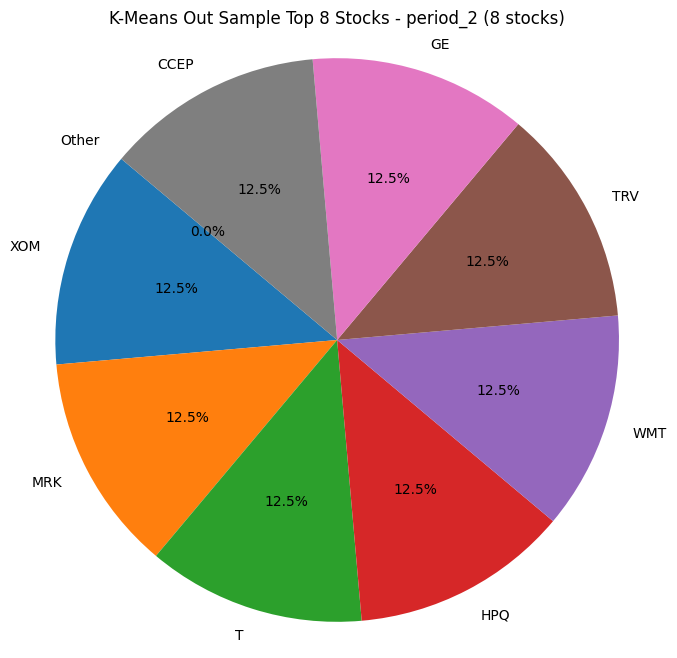

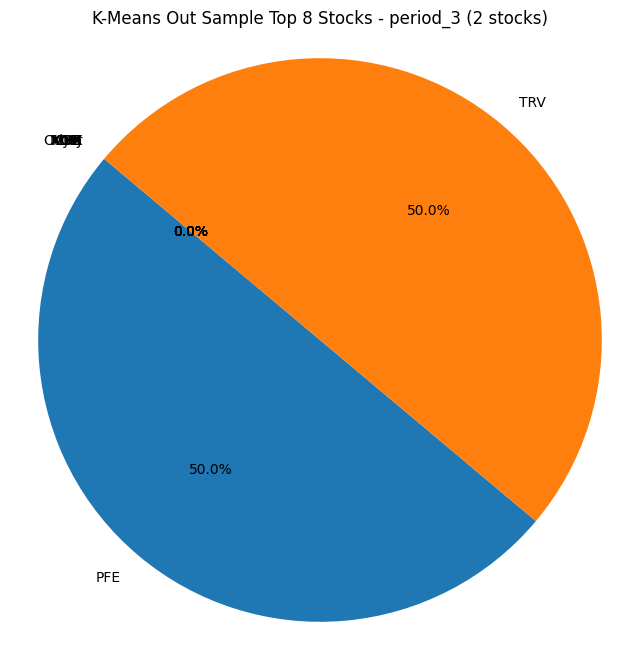

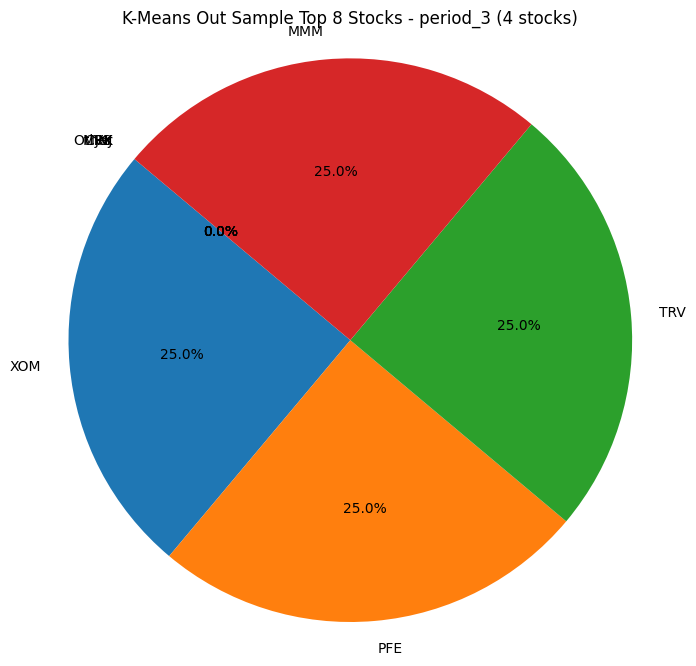

...

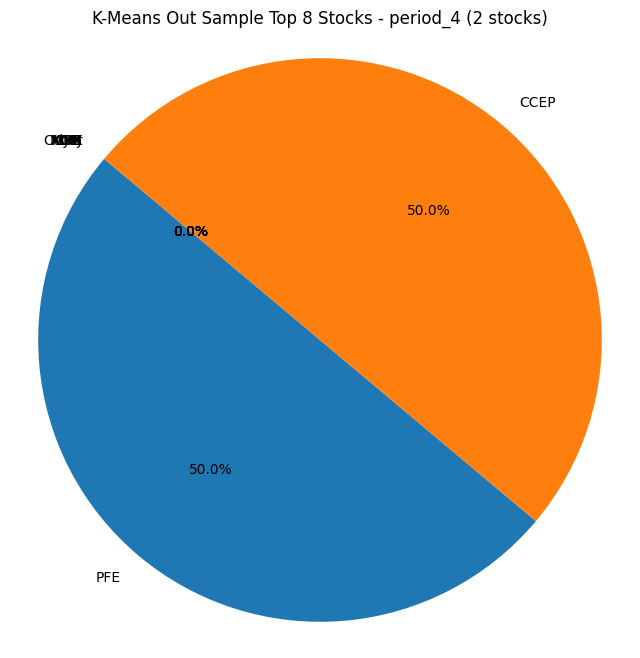

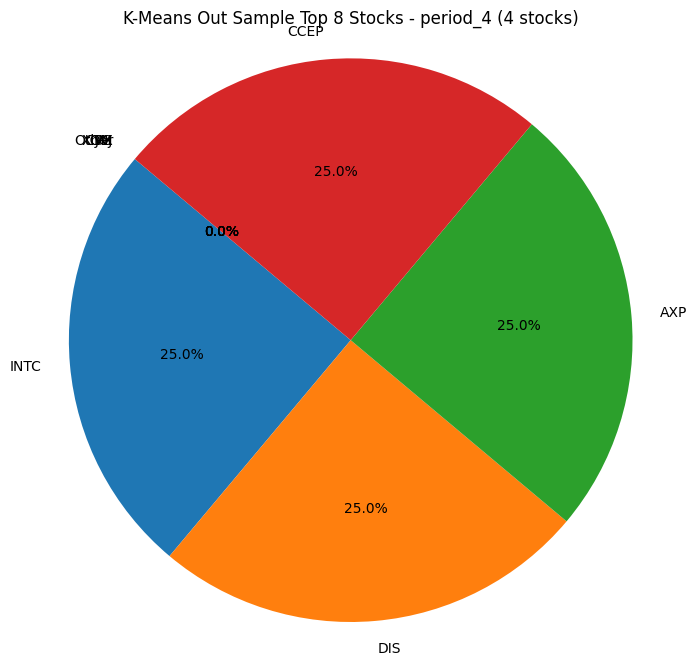

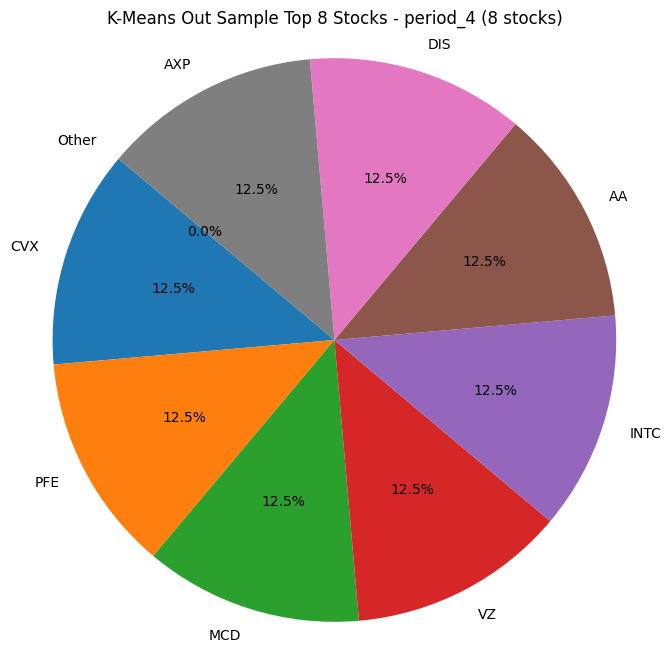

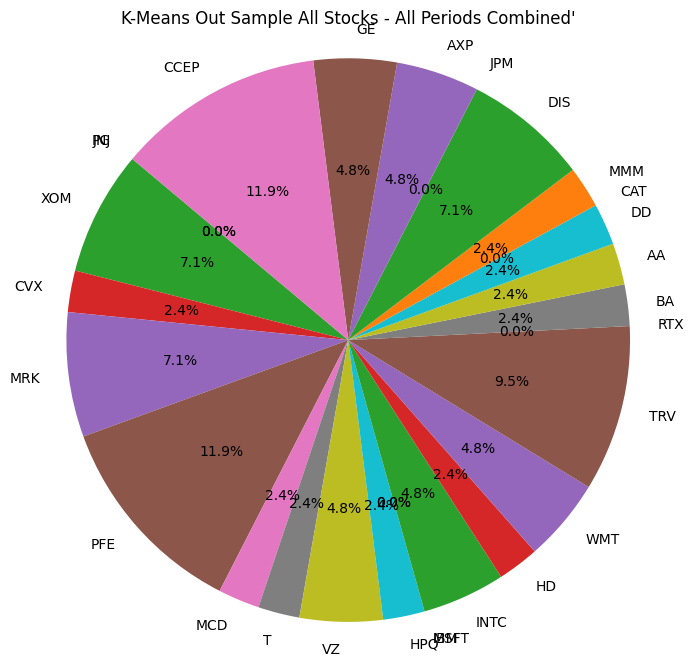

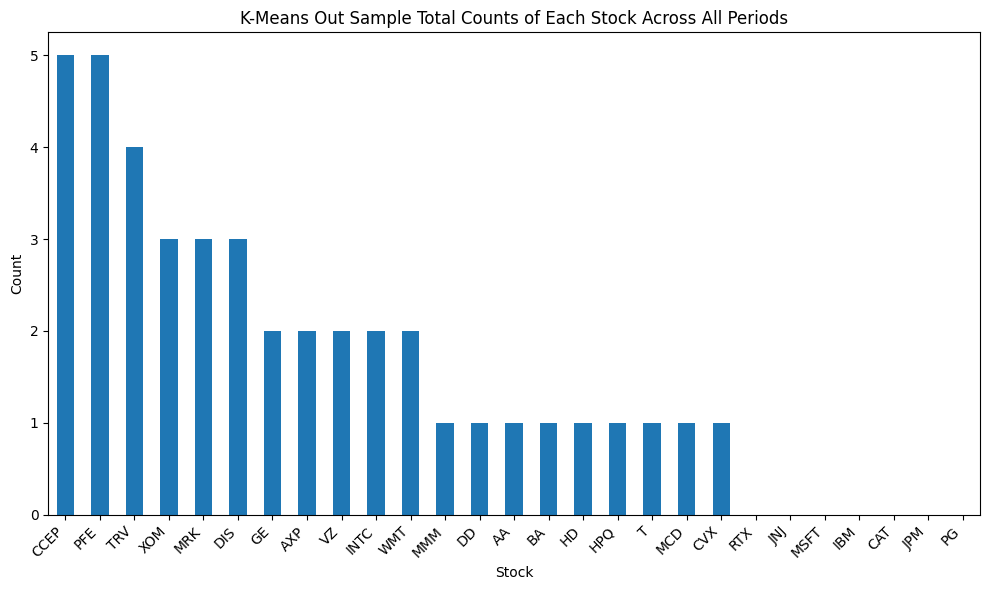

In [128]:
count_of_stocks(result_df_kmeans_test1, custom_tickers, "K-Means Out Sample")

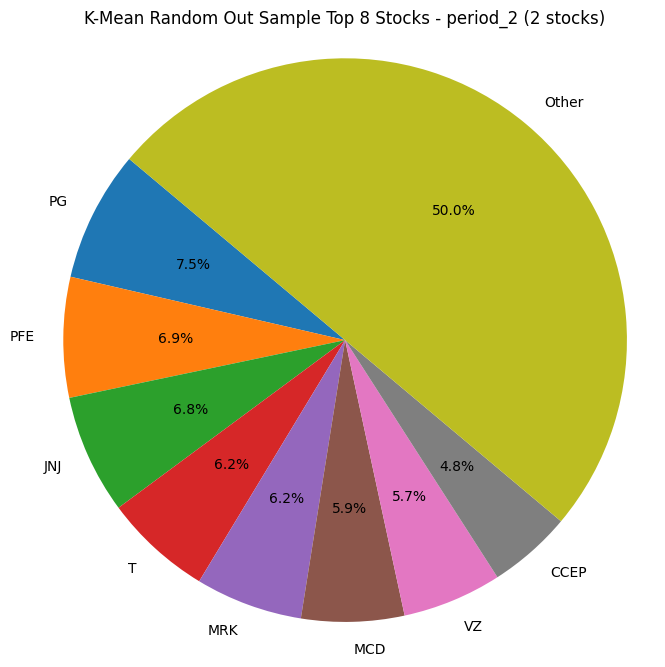

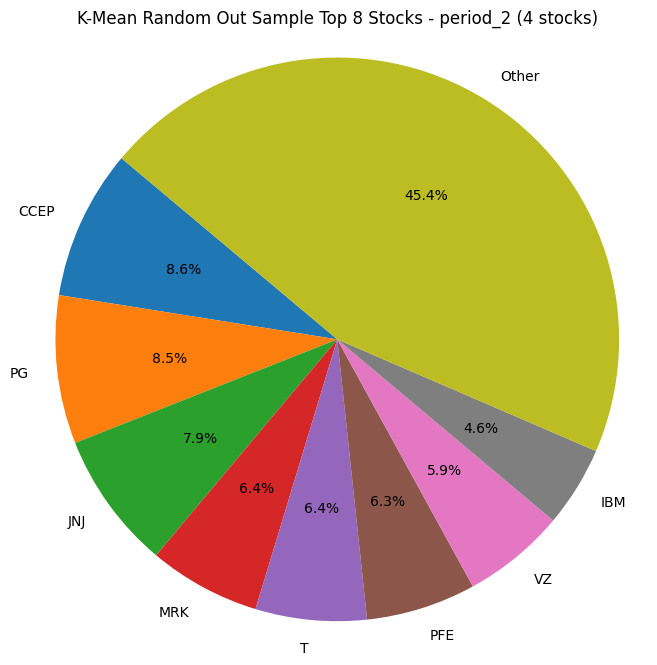

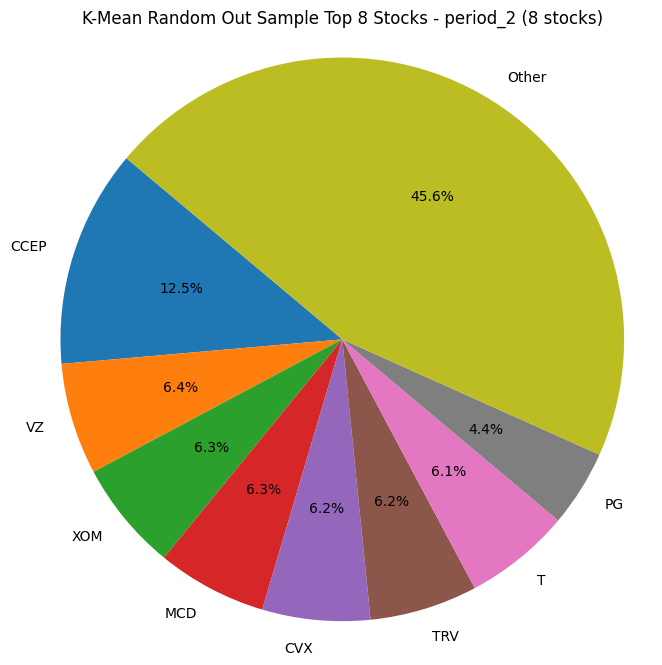

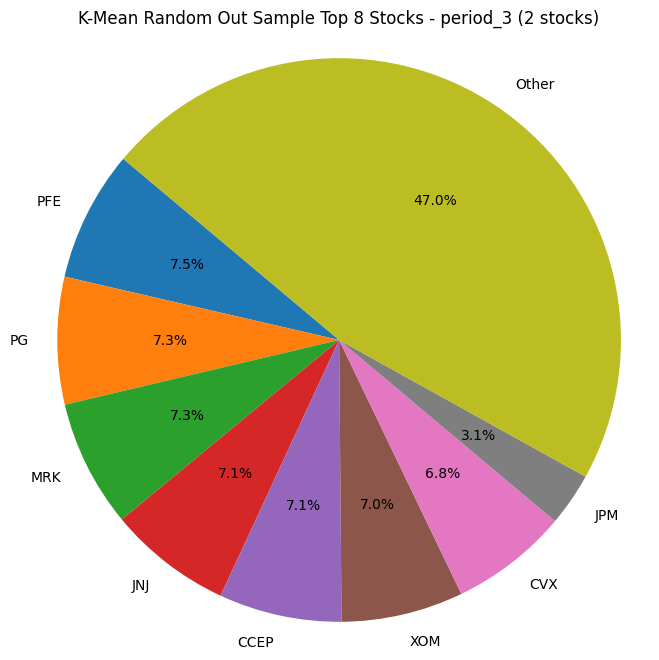

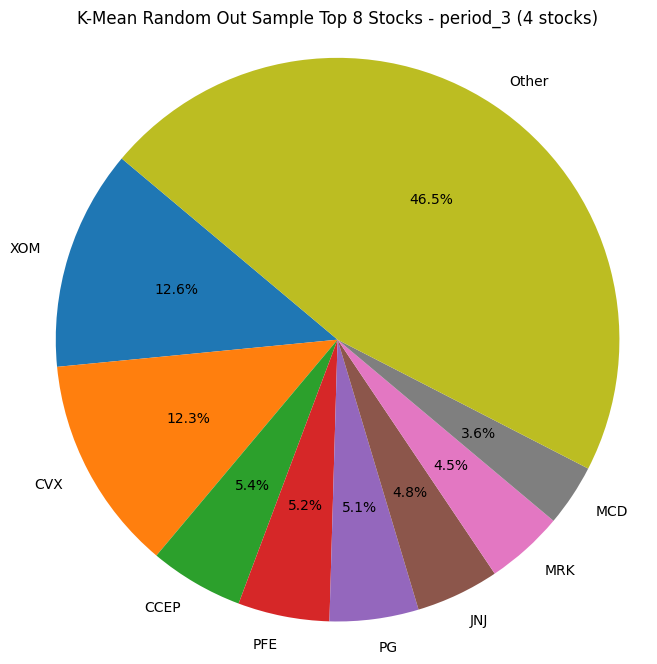

...

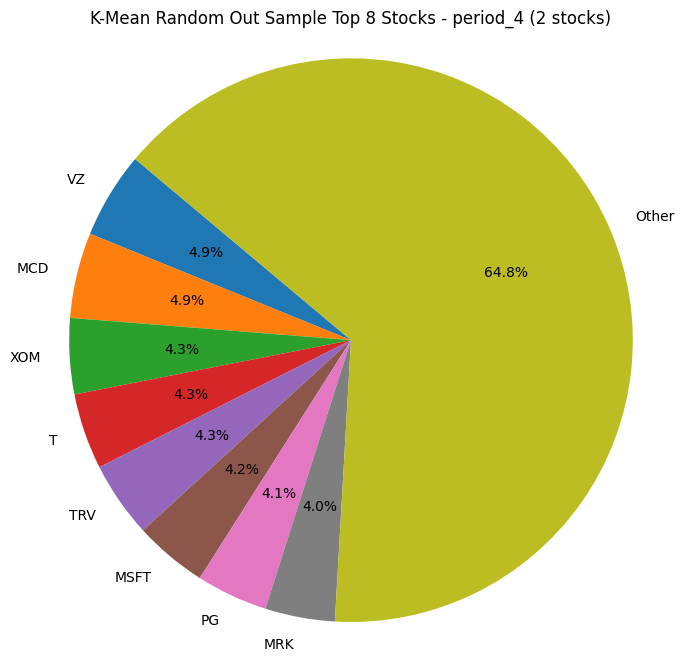

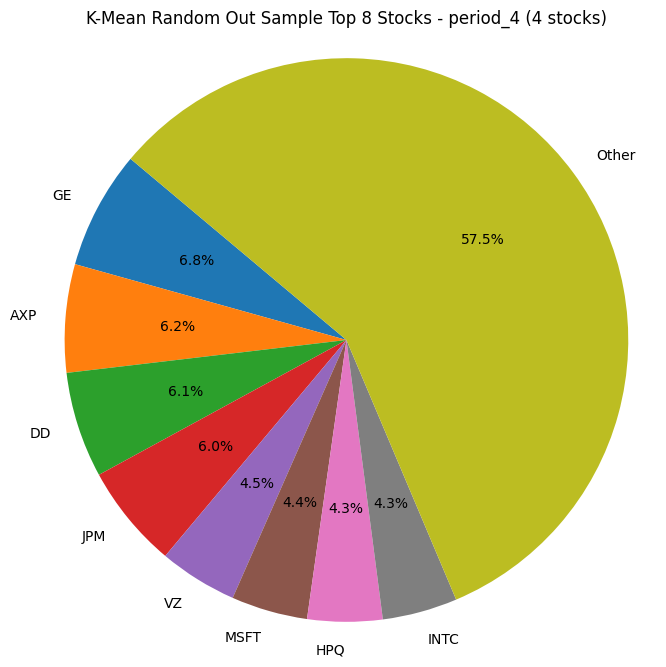

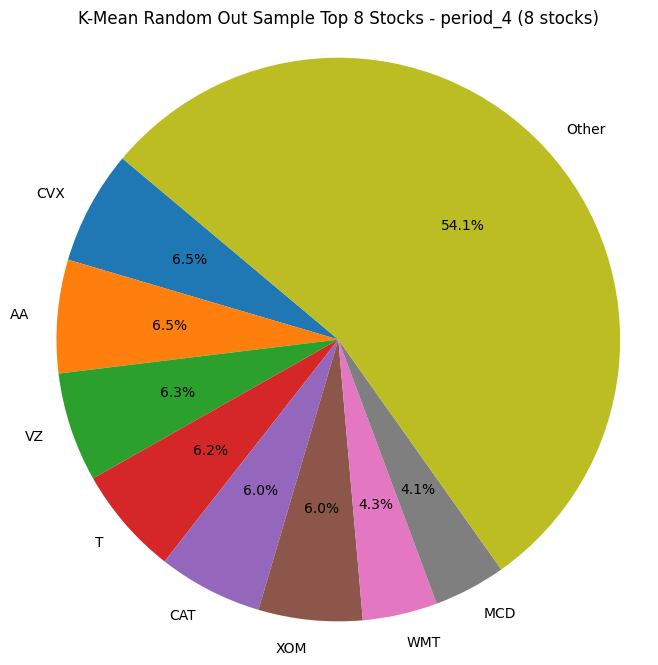

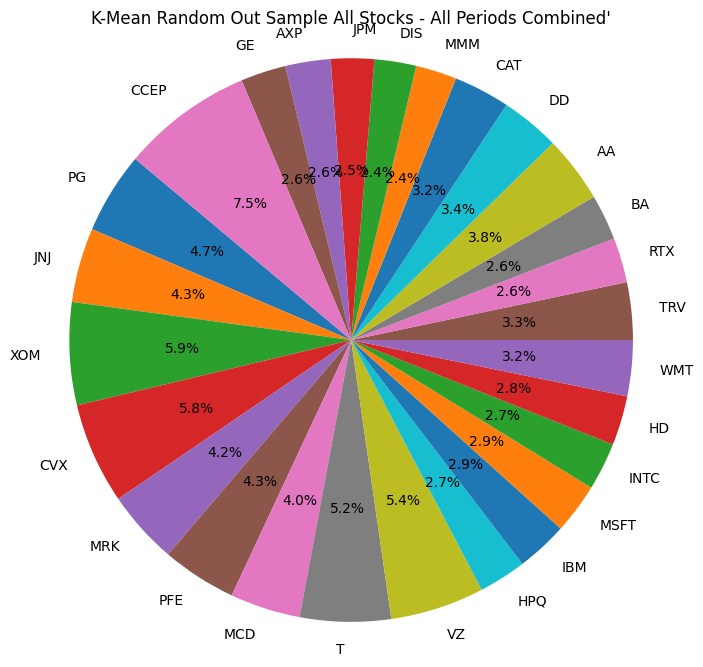

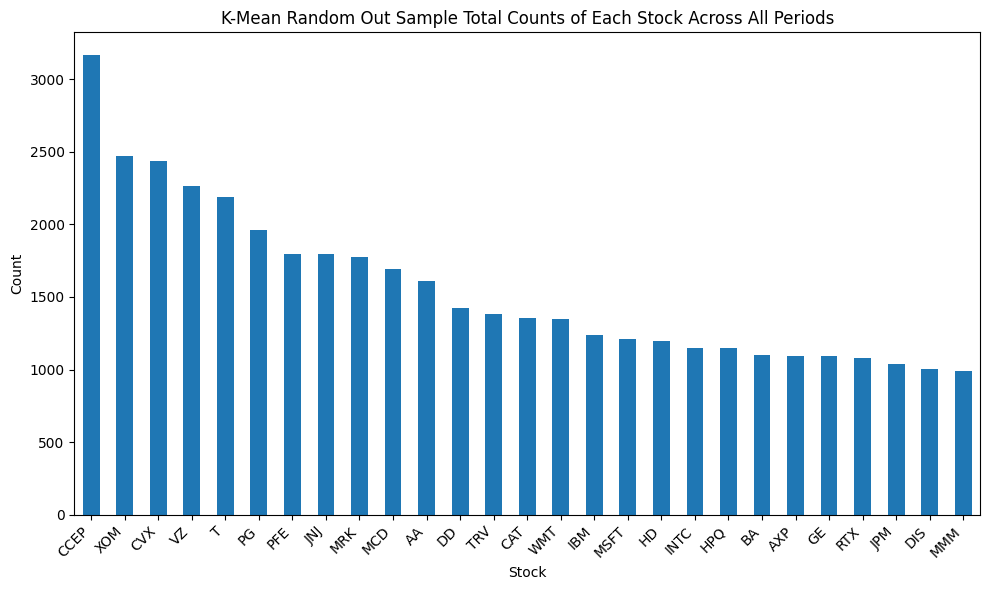

In [129]:
count_of_stocks(result_df_kmeans_rand_test1, custom_tickers, "K-Mean Random Out Sample")

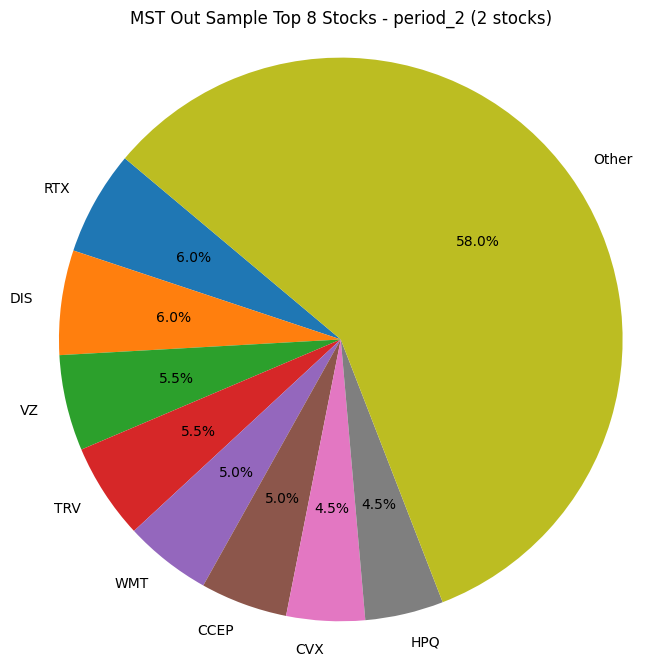

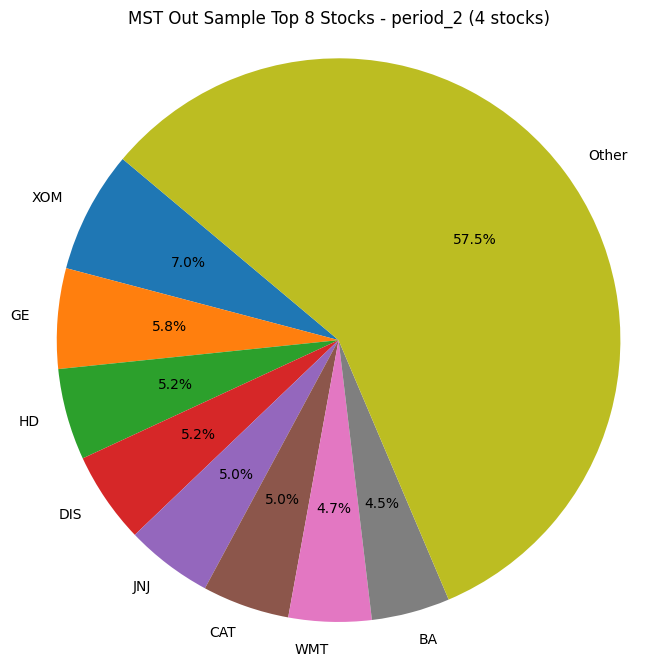

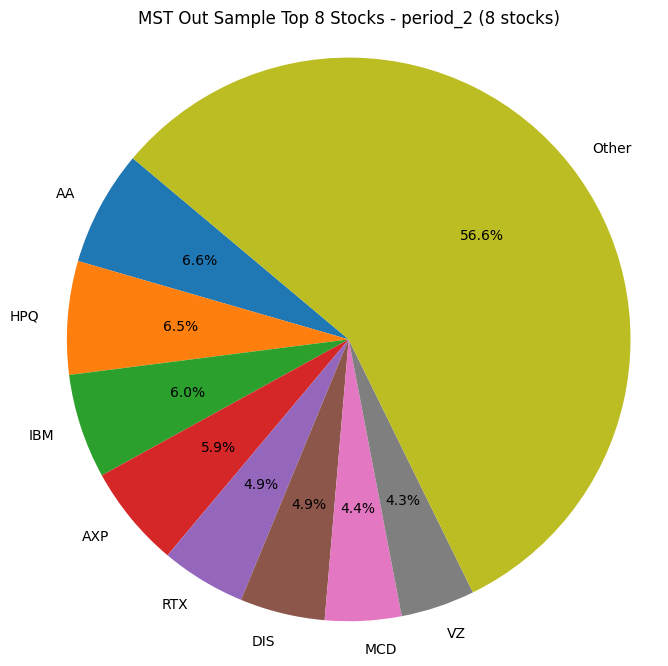

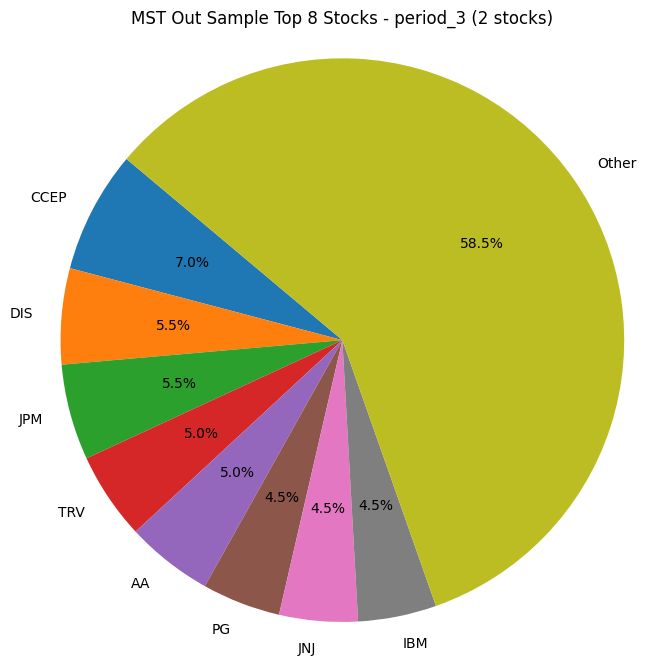

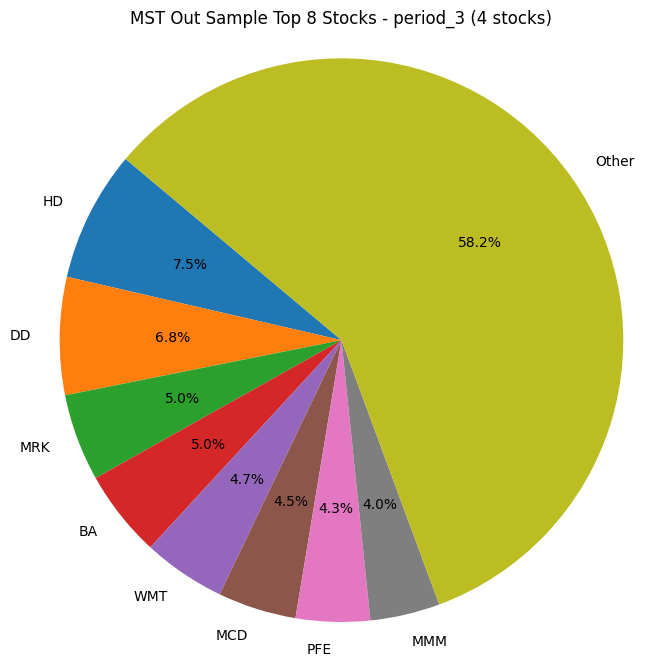

...

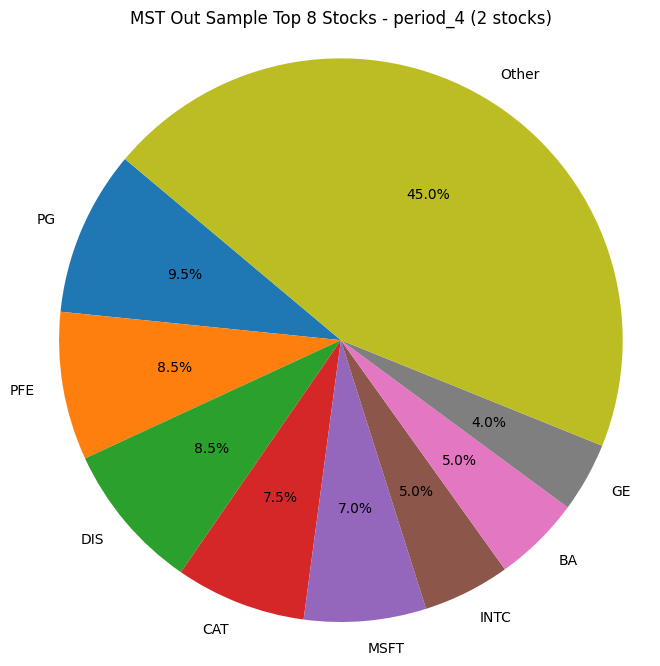

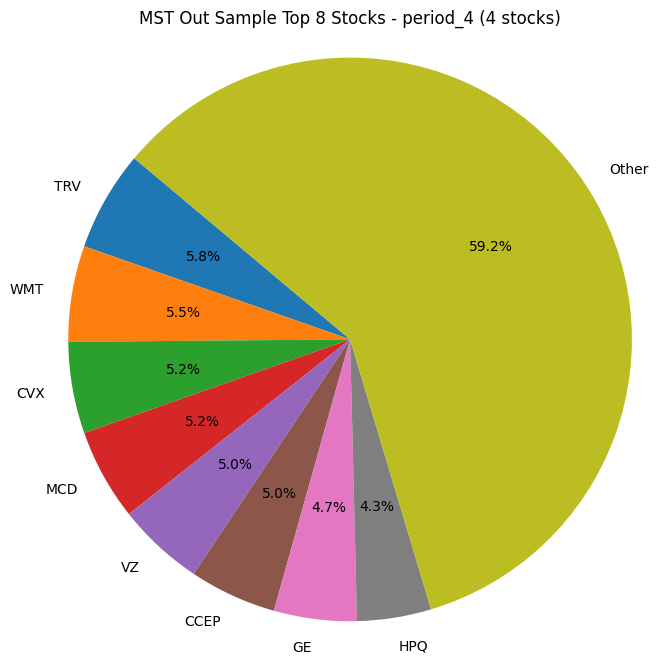

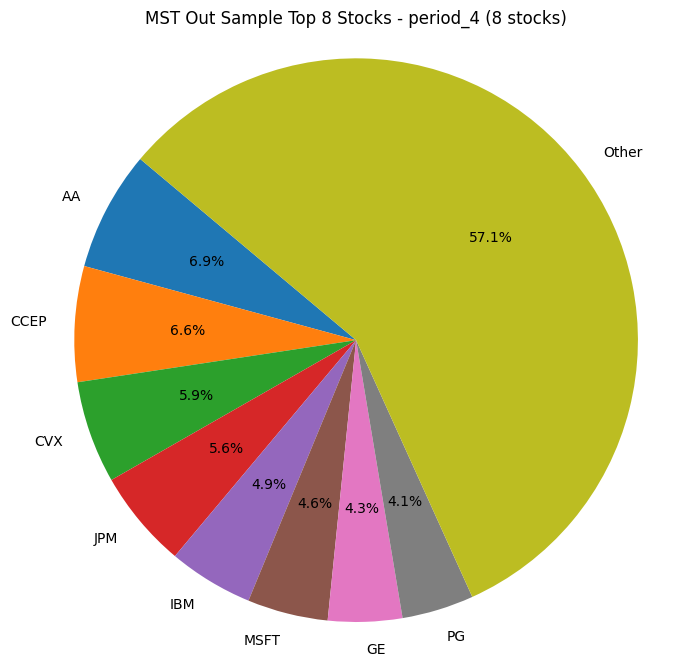

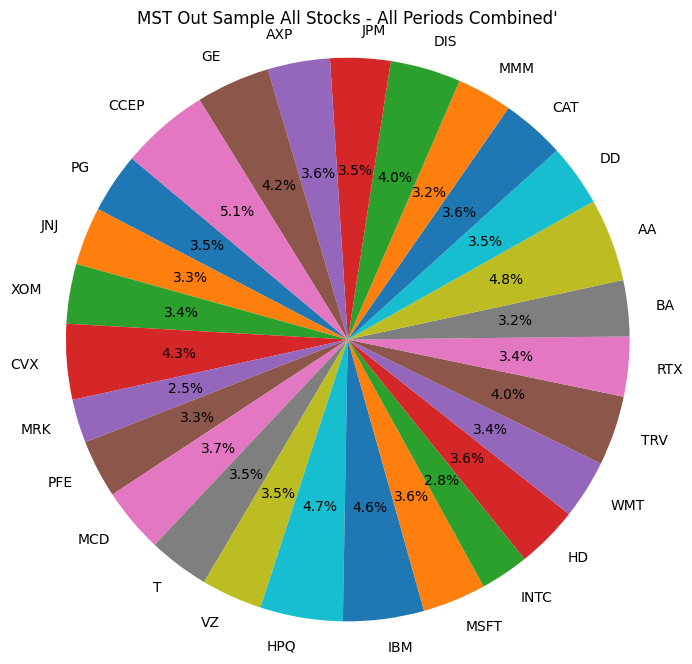

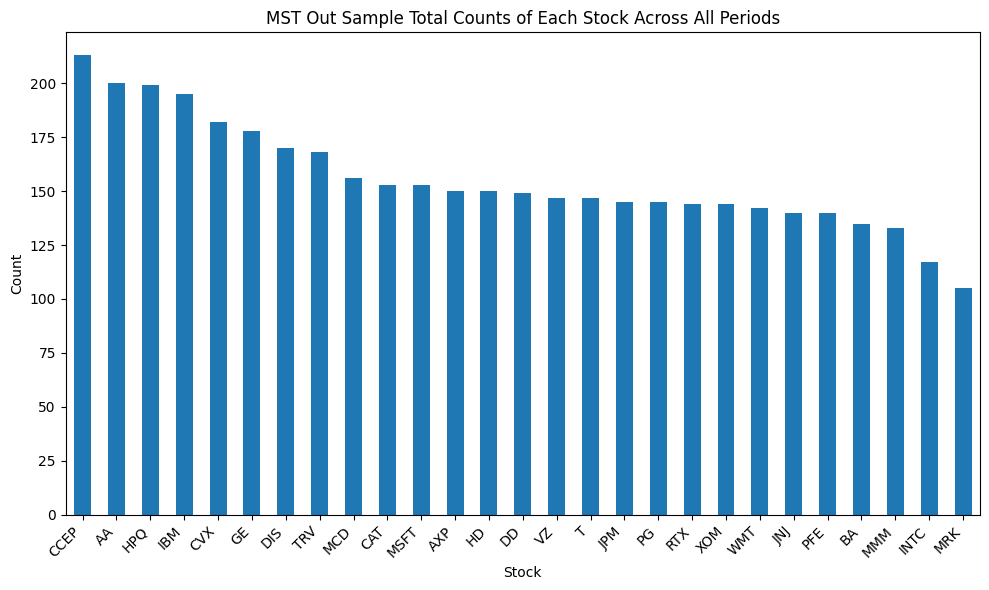

In [130]:
count_of_stocks(mst_result_df_clusters_out_sample, custom_tickers, "MST Out Sample")

[0.2320727792562583, 0.20955435179280596, 0.2570499125662656, -0.020350930501373477, 0.01894089373275726, 0.00010061339112753942, 0.460143130284481, 0.4172773615204098, 0.4014577646583823]


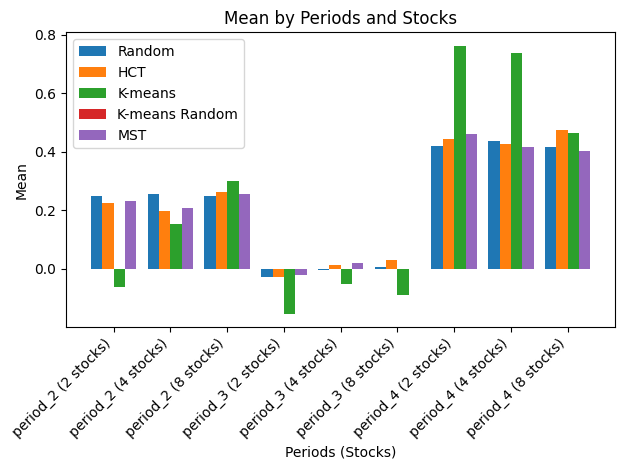

Total Average Mean of Random Values: 0.2222515277924918
Total Average Mean of Cluster Values: 0.22727766669397326
Total Average Mean of K-means Values: 0.2288824209597342
Total Average Mean of K-means Random Values: 0.21958287518901268
Total Average Mean of MST Values: 0.23381138164255455

Period 1 Average Mean of Random Values: 0.2514004085127784
Period 1 Average Mean of Cluster Values: 0.2284226519357385
Period 1 Average Mean of K-means Values: 0.13005731847667082
Period 1 Average Mean of K-means Random Values: 0.2328923478717766
Period 1 Average Mean of MST: 0.27126042413185664

Period 2 Average Mean of Random Values: -0.008788791432906945
Period 2 Average Mean of Cluster Values: 0.004986634399190214
Period 2 Average Mean of K-means Values: -0.09772197566194789
Period 2 Average Mean of K-means Random Values: -0.00043647445916289207
Period 2 Average Mean of MST: 0.0009585744038473088

Period 3 Average Mean of Random Values: 0.42414296629760395
Period 3 Average Mean of Cluster Values:

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


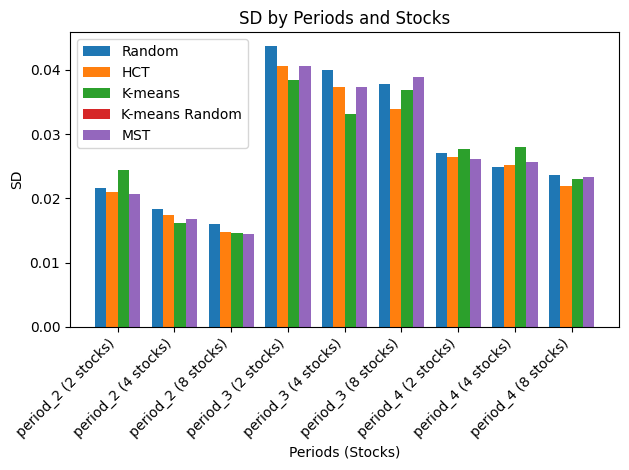

Total Average SD of Random Values: 0.028111979738510064
Total Average SD of Cluster Values: 0.02651850147544441
Total Average SD of K-means Values: 0.02690119388559286
Total Average SD of K-means Random Values: 0.02708645429685355
Total Average SD of MST Values: 0.028355269412558098

Period 1 Average SD of Random Values: 0.018670415202119525
Period 1 Average SD of Cluster Values: 0.017787622179736135
Period 1 Average SD of K-means Values: 0.018375825854512515
Period 1 Average SD of K-means Random Values: 0.01734001891964308
Period 1 Average SD of MST: 0.0187759895990255

Period 2 Average SD of Random Values: 0.04045603106662704
Period 2 Average SD of Cluster Values: 0.0372765127769893
Period 2 Average SD of K-means Values: 0.036128997460153016
Period 2 Average SD of K-means Random Values: 0.03893851124376547
Period 2 Average SD of MST: 0.04096899633892725

Period 3 Average SD of Random Values: 0.025209492946783627
Period 3 Average SD of Cluster Values: 0.02449136946960781
Period 3 Aver

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


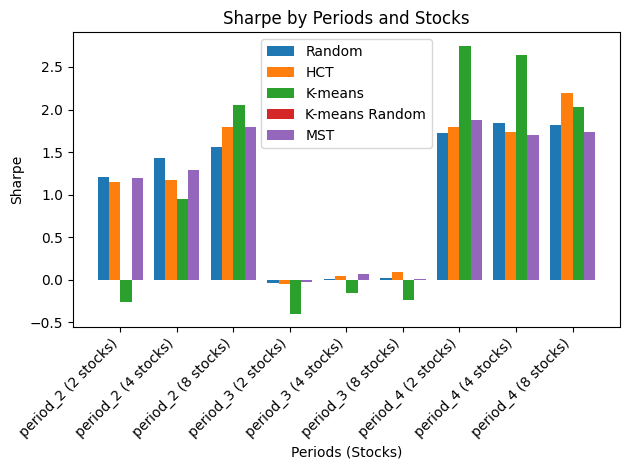

Total Average Sharpe of Random Values: 1.063205553305196
Total Average Sharpe of Cluster Values: 1.1023679207193748
Total Average Sharpe of K-means Values: 1.0396053295264387
Total Average Sharpe of K-means Random Values: 1.0692811660480477
Total Average Sharpe of MST Values: 1.09699788716532

Period 1 Average Sharpe of Random Values: 1.3999750880073156
Period 1 Average Sharpe of Cluster Values: 1.3698390238790035
Period 1 Average Sharpe of K-means Values: 0.9136907057312463
Period 1 Average Sharpe of K-means Random Values: 1.424633146341234
Period 1 Average Sharpe of MST: 1.498416377287973

Period 2 Average Sharpe of Random Values: -0.003228934594847231
Period 2 Average Sharpe of Cluster Values: 0.02891188867285882
Period 2 Average Sharpe of K-means Values: -0.26490864438203016
Period 2 Average Sharpe of K-means Random Values: 0.01285944230146776
Period 2 Average Sharpe of MST: 0.018524056522632323

Period 3 Average Sharpe of Random Values: 1.7928705065031194
Period 3 Average Sharpe o

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


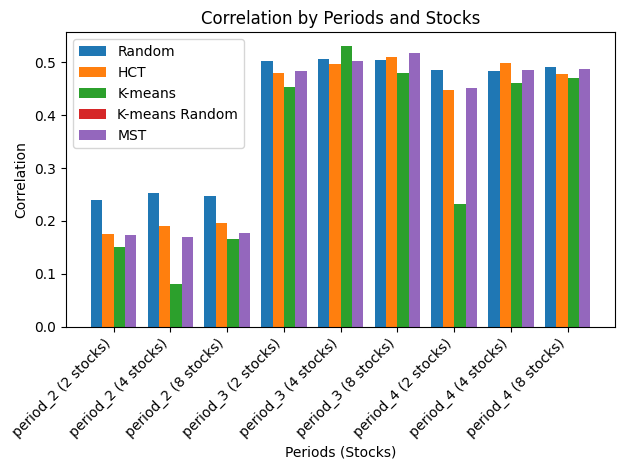

Total Average Correlation of Random Values: 0.41211433695378574
Total Average Correlation of Cluster Values: 0.3856263994926402
Total Average Correlation of K-means Values: 0.3357597499613712
Total Average Correlation of K-means Random Values: 0.38246617022851637
Total Average Correlation of MST Values: 0.41161114799800447

Period 1 Average Correlation of Random Values: 0.24676106839075804
Period 1 Average Correlation of Cluster Values: 0.1871091204546473
Period 1 Average Correlation of K-means Values: 0.1325716325520038
Period 1 Average Correlation of K-means Random Values: 0.17348811233291542
Period 1 Average Correlation of MST: 0.24690549022576117

Period 2 Average Correlation of Random Values: 0.5036736660180626
Period 2 Average Correlation of Cluster Values: 0.4949278001337591
Period 2 Average Correlation of K-means Values: 0.48720603211891667
Period 2 Average Correlation of K-means Random Values: 0.5002354450246577
Period 2 Average Correlation of MST: 0.5009327893183254

Period 3

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [131]:
# Plotting Mean
plot_metric('Mean',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting SD
plot_metric('SD',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample)

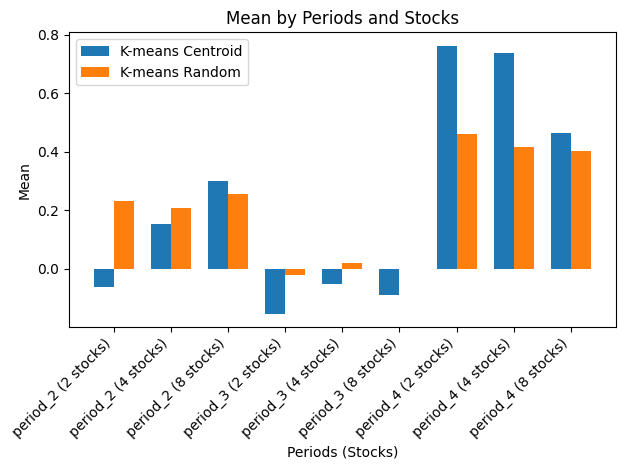

Total Average Mean of K-means Centroid Values: 0.2288824209597342
Total Average Mean of K-means Random Values: 0.21958287518901268

Period 1 Average Mean of K-means Centroid Values: 0.13005731847667082
Period 1 Average Mean of K-means Random Values: 0.2328923478717766
Period 2 Average Mean of K-means Centroid Values: -0.09772197566194789
Period 2 Average Mean of K-means Random Values: -0.00043647445916289207
Period 3 Average Mean of K-means Centroid Values: 0.6543119200644797
Period 3 Average Mean of K-means Random Values: 0.42629275215442436


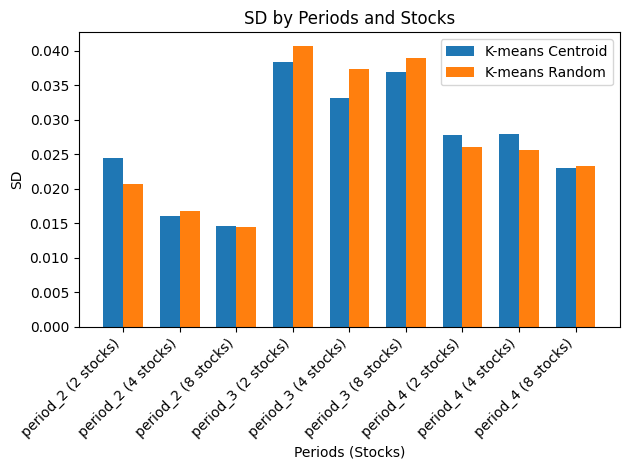

Total Average SD of K-means Centroid Values: 0.02690119388559286
Total Average SD of K-means Random Values: 0.02708645429685355

Period 1 Average SD of K-means Centroid Values: 0.018375825854512515
Period 1 Average SD of K-means Random Values: 0.01734001891964308
Period 2 Average SD of K-means Centroid Values: 0.036128997460153016
Period 2 Average SD of K-means Random Values: 0.03893851124376547
Period 3 Average SD of K-means Centroid Values: 0.026198758342113052
Period 3 Average SD of K-means Random Values: 0.024980832727152107


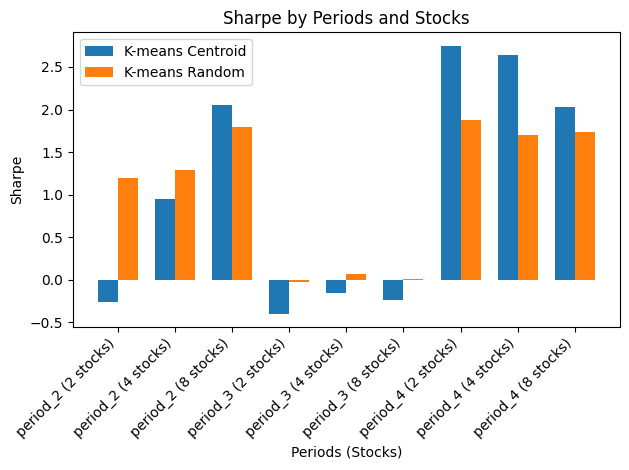

Total Average Sharpe of K-means Centroid Values: 1.0396053295264387
Total Average Sharpe of K-means Random Values: 1.0692811660480477

Period 1 Average Sharpe of K-means Centroid Values: 0.9136907057312463
Period 1 Average Sharpe of K-means Random Values: 1.424633146341234
Period 2 Average Sharpe of K-means Centroid Values: -0.26490864438203016
Period 2 Average Sharpe of K-means Random Values: 0.01285944230146776
Period 3 Average Sharpe of K-means Centroid Values: 2.4700339272300997
Period 3 Average Sharpe of K-means Random Values: 1.7703509095014416


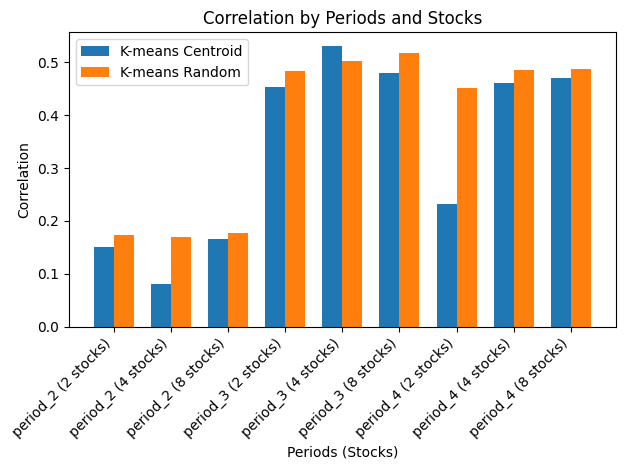

Total Average Correlation of K-means Centroid Values: 0.3357597499613712
Total Average Correlation of K-means Random Values: 0.38246617022851637

Period 1 Average Correlation of K-means Centroid Values: 0.1325716325520038
Period 1 Average Correlation of K-means Random Values: 0.17348811233291542
Period 2 Average Correlation of K-means Centroid Values: 0.48720603211891667
Period 2 Average Correlation of K-means Random Values: 0.5002354450246577
Period 3 Average Correlation of K-means Centroid Values: 0.3875015852131931
Period 3 Average Correlation of K-means Random Values: 0.473674953327976


In [132]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test1,result_df_kmeans_rand_test1)